In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd

apple_df = pd.read_csv('/content/drive/MyDrive/AAPL (2).csv')
microsoft_df = pd.read_csv('/content/drive/MyDrive/MSFT.csv')

# Calculate moving averages and daily returns for both datasets
def preprocess(df):
    df['MA_5'] = df['Close'].rolling(window=5).mean()
    df['MA_10'] = df['Close'].rolling(window=10).mean()
    df['Daily_Return'] = df['Close'].pct_change() * 100
    return df

apple_df = preprocess(apple_df)
microsoft_df = preprocess(microsoft_df)

apple_df_head = apple_df.head()
microsoft_df_head = microsoft_df.head()

apple_df_head, microsoft_df_head

(         Date      Open      High       Low     Close  Adj Close      Volume  \
 0  2004-01-12  0.415179  0.443571  0.401786  0.405714   0.342615  3177636000   
 1  2004-01-19  0.404821  0.410179  0.396071  0.402857   0.340203   974780800   
 2  2004-01-26  0.401071  0.417500  0.396250  0.402857   0.340203  1251740000   
 3  2004-02-02  0.401071  0.409107  0.387500  0.405536   0.342465  1319981600   
 4  2004-02-09  0.403929  0.430357  0.400714  0.410714   0.346838  1292116000   
 
        MA_5  MA_10  Daily_Return  
 0       NaN    NaN           NaN  
 1       NaN    NaN     -0.704191  
 2       NaN    NaN      0.000000  
 3       NaN    NaN      0.665000  
 4  0.405536    NaN      1.276829  ,
          Date       Open       High        Low      Close  Adj Close  \
 0  2004-01-01  27.580000  28.309999  27.330000  28.209999  17.547934   
 1  2004-01-08  28.389999  28.480000  27.260000  27.700001  17.230698   
 2  2004-01-15  27.549999  28.299999  27.420000  28.299999  17.603922   
 3 

In [ ]:
# check for missing data in apple\s and microsofts dataset
missing_data_apple = apple_df.isnull().sum()

missing_data_microsoft = microsoft_df.isnull().sum()

print("Missing Data in Apple Dataset:")
print(missing_data_apple)

print("\nMissing Data in Microsoft Dataset:")
print(missing_data_microsoft)

Missing Data in Apple Dataset:
Date            0
Open            0
High            0
Low             0
Close           0
Adj Close       0
Volume          0
MA_5            4
MA_10           9
Daily_Return    1
dtype: int64

Missing Data in Microsoft Dataset:
Date            0
Open            0
High            0
Low             0
Close           0
Adj Close       0
Volume          0
MA_5            4
MA_10           9
Daily_Return    1
dtype: int64


In [ ]:
# Drop rows with missing values for both datasets
apple_df_cleaned = apple_df.dropna()
microsoft_df_cleaned = microsoft_df.dropna()

print("Apple dataset after cleaning:")
print(apple_df_cleaned.isnull().sum())

print("\nMicrosoft dataset after cleaning:")
print(microsoft_df_cleaned.isnull().sum())

Apple dataset after cleaning:
Date            0
Open            0
High            0
Low             0
Close           0
Adj Close       0
Volume          0
MA_5            0
MA_10           0
Daily_Return    0
dtype: int64

Microsoft dataset after cleaning:
Date            0
Open            0
High            0
Low             0
Close           0
Adj Close       0
Volume          0
MA_5            0
MA_10           0
Daily_Return    0
dtype: int64


In [ ]:
# preprocessing function to calculate moving averages and daily returns (updated)
def preprocess_data(df):
    # work with a copy of the DataFrame to avoid SettingWithCopyWarning
    df = df.copy()

    # calculate 5-day and 10-day moving averages
    df['MA_5'] = df['Close'].rolling(window=5).mean()
    df['MA_10'] = df['Close'].rolling(window=10).mean()

    # calculate daily returns (percentage change in the closing price)
    df['Daily_Return'] = df['Close'].pct_change() * 100

    # Drop any rows that contain NaN values (caused by the rolling mean or pct_change)
    df = df.dropna()

    return df

# apply preprocessing to both datasets (again)
apple_df_preprocessed = preprocess_data(apple_df_cleaned)
microsoft_df_preprocessed = preprocess_data(microsoft_df_cleaned)

# display the first few rows of the cleaned and preprocessed datasets
print("Apple Dataset after Preprocessing:")
print(apple_df_preprocessed.head())

print("\nMicrosoft Dataset after Preprocessing:")
print(microsoft_df_preprocessed.head())

Apple Dataset after Preprocessing:
          Date      Open      High       Low     Close  Adj Close      Volume  \
18  2004-05-17  0.476786  0.491071  0.470714  0.484107   0.408816  1258292000   
19  2004-05-24  0.487321  0.513929  0.484107  0.501071   0.423142  1259440000   
20  2004-05-31  0.496250  0.522321  0.493036  0.513929   0.434000  1150889600   
21  2004-06-07  0.518571  0.553036  0.514464  0.548929   0.463557  1318279200   
22  2004-06-14  0.547321  0.596607  0.526786  0.587679   0.496280  2555834400   

        MA_5     MA_10  Daily_Return  
18  0.479714  0.484696      0.184804  
19  0.481000  0.488625      3.504184  
20  0.491714  0.491732      2.566103  
21  0.506250  0.497518      6.810279  
22  0.527143  0.507125      7.059201  

Microsoft Dataset after Preprocessing:
          Date       Open       High        Low      Close  Adj Close  \
18  2004-05-06  26.160000  26.379999  25.430000  25.940001  16.135897   
19  2004-05-13  25.820000  26.270000  25.420000  25.620001

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

# define a function to fine-tune Logistic Regression for both datasets
def fine_tune_logistic_regression(X, y):
    # split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # set up the hyperparameter grid for Logistic Regression
    param_grid = {
        'C': [0.001, 0.01, 0.1, 1, 10, 100],  # Regularization strength
        'solver': ['lbfgs', 'liblinear']  # Optimization algorithm
    }

    # set up GridSearchCV for Logistic Regression
    grid_search = GridSearchCV(LogisticRegression(max_iter=1000), param_grid, cv=5, scoring='accuracy')

    # perform the grid search on the training data
    grid_search.fit(X_train, y_train)

    # get the best parameters and performance
    best_params = grid_search.best_params_
    best_score = grid_search.best_score_

    return best_params, best_score

# prepare the datasets for fine-tuning (features: MA_5 and MA_10, target: binary up/down return)
X_apple = apple_df_preprocessed[['MA_5', 'MA_10']]
y_apple = apple_df_preprocessed['Daily_Return'].apply(lambda x: 1 if x > 0 else 0)  # Binary target (up/down)

X_microsoft = microsoft_df_preprocessed[['MA_5', 'MA_10']]
y_microsoft = microsoft_df_preprocessed['Daily_Return'].apply(lambda x: 1 if x > 0 else 0)

# fine-tune Logistic Regression for Apple dataset
apple_best_params, apple_best_score = fine_tune_logistic_regression(X_apple, y_apple)
print(f"Apple Logistic Regression Best Params: {apple_best_params}, Best Score: {apple_best_score}")

# fine-tune Logistic Regression for Microsoft dataset
microsoft_best_params, microsoft_best_score = fine_tune_logistic_regression(X_microsoft, y_microsoft)
print(f"Microsoft Logistic Regression Best Params: {microsoft_best_params}, Best Score: {microsoft_best_score}")

Apple Logistic Regression Best Params: {'C': 0.01, 'solver': 'lbfgs'}, Best Score: 0.587995337995338
Microsoft Logistic Regression Best Params: {'C': 0.001, 'solver': 'lbfgs'}, Best Score: 0.545959595959596


In [ ]:
# define a function to classify returns based on thresholds
def classify_thresholds(df, thresholds):
    for low, high in thresholds:
        df[f'Return_Class_{low}_{high}'] = df['Daily_Return'].apply(
            lambda x: 1 if x > high else (-1 if x < low else 0)
        )
    return df

thresholds = [(-1.0, 1.0), (-2.0, 2.0)]

# apply the threshold classification to both datasets
apple_df_thresholds = classify_thresholds(apple_df_preprocessed, thresholds)
microsoft_df_thresholds = classify_thresholds(microsoft_df_preprocessed, thresholds)

print("Apple Dataset with Threshold Classification:")
print(apple_df_thresholds.head())

print("\nMicrosoft Dataset with Threshold Classification:")
print(microsoft_df_thresholds.head())

Apple Dataset with Threshold Classification:
          Date      Open      High       Low     Close  Adj Close      Volume  \
18  2004-05-17  0.476786  0.491071  0.470714  0.484107   0.408816  1258292000   
19  2004-05-24  0.487321  0.513929  0.484107  0.501071   0.423142  1259440000   
20  2004-05-31  0.496250  0.522321  0.493036  0.513929   0.434000  1150889600   
21  2004-06-07  0.518571  0.553036  0.514464  0.548929   0.463557  1318279200   
22  2004-06-14  0.547321  0.596607  0.526786  0.587679   0.496280  2555834400   

        MA_5     MA_10  Daily_Return  Return_Class_-1.0_1.0  \
18  0.479714  0.484696      0.184804                      0   
19  0.481000  0.488625      3.504184                      1   
20  0.491714  0.491732      2.566103                      1   
21  0.506250  0.497518      6.810279                      1   
22  0.527143  0.507125      7.059201                      1   

    Return_Class_-2.0_2.0  
18                      0  
19                      1  
20   

Apple - Descriptive Statistics
       Daily_Return
count   1024.000000
mean       0.687479
std        4.489300
min      -24.305983
25%       -1.973970
50%        0.767394
75%        3.274732
max       19.834188


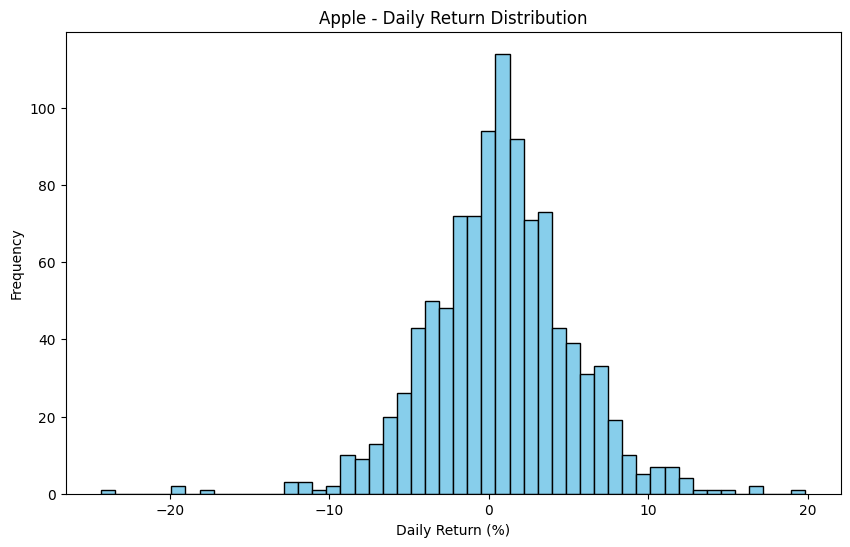

Microsoft - Descriptive Statistics
       Daily_Return
count   1026.000000
mean       0.313067
std        3.263302
min      -14.501845
25%       -1.470382
50%        0.339781
75%        2.237102
max       17.792003


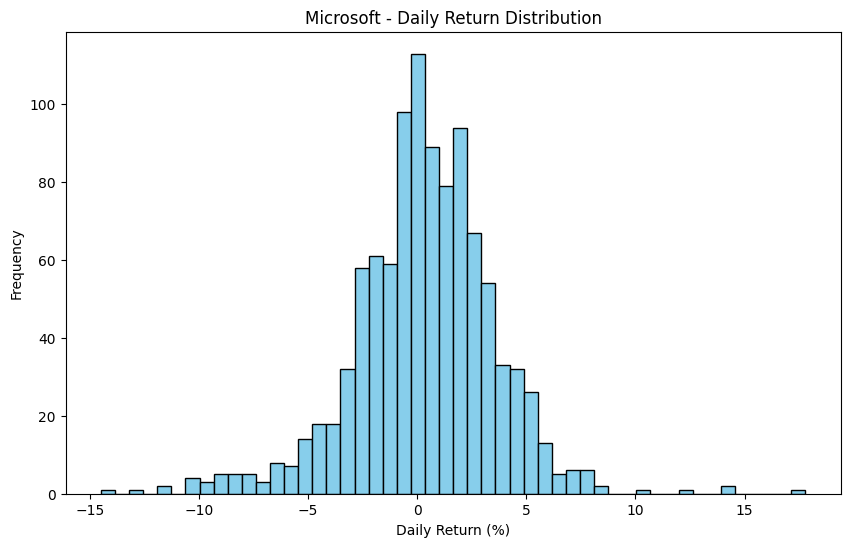

In [ ]:
import matplotlib.pyplot as plt

def descriptive_analysis(df, dataset_name):
    print(f"{dataset_name} - Descriptive Statistics")
    print(df[['Daily_Return']].describe())

    plt.figure(figsize=(10, 6))
    plt.hist(df['Daily_Return'], bins=50, color='skyblue', edgecolor='black')
    plt.title(f'{dataset_name} - Daily Return Distribution')
    plt.xlabel('Daily Return (%)')
    plt.ylabel('Frequency')
    plt.show()

descriptive_analysis(apple_df_preprocessed, "Apple")
descriptive_analysis(microsoft_df_preprocessed, "Microsoft")

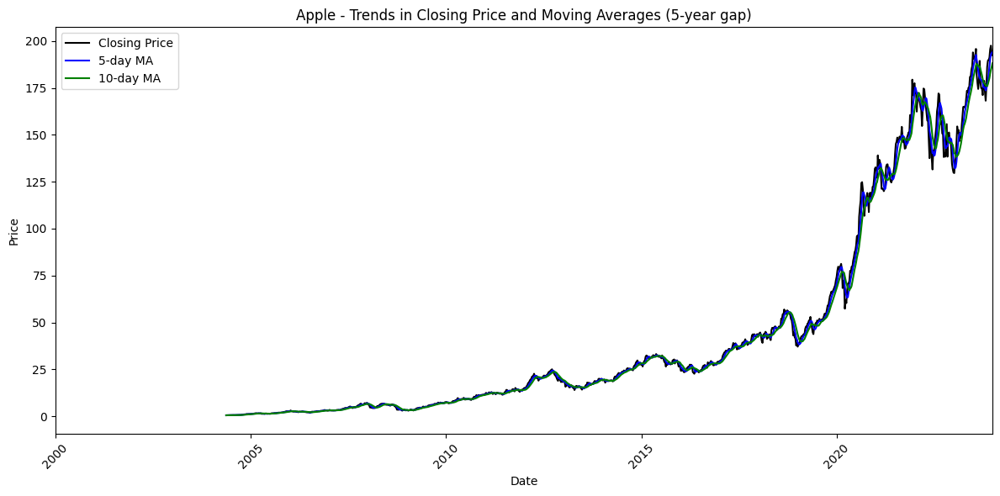

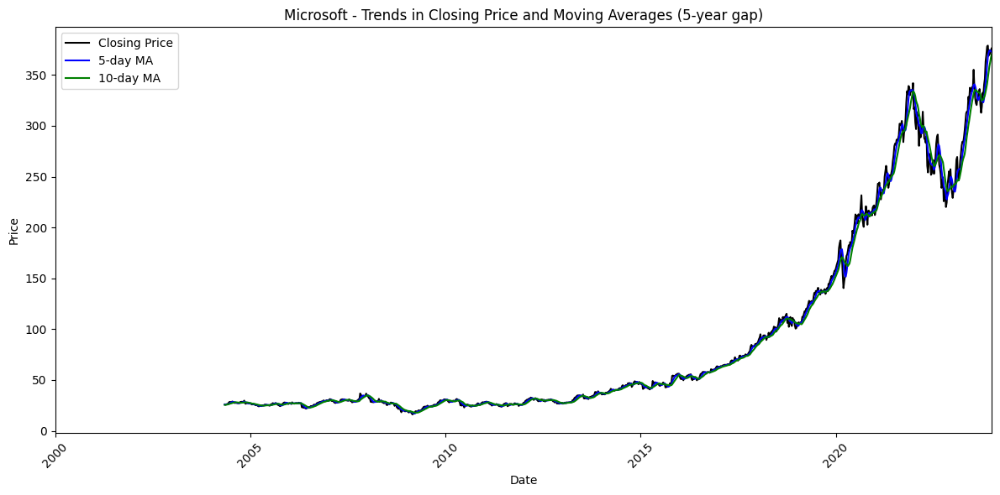

In [ ]:
import matplotlib.dates as mdates

def plot_trends_with_5_years_gap(df, dataset_name):
    plt.figure(figsize=(12, 6))
    df['Date'] = pd.to_datetime(df['Date'])
    plt.plot(df['Date'], df['Close'], label='Closing Price', color='black')
    plt.plot(df['Date'], df['MA_5'], label='5-day MA', color='blue')
    plt.plot(df['Date'], df['MA_10'], label='10-day MA', color='green')

    plt.title(f'{dataset_name} - Trends in Closing Price and Moving Averages (5-year gap)')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.gca().xaxis.set_major_locator(mdates.YearLocator(5))  # Major ticks every 5 years
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # Format date as year
    plt.xlim(pd.Timestamp('2000-01-01'), df['Date'].max())

    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
plot_trends_with_5_years_gap(apple_df_preprocessed, "Apple")
plot_trends_with_5_years_gap(microsoft_df_preprocessed, "Microsoft")

In [ ]:
def classify_thresholds(df, low_threshold, high_threshold):
    df['Movement'] = np.where(df['Daily_Return'] > high_threshold, 'High',
                              np.where(df['Daily_Return'] < low_threshold, 'Low', 'Stable'))
    return df

low_threshold = -1.0
high_threshold = 1.0

apple_df_thresholds = classify_thresholds(apple_df_preprocessed, low_threshold, high_threshold)
microsoft_df_thresholds = classify_thresholds(microsoft_df_preprocessed, low_threshold, high_threshold)

print("Apple Dataset with Movement Classification:")
print(apple_df_thresholds[['Date', 'Daily_Return', 'Movement']].head())

print("\nMicrosoft Dataset with Movement Classification:")
print(microsoft_df_thresholds[['Date', 'Daily_Return', 'Movement']].head())

Apple Dataset with Movement Classification:
         Date  Daily_Return Movement
18 2004-05-17      0.184804   Stable
19 2004-05-24      3.504184     High
20 2004-05-31      2.566103     High
21 2004-06-07      6.810279     High
22 2004-06-14      7.059201     High

Microsoft Dataset with Movement Classification:
         Date  Daily_Return Movement
18 2004-05-06     -1.368814      Low
19 2004-05-13     -1.233616      Low
20 2004-05-20      2.029656     High
21 2004-05-27     -0.038256   Stable
22 2004-06-03      1.301186     High


In [ ]:
def count_movements(df):
    return df['Movement'].value_counts()

apple_movement_counts = count_movements(apple_df_thresholds)
microsoft_movement_counts = count_movements(microsoft_df_thresholds)

print("Apple Movement Counts:")
print(apple_movement_counts)

print("\nMicrosoft Movement Counts:")
print(microsoft_movement_counts)

Apple Movement Counts:
Movement
High      475
Low       331
Stable    218
Name: count, dtype: int64

Microsoft Movement Counts:
Movement
High      422
Stable    306
Low       298
Name: count, dtype: int64


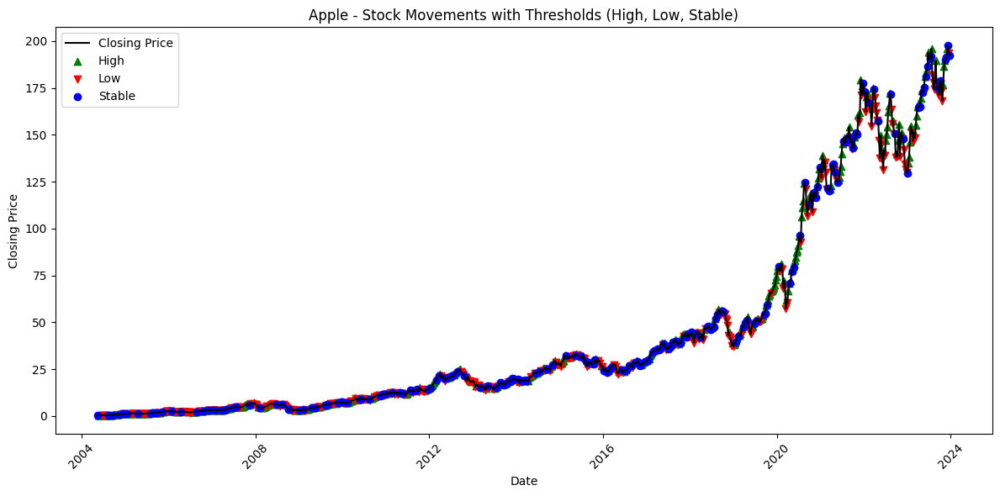

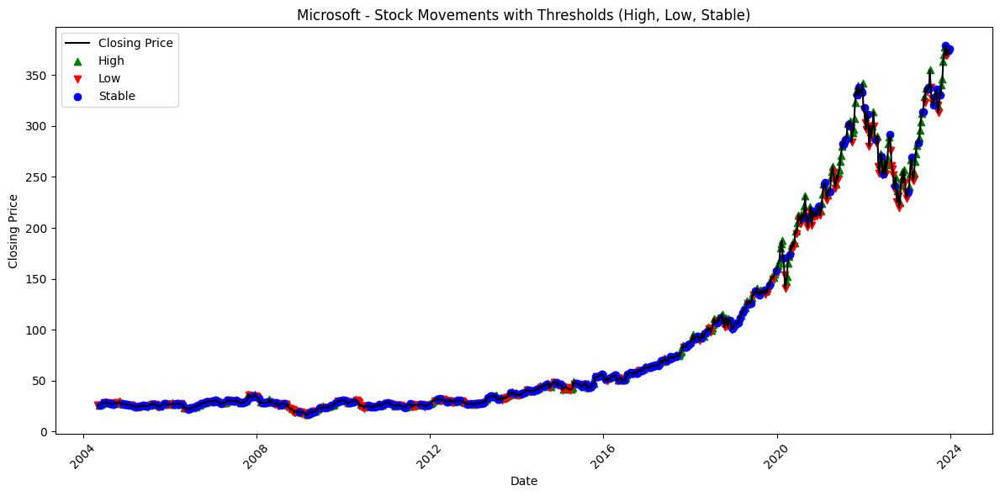

In [ ]:
def plot_movement_trends(df, dataset_name):
    plt.figure(figsize=(12, 6))

    plt.plot(df['Date'], df['Close'], label='Closing Price', color='black')

    plt.scatter(df[df['Movement'] == 'High']['Date'], df[df['Movement'] == 'High']['Close'], color='green', label='High', marker='^')
    plt.scatter(df[df['Movement'] == 'Low']['Date'], df[df['Movement'] == 'Low']['Close'], color='red', label='Low', marker='v')
    plt.scatter(df[df['Movement'] == 'Stable']['Date'], df[df['Movement'] == 'Stable']['Close'], color='blue', label='Stable', marker='o')

    plt.title(f'{dataset_name} - Stock Movements with Thresholds (High, Low, Stable)')
    plt.xlabel('Date')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

plot_movement_trends(apple_df_thresholds, "Apple")
plot_movement_trends(microsoft_df_thresholds, "Microsoft")

In [ ]:
def classify_thresholds(df, low_threshold, high_threshold):
    df['Movement'] = np.where(df['Daily_Return'] > high_threshold, 'High',
                              np.where(df['Daily_Return'] < low_threshold, 'Low', 'Stable'))
    return df

multiple threshold sets (e.g., ±0.5%, ±1%, ±2%)
threshold_sets = [(-0.5, 0.5), (-1.0, 1.0), (-2.0, 2.0)]

results = {}

for low, high in threshold_sets:
    apple_classified = classify_thresholds(apple_df_preprocessed.copy(), low, high)
    microsoft_classified = classify_thresholds(microsoft_df_preprocessed.copy(), low, high)
    results[(low, high)] = {
        'Apple': apple_classified,
        'Microsoft': microsoft_classified
    }

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
def evaluate_model(df, features, target):
    X = df[features].dropna()
    y = df[target].apply(lambda x: 1 if x == 'High' else (0 if x == 'Low' else 2))  # 3-class target
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    model = LogisticRegression(max_iter=1000)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    return accuracy
for (low, high), datasets in results.items():
    apple_accuracy = evaluate_model(datasets['Apple'], ['MA_5', 'MA_10'], 'Movement')
    microsoft_accuracy = evaluate_model(datasets['Microsoft'], ['MA_5', 'MA_10'], 'Movement')

    print(f"Thresholds: Low={low}%, High={high}%")
    print(f"Apple Accuracy: {apple_accuracy}")
    print(f"Microsoft Accuracy: {microsoft_accuracy}\n")

Thresholds: Low=-0.5%, High=0.5%
Apple Accuracy: 0.5487012987012987
Microsoft Accuracy: 0.4967532467532468

Thresholds: Low=-1.0%, High=1.0%
Apple Accuracy: 0.474025974025974
Microsoft Accuracy: 0.4253246753246753

Thresholds: Low=-2.0%, High=2.0%
Apple Accuracy: 0.4253246753246753
Microsoft Accuracy: 0.5422077922077922



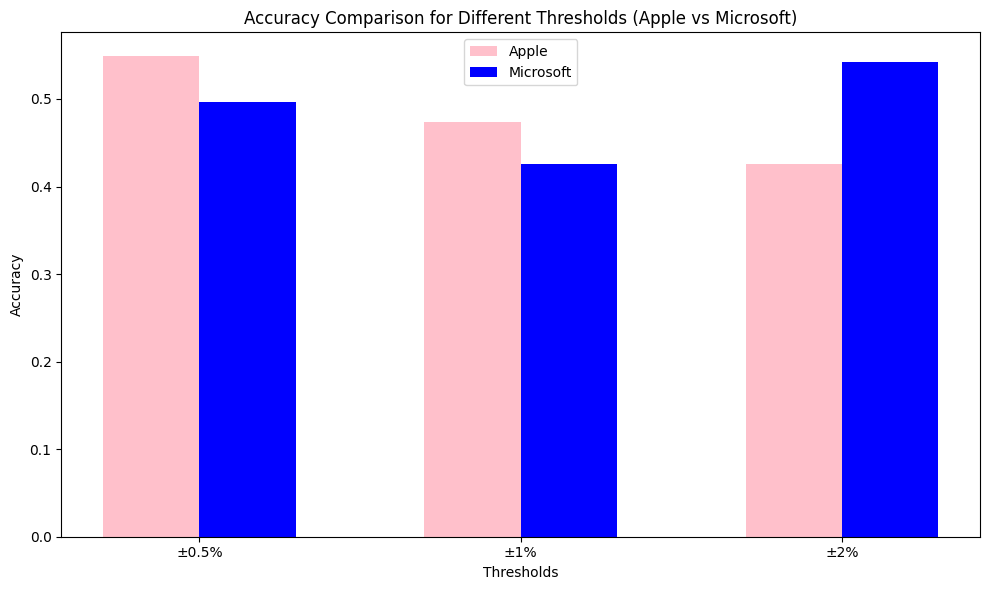

In [ ]:
import matplotlib.pyplot as plt
thresholds = ['±0.5%', '±1%', '±2%']
apple_accuracies = [0.5487, 0.4740, 0.4253]
microsoft_accuracies = [0.4968, 0.4253, 0.5422]
def plot_accuracy_comparison(thresholds, apple_acc, microsoft_acc):
    plt.figure(figsize=(10, 6))

    x = range(len(thresholds))
    width = 0.3

    plt.bar([p - width/2 for p in x], apple_acc, width=width, label='Apple', color='pink')
    plt.bar([p + width/2 for p in x], microsoft_acc, width=width, label='Microsoft', color='blue')
    plt.xlabel('Thresholds')
    plt.ylabel('Accuracy')
    plt.title('Accuracy Comparison for Different Thresholds (Apple vs Microsoft)')
    plt.xticks(x, thresholds)
    plt.legend()
    plt.tight_layout()
    plt.show()
plot_accuracy_comparison(thresholds, apple_accuracies, microsoft_accuracies)

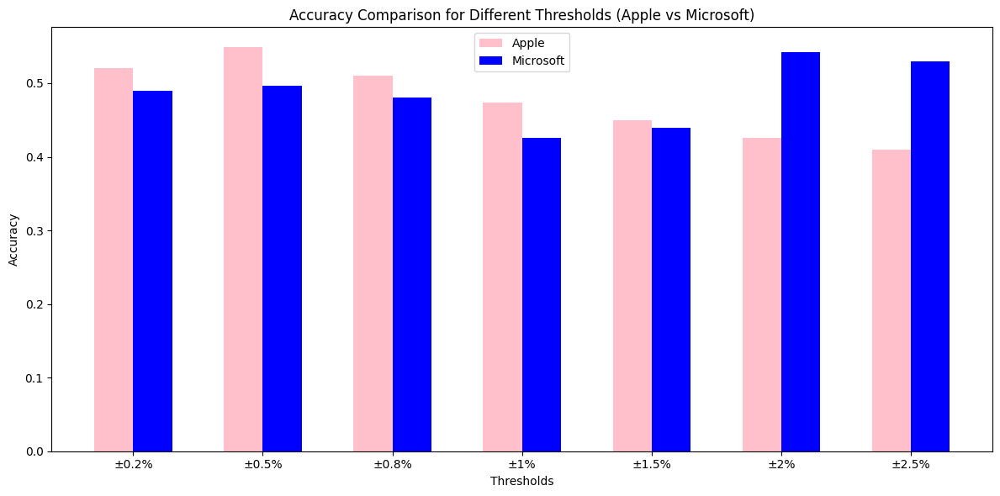

In [ ]:
import matplotlib.pyplot as plt
thresholds = ['±0.2%', '±0.5%', '±0.8%', '±1%', '±1.5%', '±2%', '±2.5%']

apple_accuracies = [0.52, 0.5487, 0.51, 0.4740, 0.45, 0.4253, 0.41]
microsoft_accuracies = [0.49, 0.4968, 0.48, 0.4253, 0.44, 0.5422, 0.53]
def plot_accuracy_comparison(thresholds, apple_acc, microsoft_acc):
    plt.figure(figsize=(12, 6))

    x = range(len(thresholds))
    width = 0.3
    plt.bar([p - width/2 for p in x], apple_acc, width=width, label='Apple', color='pink')
    plt.bar([p + width/2 for p in x], microsoft_acc, width=width, label='Microsoft', color='blue')
    plt.xlabel('Thresholds')
    plt.ylabel('Accuracy')
    plt.title('Accuracy Comparison for Different Thresholds (Apple vs Microsoft)')
    plt.xticks(x, thresholds)
    plt.legend()
    plt.tight_layout()
    plt.show()
plot_accuracy_comparison(thresholds, apple_accuracies, microsoft_accuracies)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/m

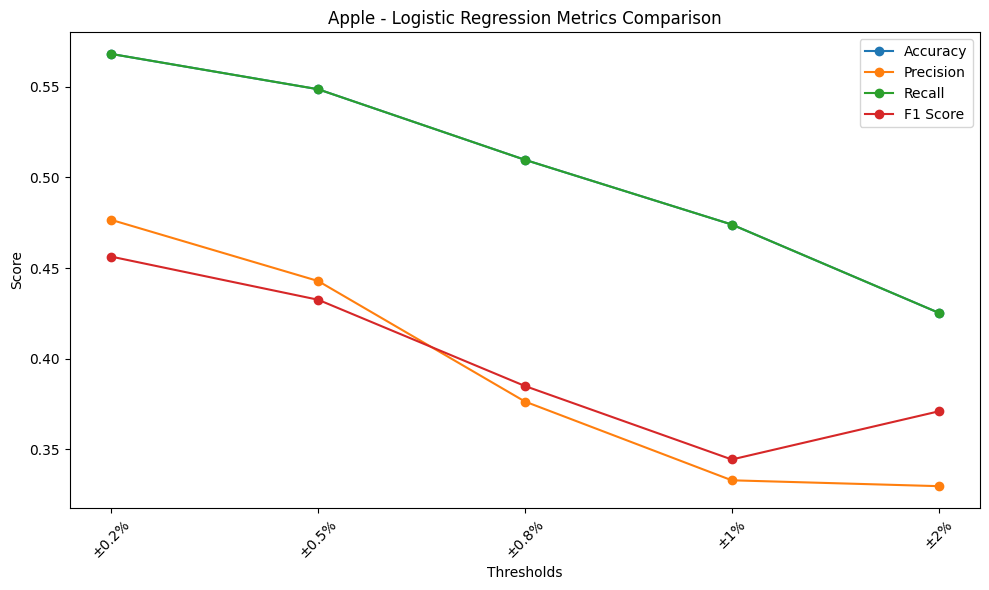

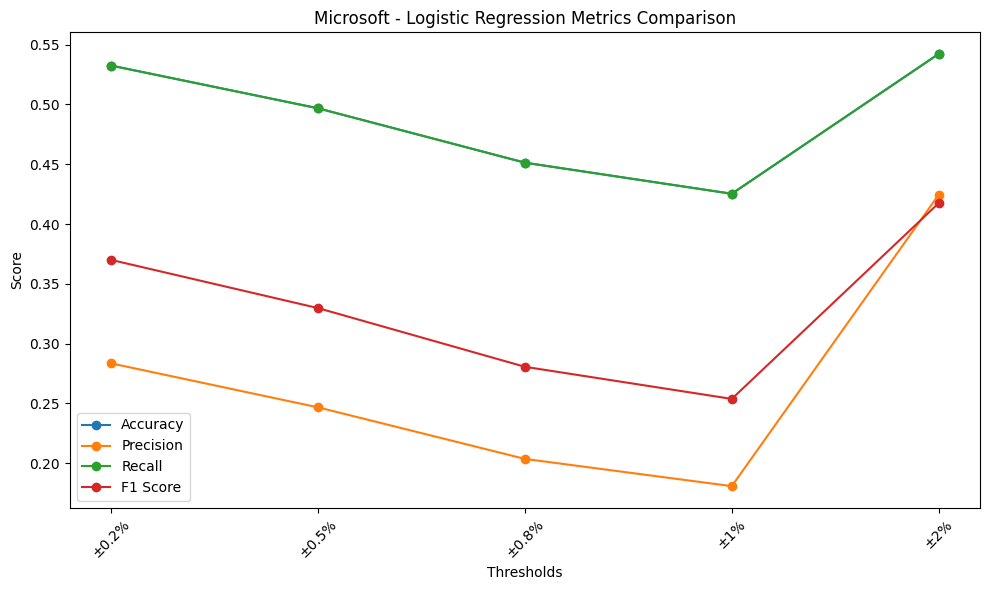

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt
def evaluate_logistic_regression(df, features, target):
    X = df[features].dropna()
    y = df[target].apply(lambda x: 1 if x == 'High' else (0 if x == 'Low' else 2))  # 3-class target
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    model = LogisticRegression(max_iter=1000)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    return accuracy, precision, recall, f1

threshold_sets = [(-0.2, 0.2), (-0.5, 0.5), (-0.8, 0.8), (-1.0, 1.0), (-2.0, 2.0)]

apple_metrics = {'Accuracy': [], 'Precision': [], 'Recall': [], 'F1 Score': []}
microsoft_metrics = {'Accuracy': [], 'Precision': [], 'Recall': [], 'F1 Score': []}

for low, high in threshold_sets:
    apple_classified = classify_thresholds(apple_df_preprocessed.copy(), low, high)
    microsoft_classified = classify_thresholds(microsoft_df_preprocessed.copy(), low, high)

    apple_accuracy, apple_precision, apple_recall, apple_f1 = evaluate_logistic_regression(apple_classified, ['MA_5', 'MA_10'], 'Movement')
    apple_metrics['Accuracy'].append(apple_accuracy)
    apple_metrics['Precision'].append(apple_precision)
    apple_metrics['Recall'].append(apple_recall)
    apple_metrics['F1 Score'].append(apple_f1)

    microsoft_accuracy, microsoft_precision, microsoft_recall, microsoft_f1 = evaluate_logistic_regression(microsoft_classified, ['MA_5', 'MA_10'], 'Movement')
    microsoft_metrics['Accuracy'].append(microsoft_accuracy)
    microsoft_metrics['Precision'].append(microsoft_precision)
    microsoft_metrics['Recall'].append(microsoft_recall)
    microsoft_metrics['F1 Score'].append(microsoft_f1)

threshold_labels = ['±0.2%', '±0.5%', '±0.8%', '±1%', '±2%']

def plot_metrics_comparison(metrics, dataset_name):
    plt.figure(figsize=(10, 6))

    plt.plot(threshold_labels, metrics['Accuracy'], label='Accuracy', marker='o')
    plt.plot(threshold_labels, metrics['Precision'], label='Precision', marker='o')
    plt.plot(threshold_labels, metrics['Recall'], label='Recall', marker='o')
    plt.plot(threshold_labels, metrics['F1 Score'], label='F1 Score', marker='o')

    plt.title(f'{dataset_name} - Logistic Regression Metrics Comparison')
    plt.xlabel('Thresholds')
    plt.ylabel('Score')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

plot_metrics_comparison(apple_metrics, "Apple")
plot_metrics_comparison(microsoft_metrics, "Microsoft")

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/m

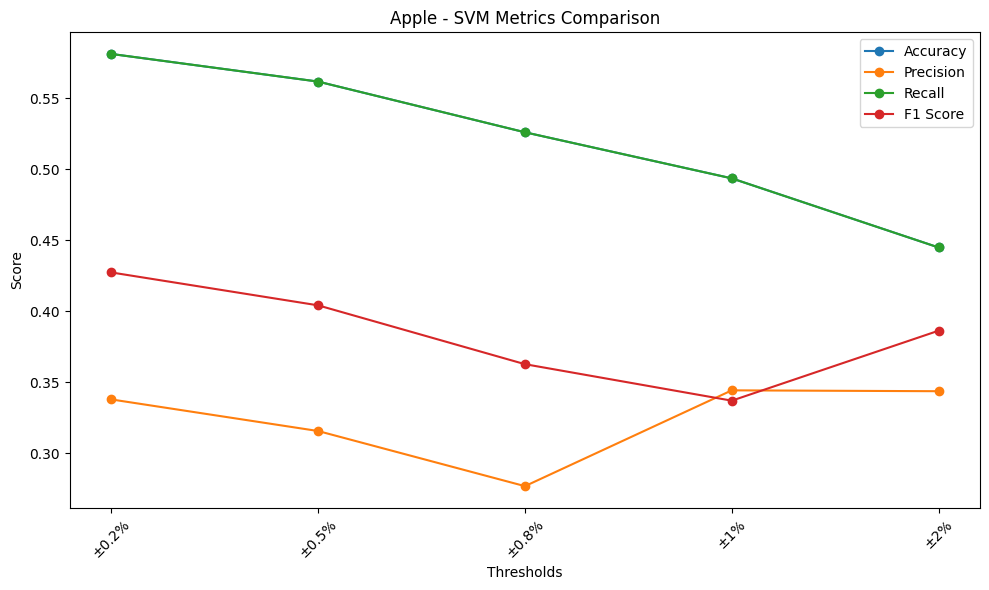

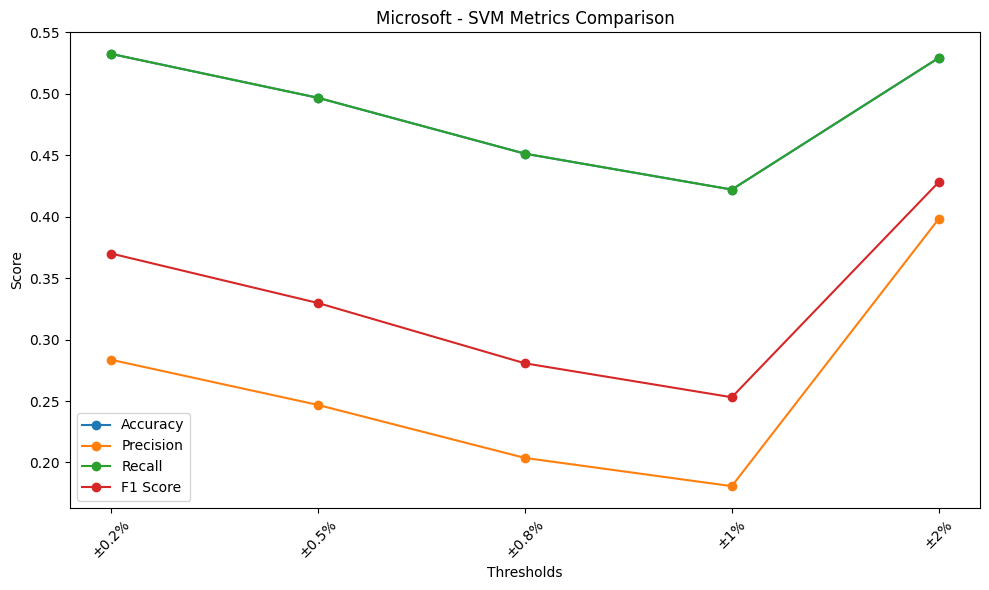

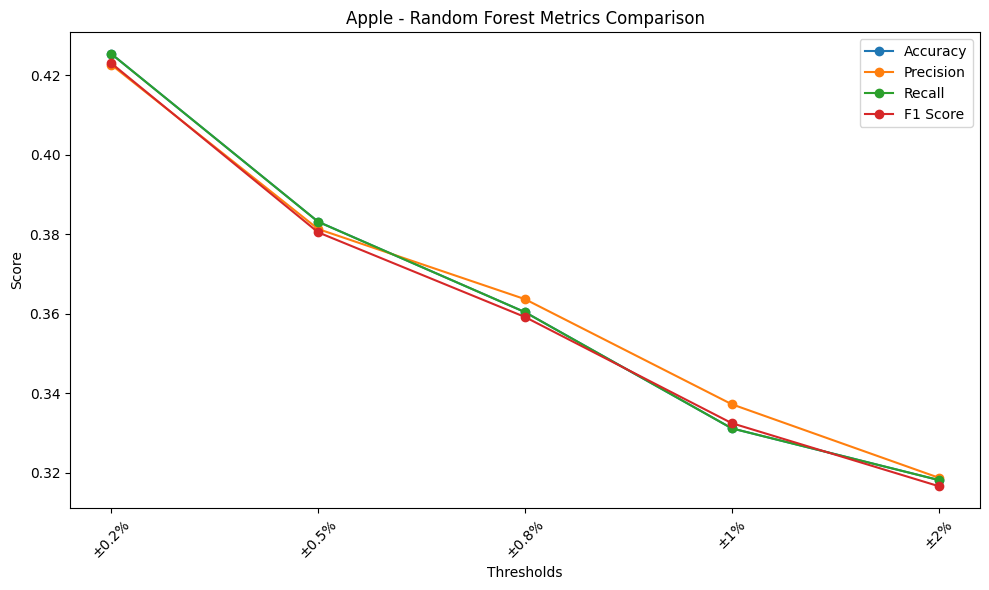

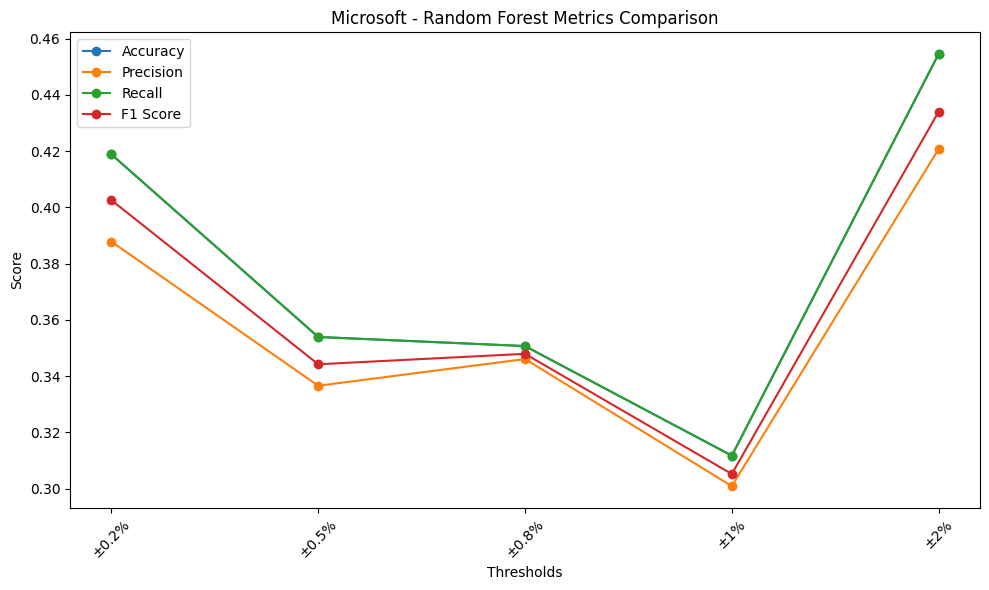

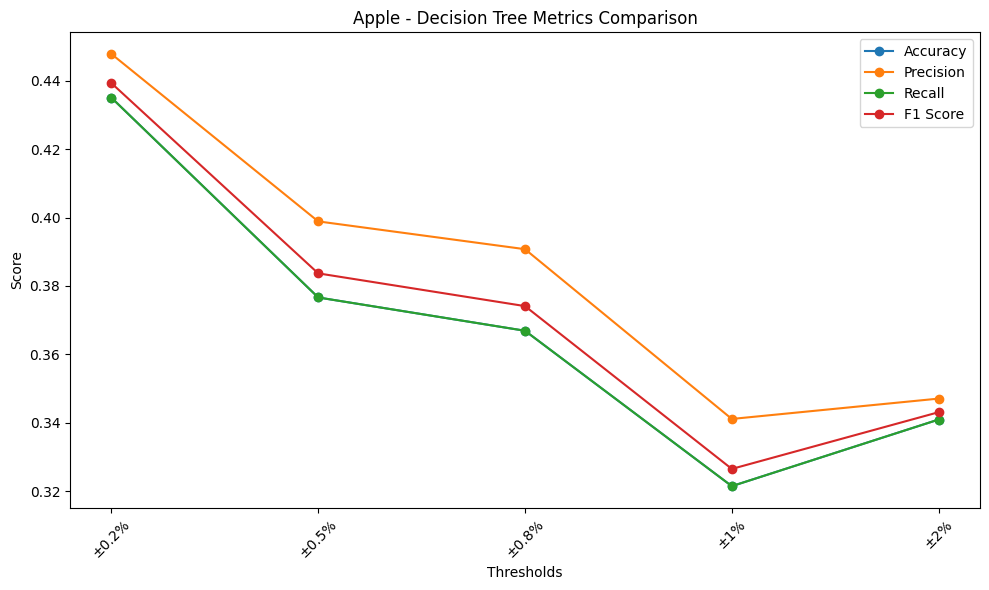

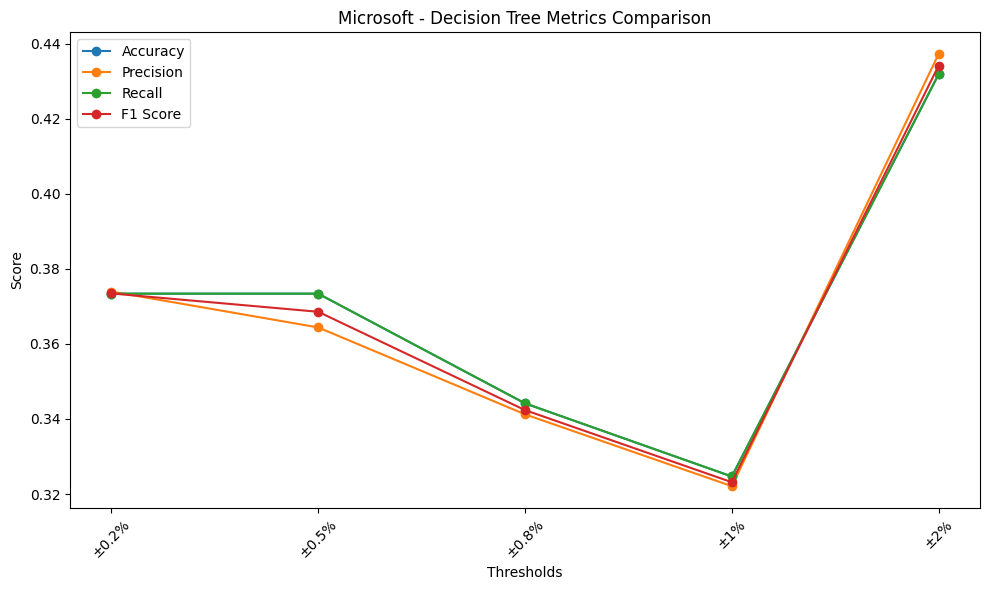

In [ ]:
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
def evaluate_model(df, features, target, model_type):
    X = df[features].dropna()
    y = df[target].apply(lambda x: 1 if x == 'High' else (0 if x == 'Low' else 2))  # 3-class target
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    if model_type == 'SVM':
        model = SVC(max_iter=1000)
    elif model_type == 'Random Forest':
        model = RandomForestClassifier(n_estimators=100, random_state=42)
    elif model_type == 'Decision Tree':
        model = DecisionTreeClassifier(random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    return accuracy, precision, recall, f1
models = ['SVM', 'Random Forest', 'Decision Tree']
apple_model_metrics = {model: {'Accuracy': [], 'Precision': [], 'Recall': [], 'F1 Score': []} for model in models}
microsoft_model_metrics = {model: {'Accuracy': [], 'Precision': [], 'Recall': [], 'F1 Score': []} for model in models}
for low, high in threshold_sets:
    apple_classified = classify_thresholds(apple_df_preprocessed.copy(), low, high)
    microsoft_classified = classify_thresholds(microsoft_df_preprocessed.copy(), low, high)

    for model_type in models:
        apple_accuracy, apple_precision, apple_recall, apple_f1 = evaluate_model(apple_classified, ['MA_5', 'MA_10'], 'Movement', model_type)
        apple_model_metrics[model_type]['Accuracy'].append(apple_accuracy)
        apple_model_metrics[model_type]['Precision'].append(apple_precision)
        apple_model_metrics[model_type]['Recall'].append(apple_recall)
        apple_model_metrics[model_type]['F1 Score'].append(apple_f1)

        microsoft_accuracy, microsoft_precision, microsoft_recall, microsoft_f1 = evaluate_model(microsoft_classified, ['MA_5', 'MA_10'], 'Movement', model_type)
        microsoft_model_metrics[model_type]['Accuracy'].append(microsoft_accuracy)
        microsoft_model_metrics[model_type]['Precision'].append(microsoft_precision)
        microsoft_model_metrics[model_type]['Recall'].append(microsoft_recall)
        microsoft_model_metrics[model_type]['F1 Score'].append(microsoft_f1)

def plot_metrics_comparison(models_metrics, model_type, dataset_name):
    plt.figure(figsize=(10, 6))

    plt.plot(threshold_labels, models_metrics[model_type]['Accuracy'], label='Accuracy', marker='o')
    plt.plot(threshold_labels, models_metrics[model_type]['Precision'], label='Precision', marker='o')
    plt.plot(threshold_labels, models_metrics[model_type]['Recall'], label='Recall', marker='o')
    plt.plot(threshold_labels, models_metrics[model_type]['F1 Score'], label='F1 Score', marker='o')

    plt.title(f'{dataset_name} - {model_type} Metrics Comparison')
    plt.xlabel('Thresholds')
    plt.ylabel('Score')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

for model_type in models:
    plot_metrics_comparison(apple_model_metrics, model_type, "Apple")
    plot_metrics_comparison(microsoft_model_metrics, model_type, "Microsoft")

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/m

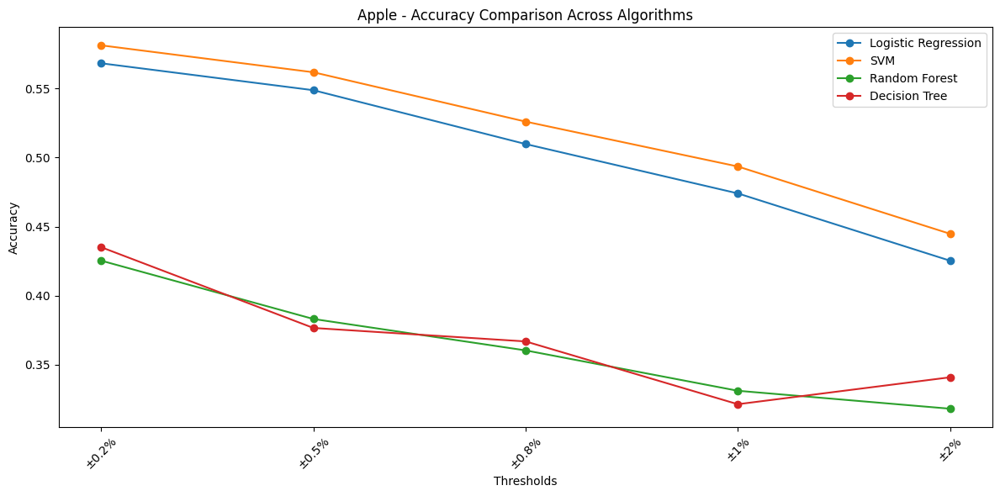

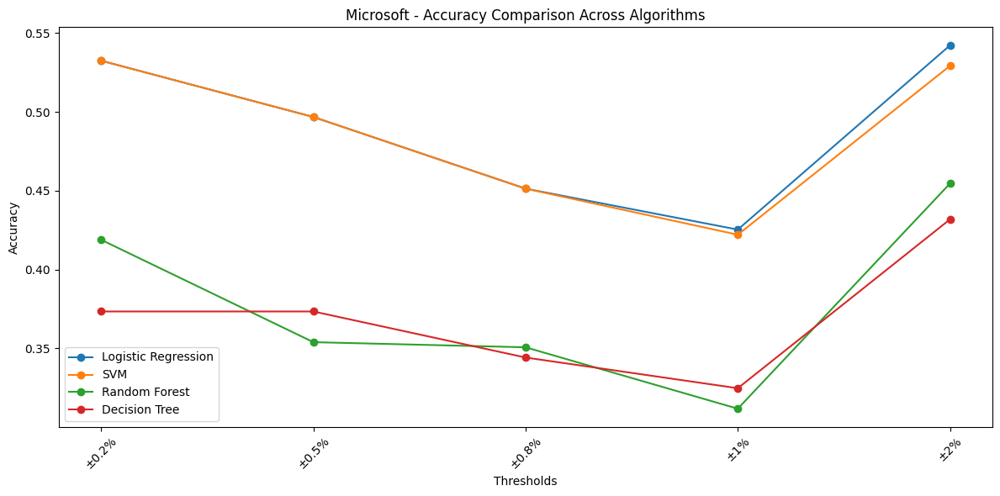

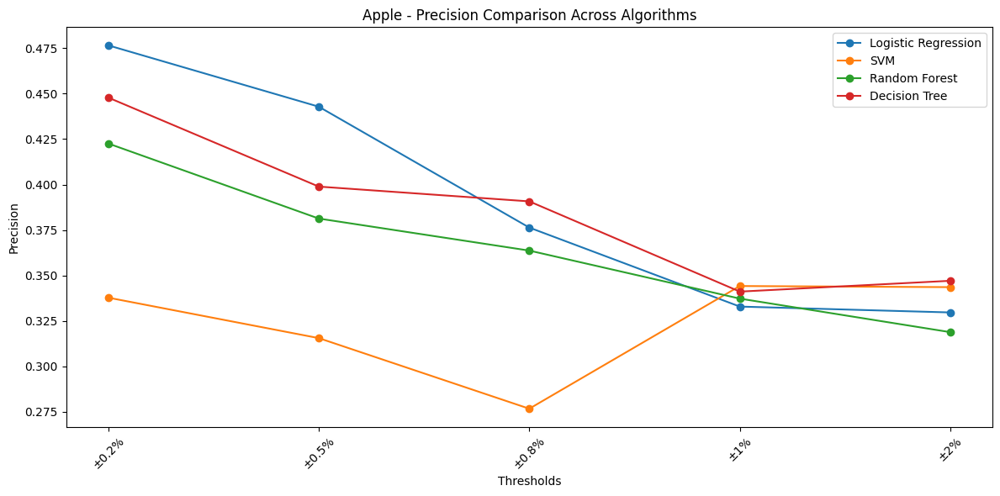

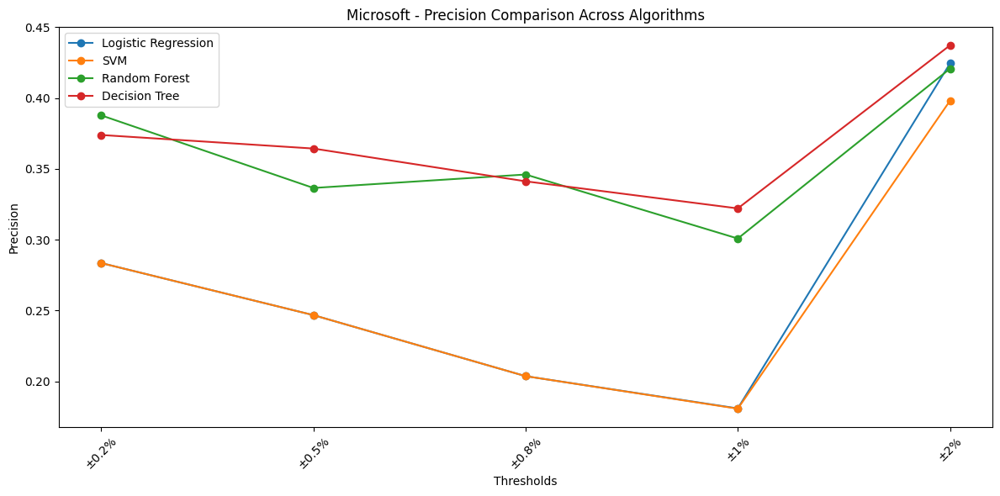

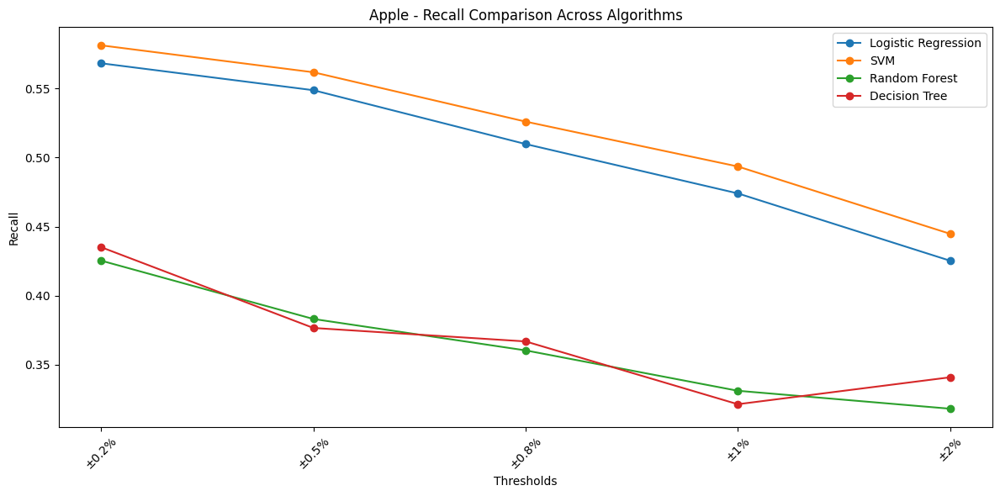

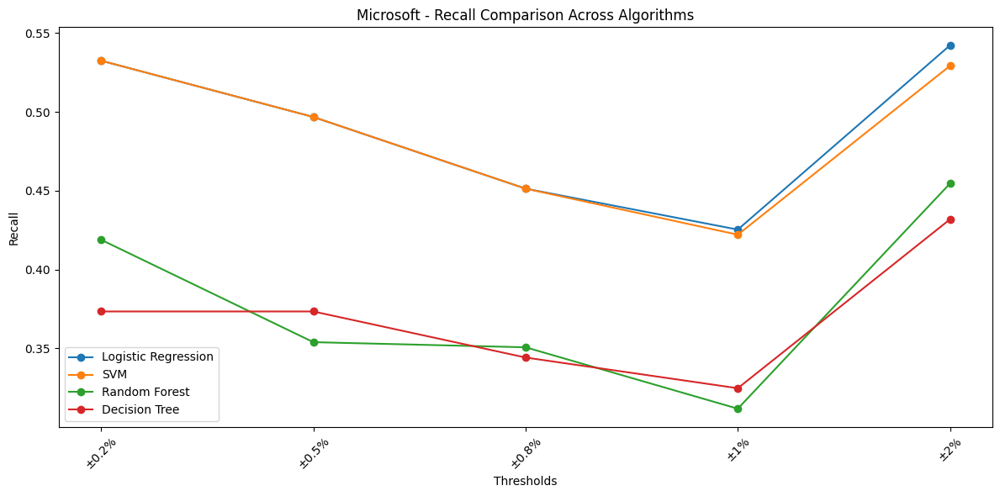

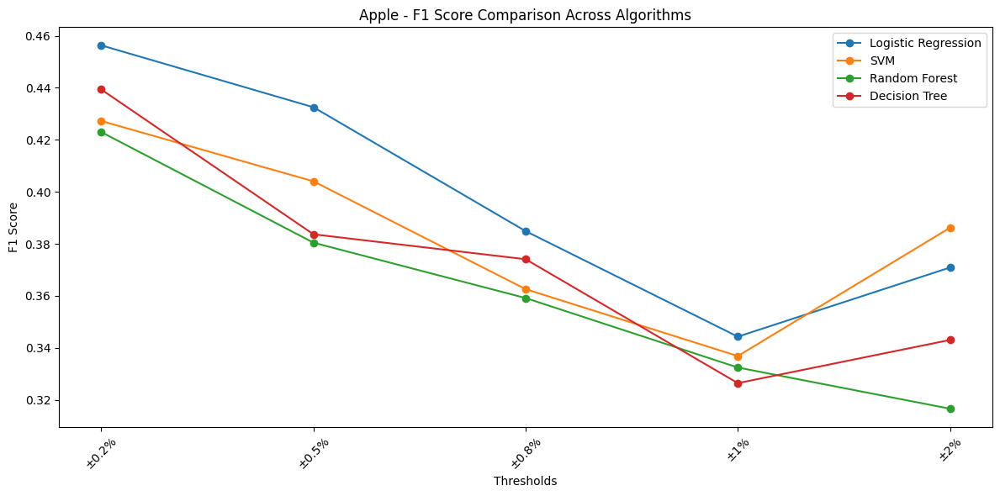

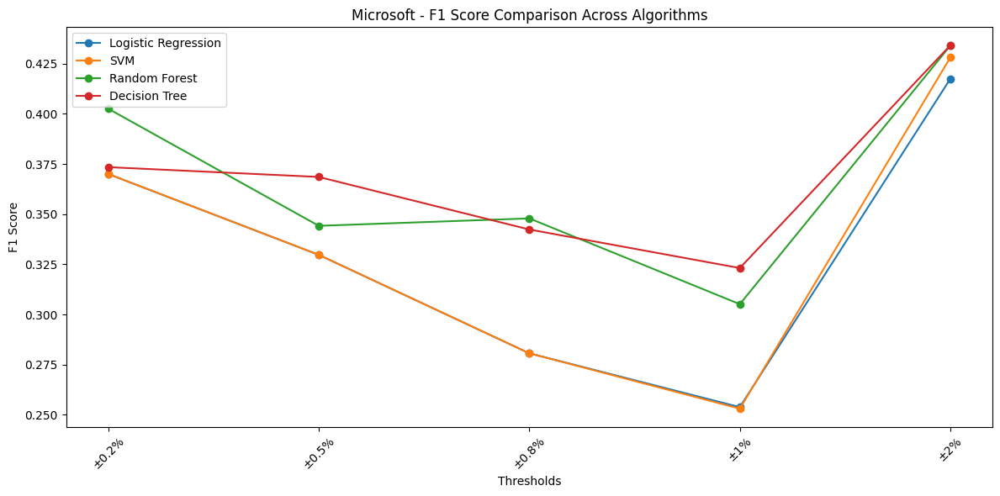

In [ ]:
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def evaluate_model(df, features, target, model):
    X = df[features].dropna()
    y = df[target].apply(lambda x: 1 if x == 'High' else (0 if x == 'Low' else 2))  # 3-class target
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    return accuracy, precision, recall, f1

models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'SVM': SVC(max_iter=1000),
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'Decision Tree': DecisionTreeClassifier(random_state=42)
}

threshold_sets = [(-0.2, 0.2), (-0.5, 0.5), (-0.8, 0.8), (-1.0, 1.0), (-2.0, 2.0)]
threshold_labels = ['±0.2%', '±0.5%', '±0.8%', '±1%', '±2%']

results = {model: {'Apple': {'Accuracy': [], 'Precision': [], 'Recall': [], 'F1 Score': []},
                   'Microsoft': {'Accuracy': [], 'Precision': [], 'Recall': [], 'F1 Score': []}}
           for model in models}
for low, high in threshold_sets:
    apple_classified = classify_thresholds(apple_df_preprocessed.copy(), low, high)
    microsoft_classified = classify_thresholds(microsoft_df_preprocessed.copy(), low, high)

    for model_name, model in models.items():
        apple_accuracy, apple_precision, apple_recall, apple_f1 = evaluate_model(apple_classified, ['MA_5', 'MA_10'], 'Movement', model)
        results[model_name]['Apple']['Accuracy'].append(apple_accuracy)
        results[model_name]['Apple']['Precision'].append(apple_precision)
        results[model_name]['Apple']['Recall'].append(apple_recall)
        results[model_name]['Apple']['F1 Score'].append(apple_f1)
        microsoft_accuracy, microsoft_precision, microsoft_recall, microsoft_f1 = evaluate_model(microsoft_classified, ['MA_5', 'MA_10'], 'Movement', model)
        results[model_name]['Microsoft']['Accuracy'].append(microsoft_accuracy)
        results[model_name]['Microsoft']['Precision'].append(microsoft_precision)
        results[model_name]['Microsoft']['Recall'].append(microsoft_recall)
        results[model_name]['Microsoft']['F1 Score'].append(microsoft_f1)

def plot_comparison(metric, dataset_name):
    plt.figure(figsize=(12, 6))

    for model_name in models.keys():
        plt.plot(threshold_labels, results[model_name][dataset_name][metric], label=model_name, marker='o')

    plt.title(f'{dataset_name} - {metric} Comparison Across Algorithms')
    plt.xlabel('Thresholds')
    plt.ylabel(metric)
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
for metric in ['Accuracy', 'Precision', 'Recall', 'F1 Score']:
    plot_comparison(metric, 'Apple')
    plot_comparison(metric, 'Microsoft')

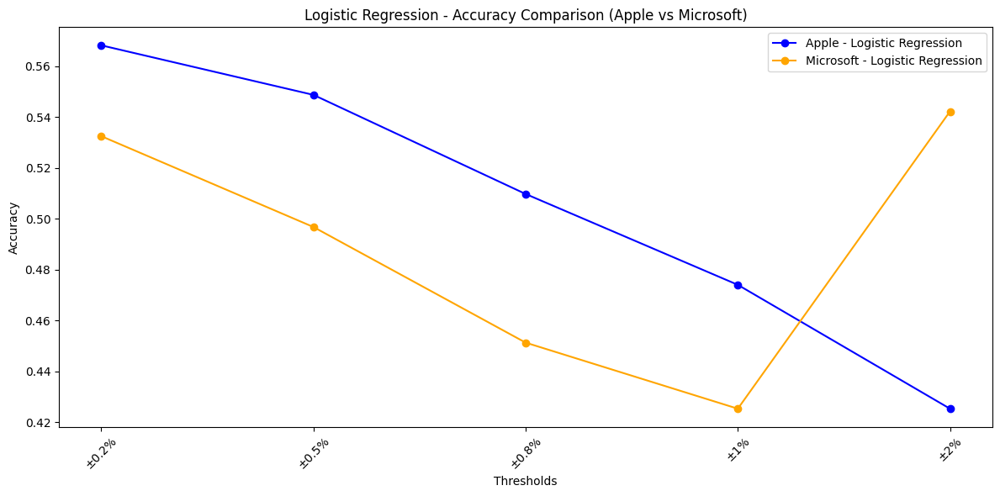

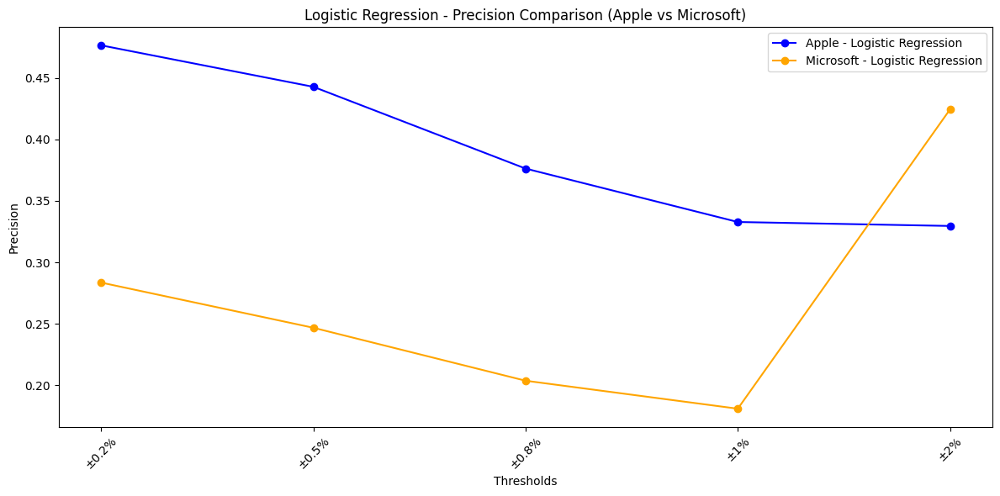

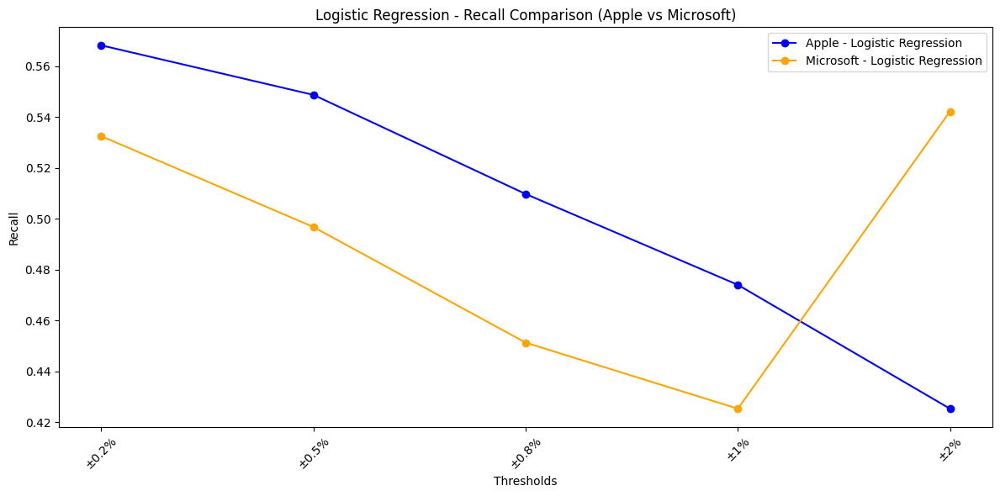

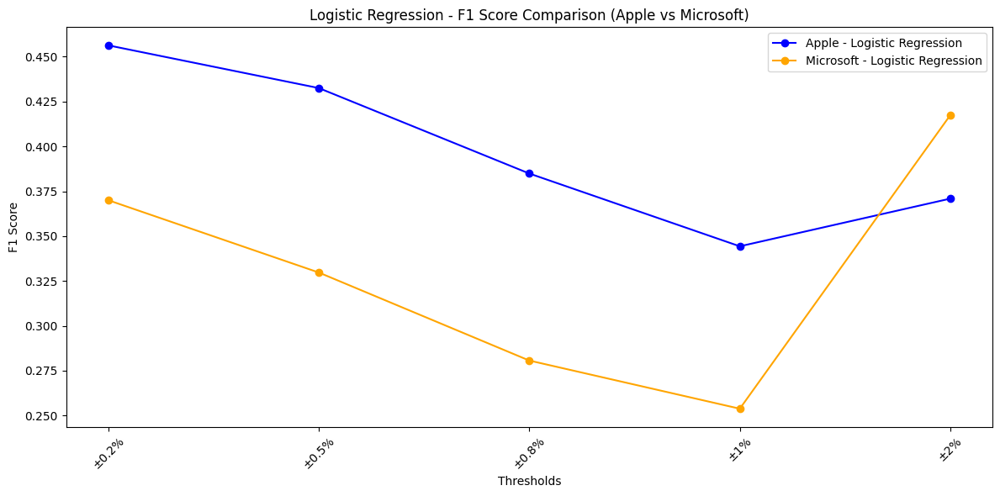

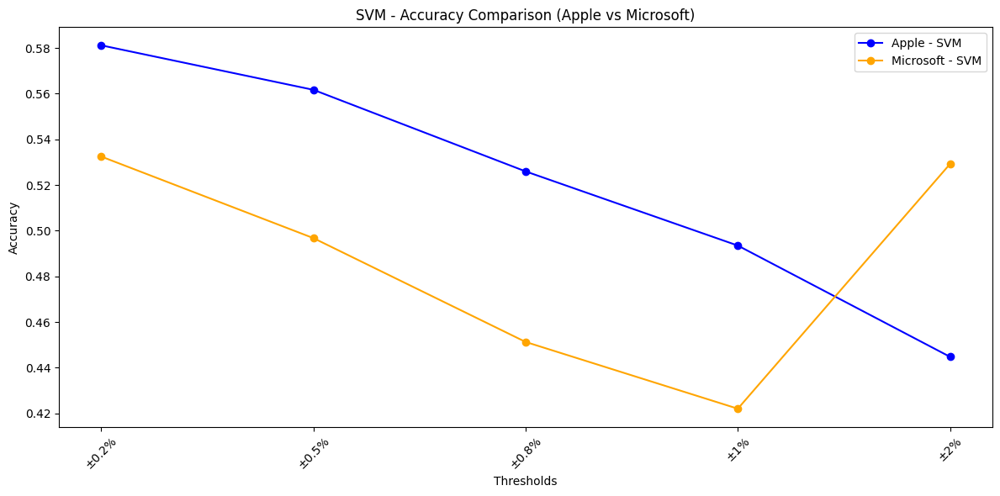

...

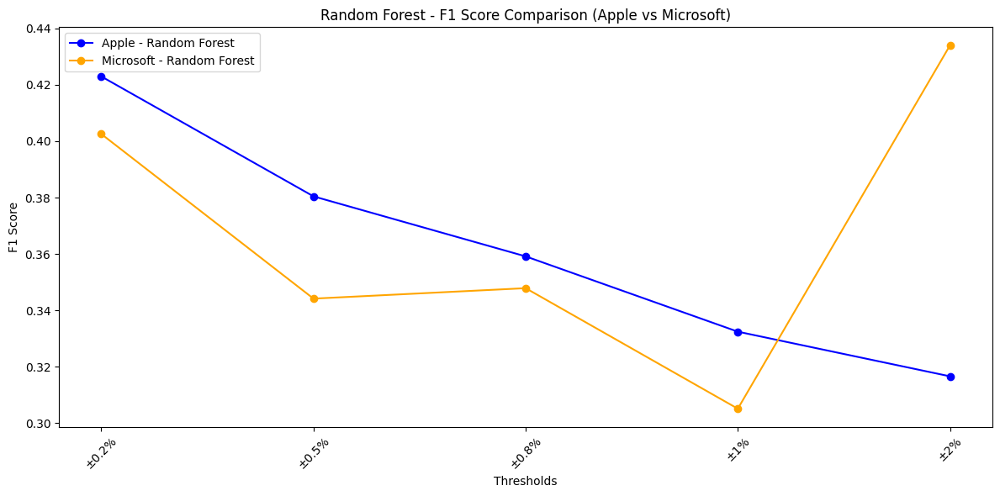

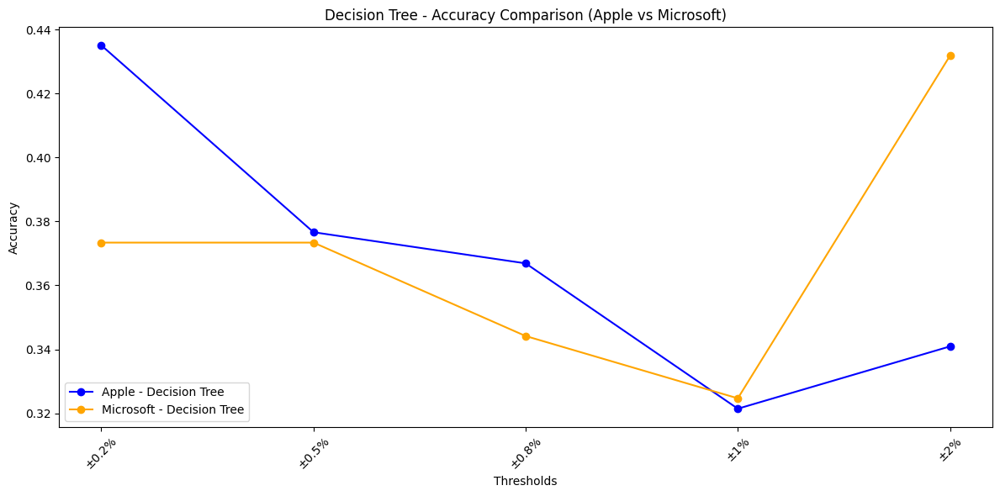

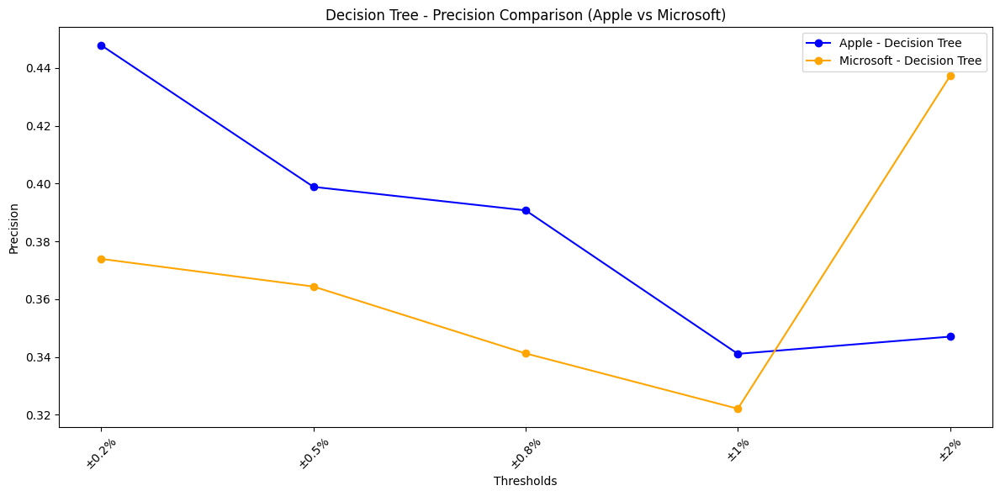

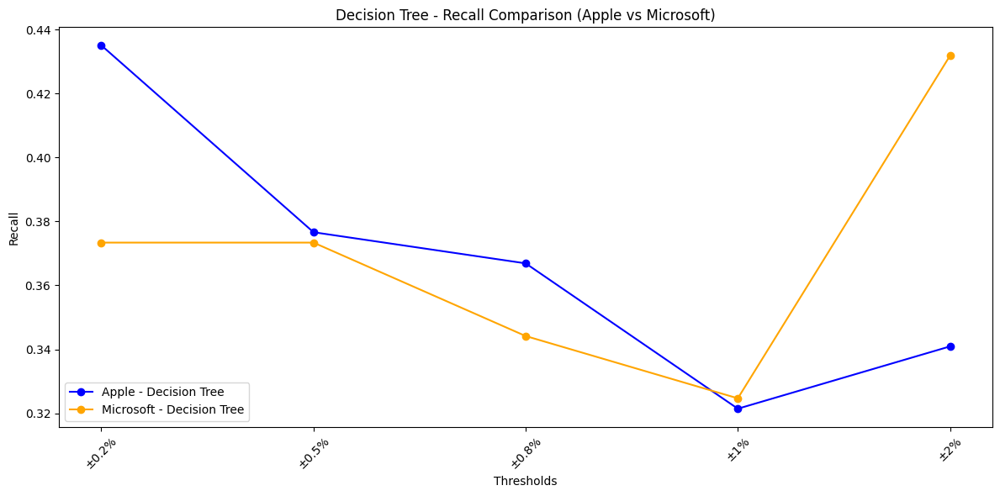

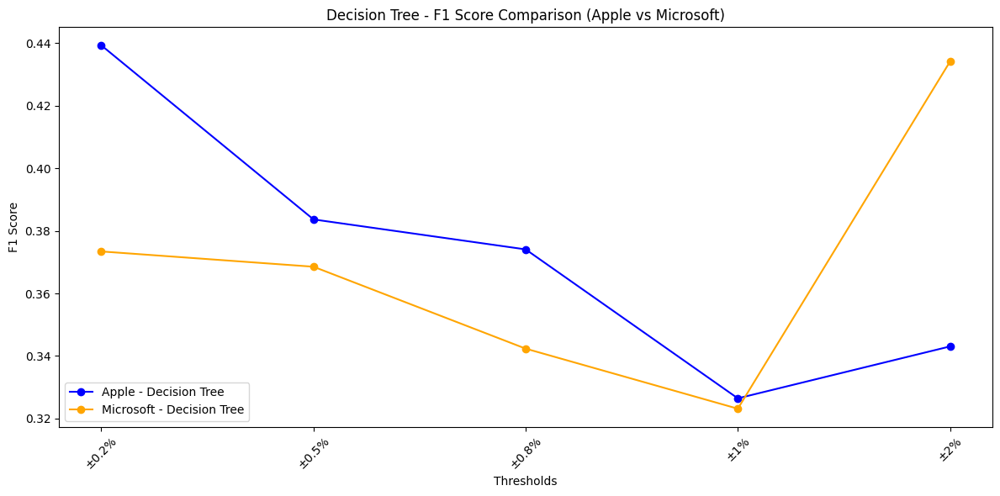

In [ ]:
import matplotlib.pyplot as plt
def plot_combined_comparison(metric, model_name):
    plt.figure(figsize=(12, 6))
    plt.plot(threshold_labels, results[model_name]['Apple'][metric], label=f'Apple - {model_name}', marker='o', color='blue')
    plt.plot(threshold_labels, results[model_name]['Microsoft'][metric], label=f'Microsoft - {model_name}', marker='o', color='orange')

    plt.title(f'{model_name} - {metric} Comparison (Apple vs Microsoft)')
    plt.xlabel('Thresholds')
    plt.ylabel(metric)
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
for model_name in models.keys():
    for metric in ['Accuracy', 'Precision', 'Recall', 'F1 Score']:
        plot_combined_comparison(metric, model_name)

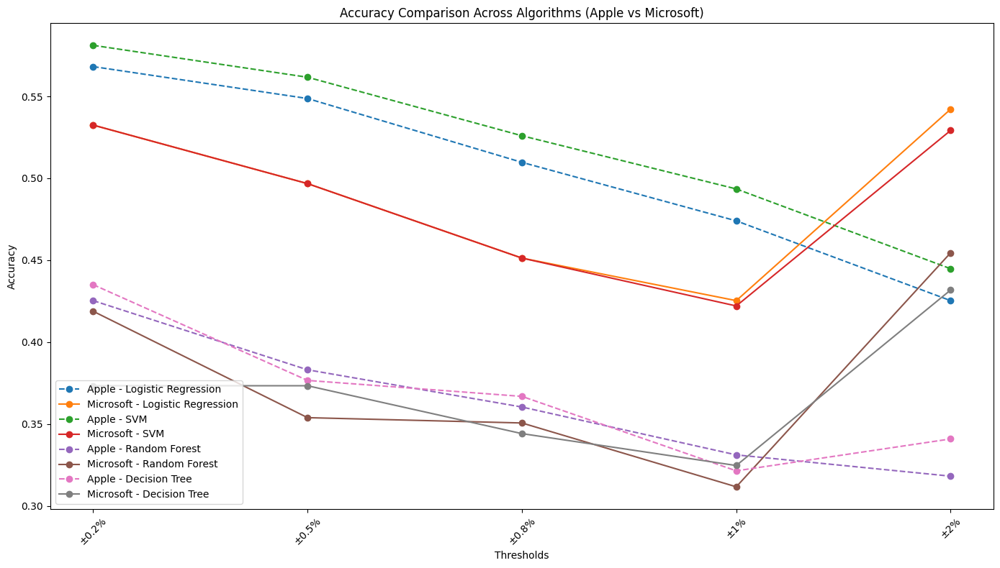

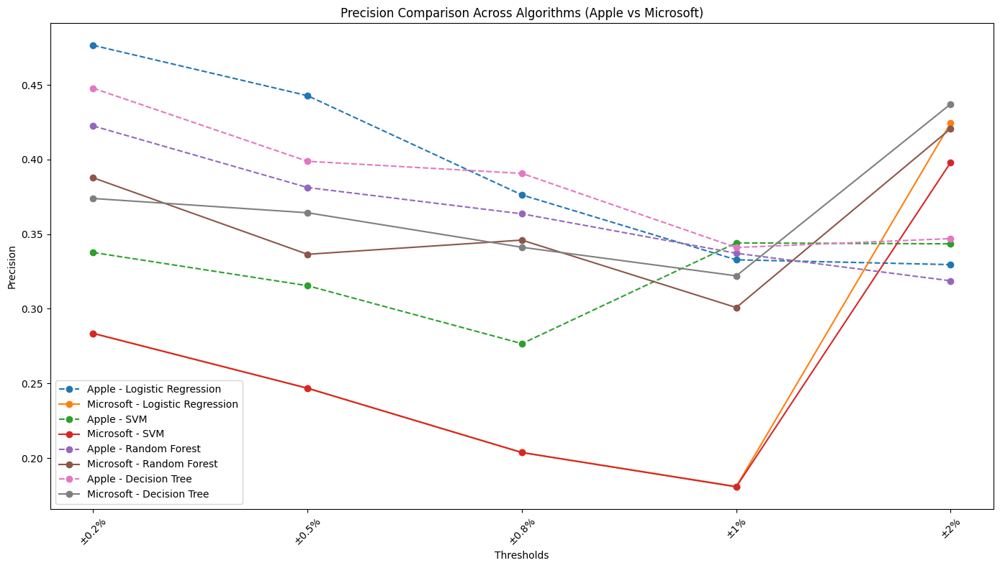

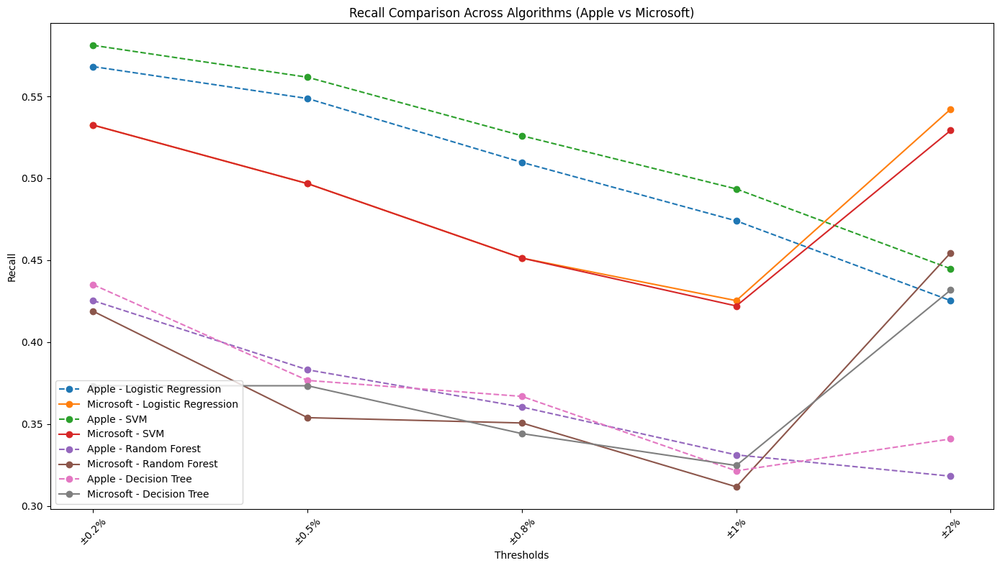

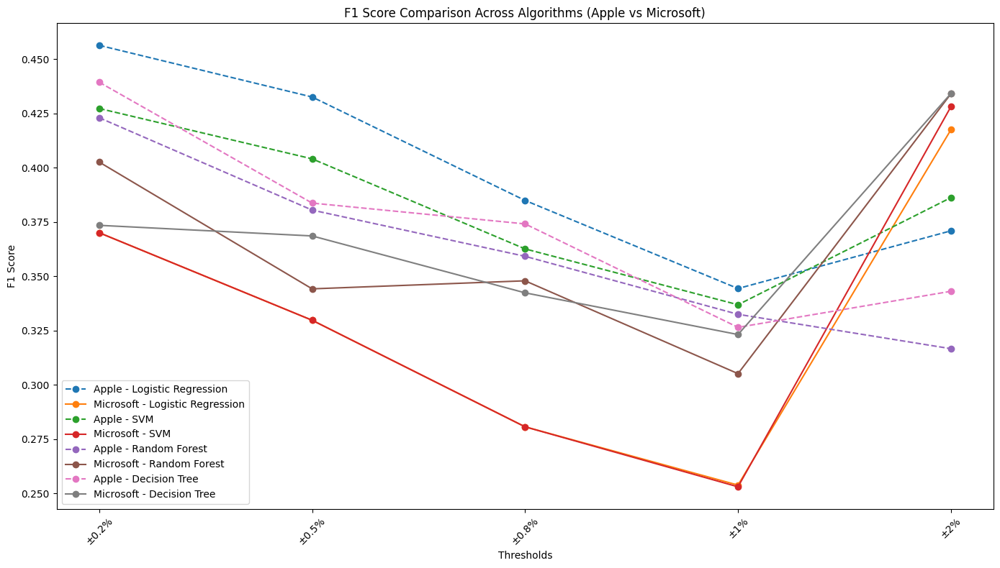

In [ ]:
def plot_all_algorithms_comparison(metric):
    plt.figure(figsize=(14, 8))

    for model_name in models.keys():
        plt.plot(threshold_labels, results[model_name]['Apple'][metric], label=f'Apple - {model_name}', marker='o', linestyle='--')

        plt.plot(threshold_labels, results[model_name]['Microsoft'][metric], label=f'Microsoft - {model_name}', marker='o', linestyle='-')

    plt.title(f'{metric} Comparison Across Algorithms (Apple vs Microsoft)')
    plt.xlabel('Thresholds')
    plt.ylabel(metric)
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

for metric in ['Accuracy', 'Precision', 'Recall', 'F1 Score']:
    plot_all_algorithms_comparison(metric)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


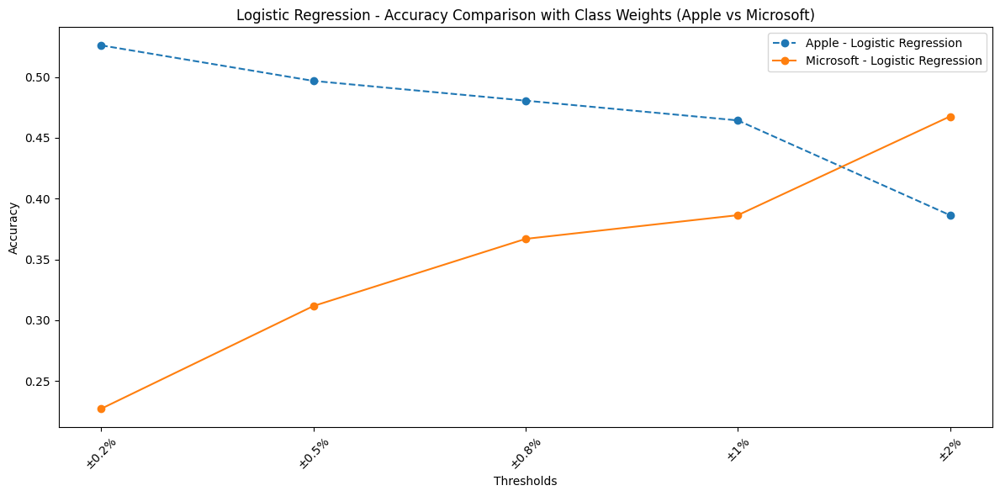

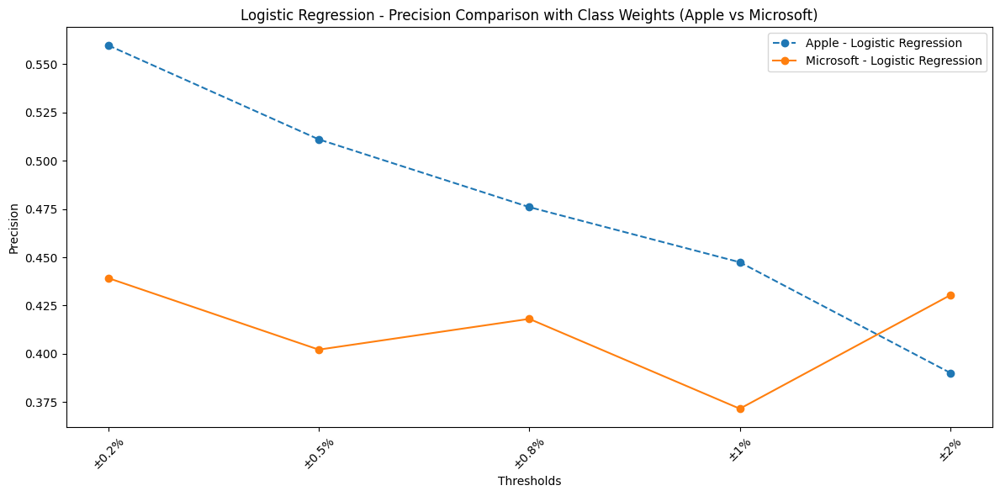

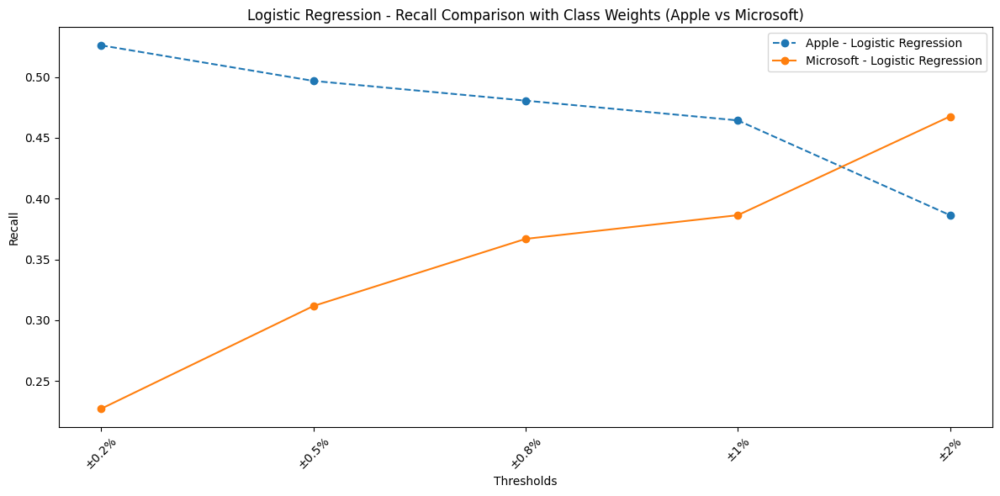

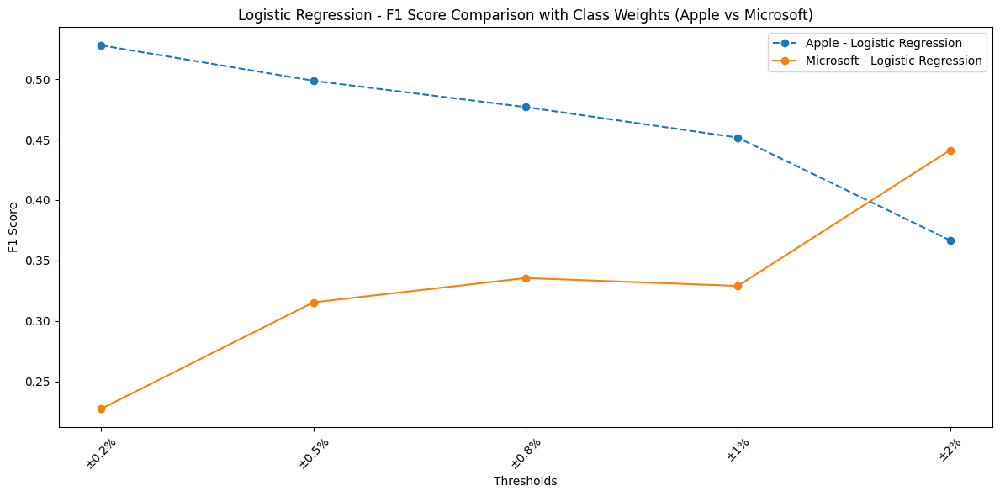

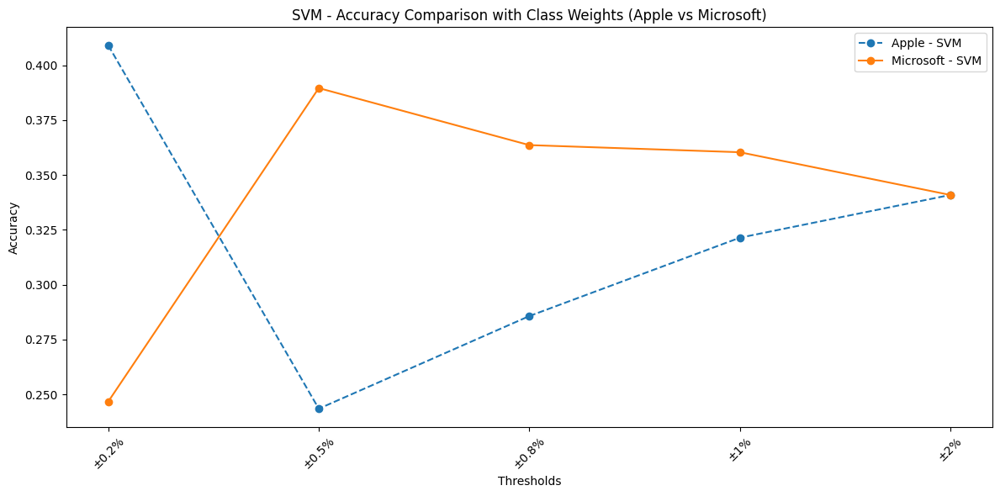

...

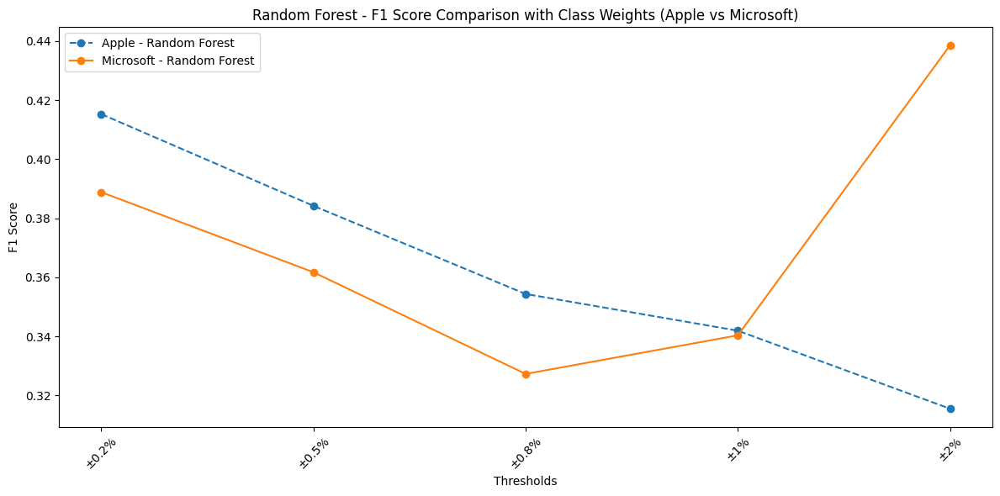

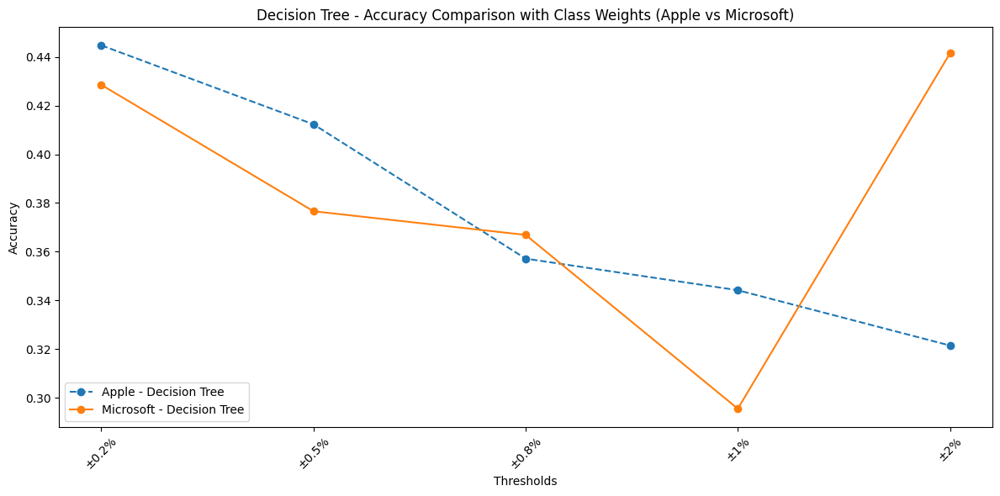

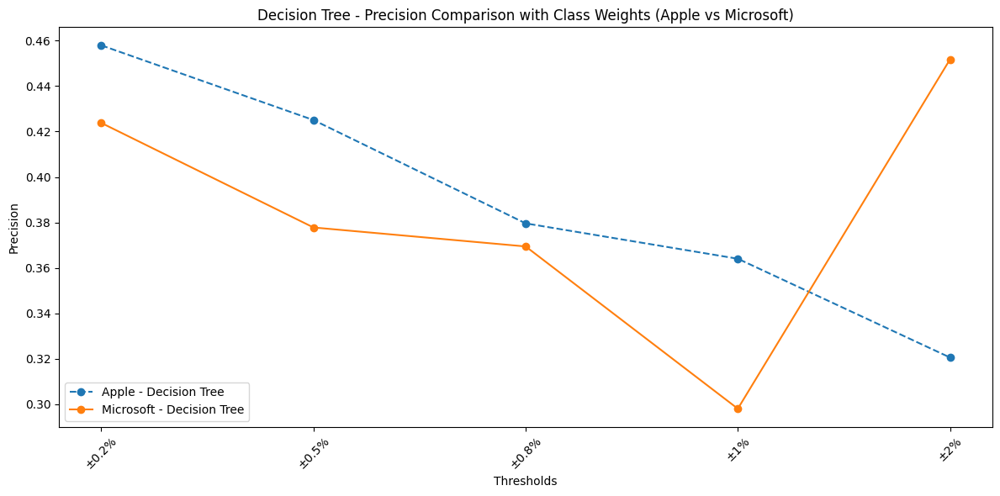

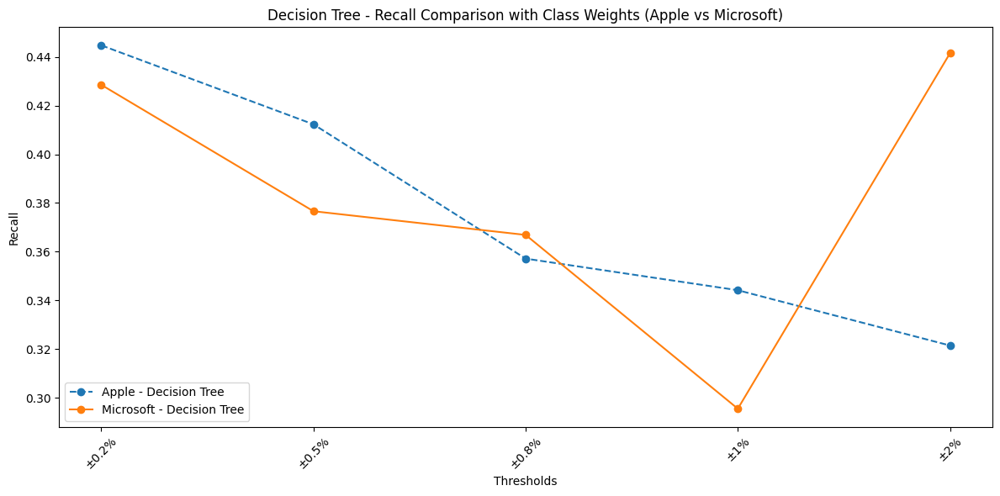

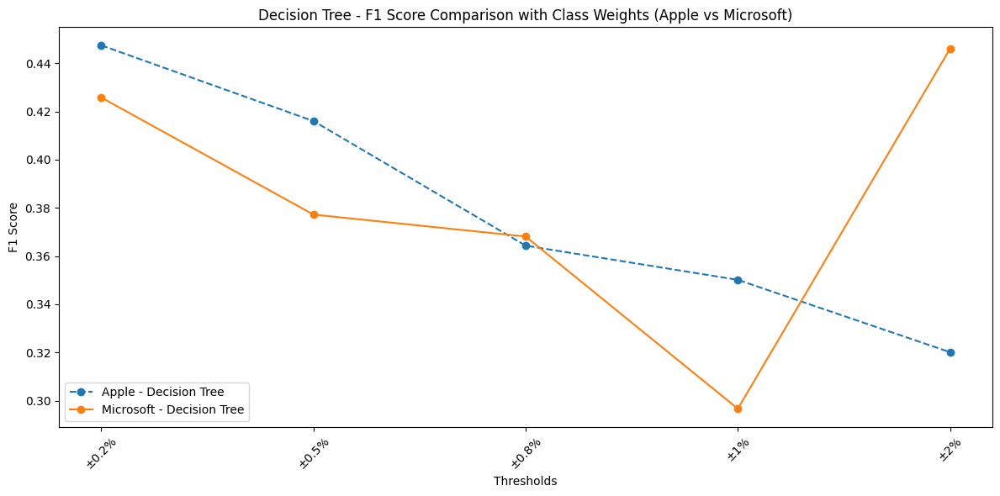

In [ ]:
def evaluate_model_with_class_weights(df, features, target, model, class_weight='balanced'):
    X = df[features].dropna()
    y = df[target].apply(lambda x: 1 if x == 'High' else (0 if x == 'Low' else 2))  # 3-class target
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    if model.__class__.__name__ in ['LogisticRegression', 'SVC', 'RandomForestClassifier', 'DecisionTreeClassifier']:
        model.set_params(class_weight=class_weight)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    return accuracy, precision, recall, f1
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'SVM': SVC(max_iter=1000),
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'Decision Tree': DecisionTreeClassifier(random_state=42)
}
results_weighted = {model: {'Apple': {'Accuracy': [], 'Precision': [], 'Recall': [], 'F1 Score': []},
                            'Microsoft': {'Accuracy': [], 'Precision': [], 'Recall': [], 'F1 Score': []}}
                   for model in models}
for low, high in threshold_sets:
    apple_classified = classify_thresholds(apple_df_preprocessed.copy(), low, high)
    microsoft_classified = classify_thresholds(microsoft_df_preprocessed.copy(), low, high)

    for model_name, model in models.items():
        apple_accuracy, apple_precision, apple_recall, apple_f1 = evaluate_model_with_class_weights(apple_classified, ['MA_5', 'MA_10'], 'Movement', model)
        results_weighted[model_name]['Apple']['Accuracy'].append(apple_accuracy)
        results_weighted[model_name]['Apple']['Precision'].append(apple_precision)
        results_weighted[model_name]['Apple']['Recall'].append(apple_recall)
        results_weighted[model_name]['Apple']['F1 Score'].append(apple_f1)
        microsoft_accuracy, microsoft_precision, microsoft_recall, microsoft_f1 = evaluate_model_with_class_weights(microsoft_classified, ['MA_5', 'MA_10'], 'Movement', model)
        results_weighted[model_name]['Microsoft']['Accuracy'].append(microsoft_accuracy)
        results_weighted[model_name]['Microsoft']['Precision'].append(microsoft_precision)
        results_weighted[model_name]['Microsoft']['Recall'].append(microsoft_recall)
        results_weighted[model_name]['Microsoft']['F1 Score'].append(microsoft_f1)

def plot_weighted_comparison(metric, model_name):
    plt.figure(figsize=(12, 6))
    plt.plot(threshold_labels, results_weighted[model_name]['Apple'][metric], label=f'Apple - {model_name}', marker='o', linestyle='--')
    plt.plot(threshold_labels, results_weighted[model_name]['Microsoft'][metric], label=f'Microsoft - {model_name}', marker='o', linestyle='-')

    plt.title(f'{model_name} - {metric} Comparison with Class Weights (Apple vs Microsoft)')
    plt.xlabel('Thresholds')
    plt.ylabel(metric)
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
for model_name in models.keys():
    for metric in ['Accuracy', 'Precision', 'Recall', 'F1 Score']:
        plot_weighted_comparison(metric, model_name)

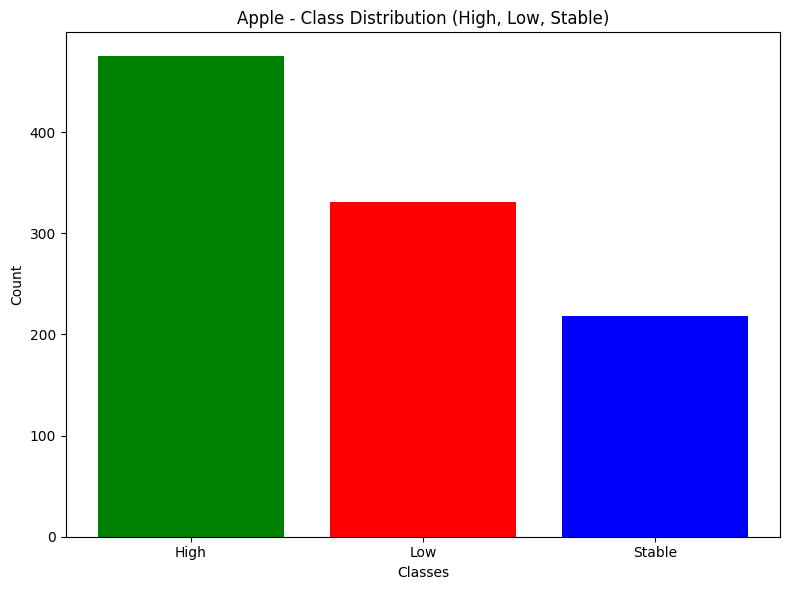

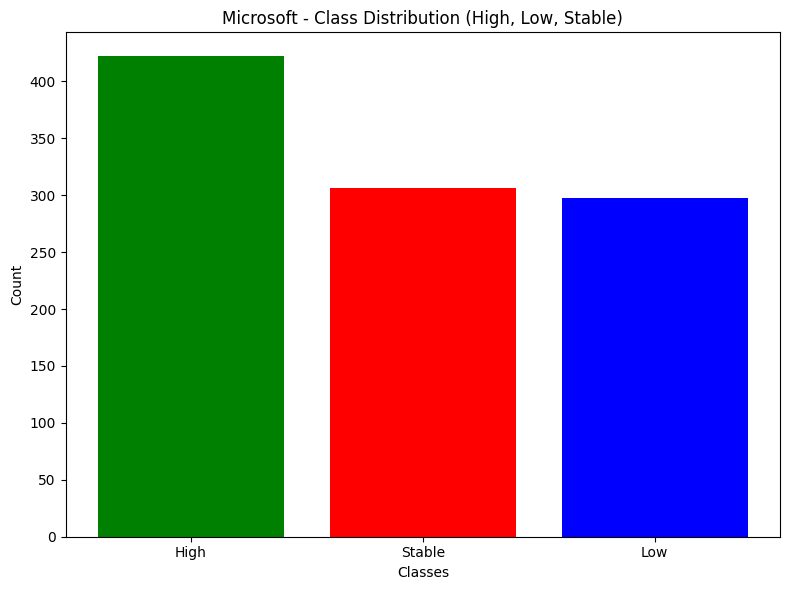

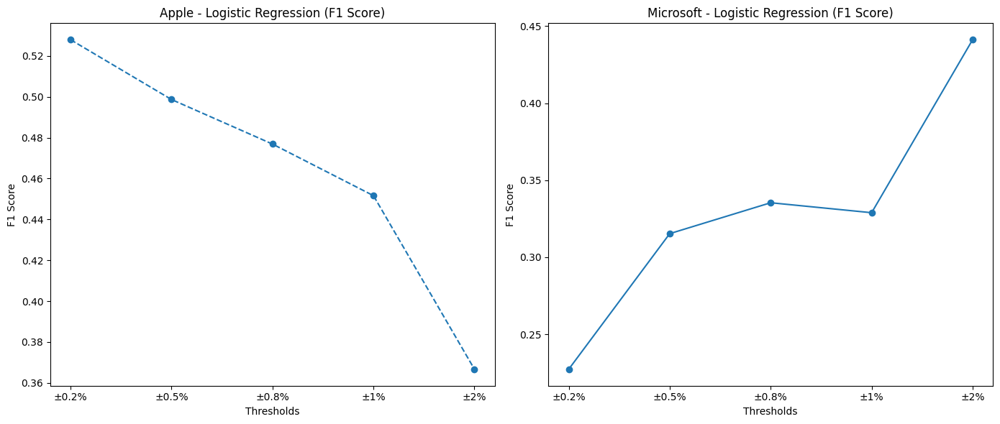

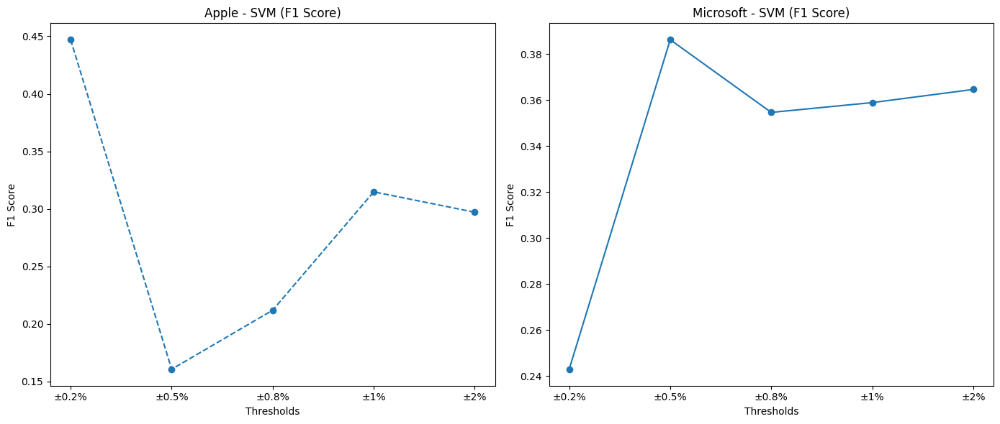

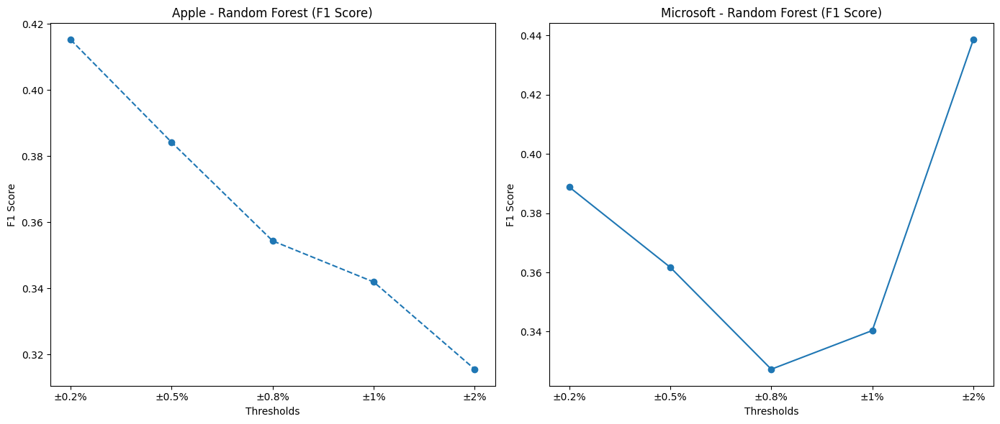

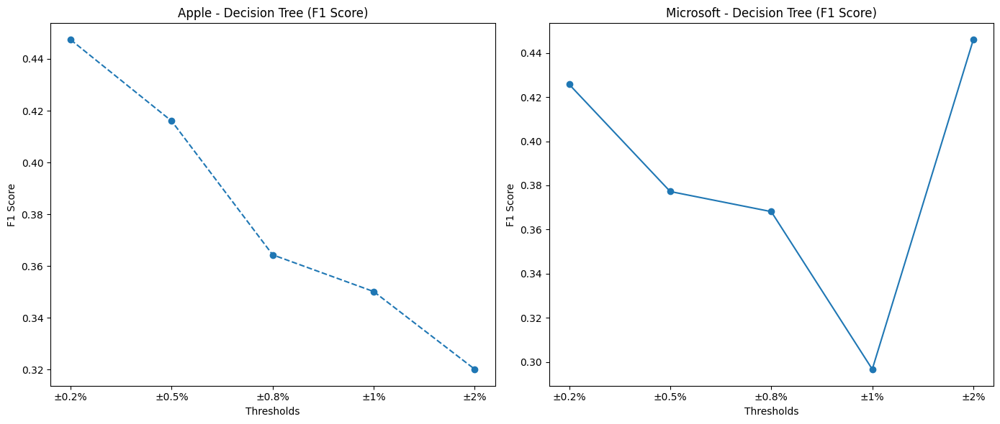

In [ ]:
def plot_class_distribution(df, dataset_name):
    class_counts = df['Movement'].value_counts()

    plt.figure(figsize=(8, 6))
    plt.bar(class_counts.index, class_counts.values, color=['green', 'red', 'blue'])
    plt.title(f'{dataset_name} - Class Distribution (High, Low, Stable)')
    plt.xlabel('Classes')
    plt.ylabel('Count')
    plt.tight_layout()
    plt.show()

plot_class_distribution(apple_df_preprocessed, 'Apple')
plot_class_distribution(microsoft_df_preprocessed, 'Microsoft')

def plot_class_weighted_comparison(model_name):
    fig, ax = plt.subplots(1, 2, figsize=(14, 6))
    ax[0].plot(threshold_labels, results_weighted[model_name]['Apple']['F1 Score'], label=f'Apple - {model_name}', marker='o', linestyle='--')
    ax[0].set_title(f'Apple - {model_name} (F1 Score)')
    ax[0].set_xlabel('Thresholds')
    ax[0].set_ylabel('F1 Score')
    ax[1].plot(threshold_labels, results_weighted[model_name]['Microsoft']['F1 Score'], label=f'Microsoft - {model_name}', marker='o', linestyle='-')
    ax[1].set_title(f'Microsoft - {model_name} (F1 Score)')
    ax[1].set_xlabel('Thresholds')
    ax[1].set_ylabel('F1 Score')

    plt.tight_layout()
    plt.show()
for model_name in models.keys():
    plot_class_weighted_comparison(model_name)

<ipython-input-27-affe49028ae5>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_counts.index, y=class_counts.values, palette='Blues_d')


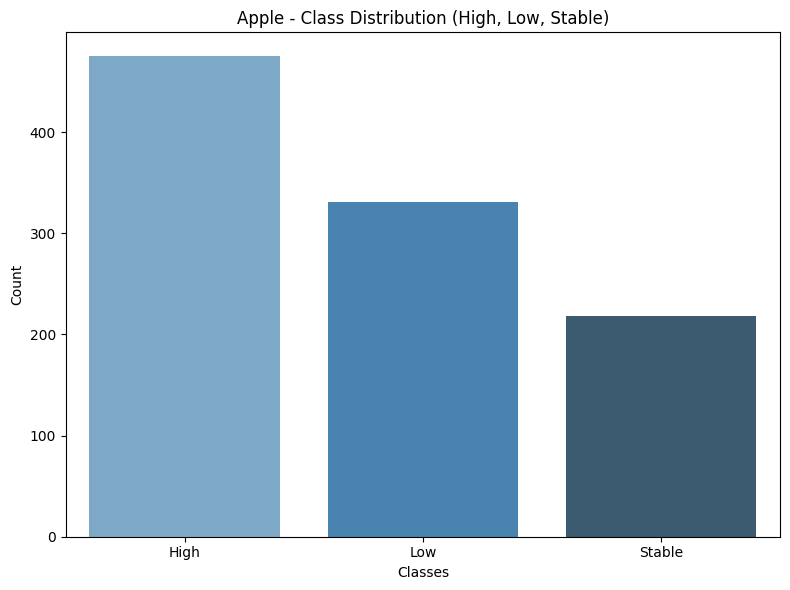

<ipython-input-27-affe49028ae5>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_counts.index, y=class_counts.values, palette='Blues_d')


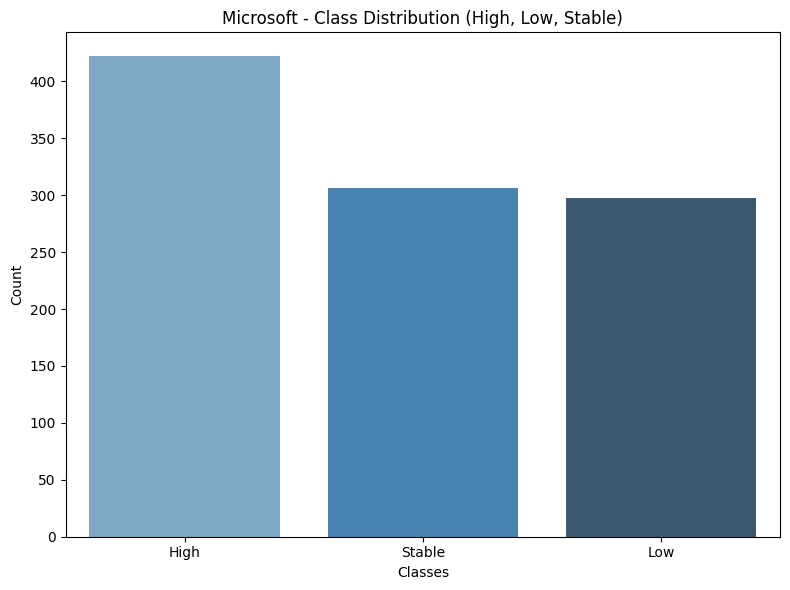

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


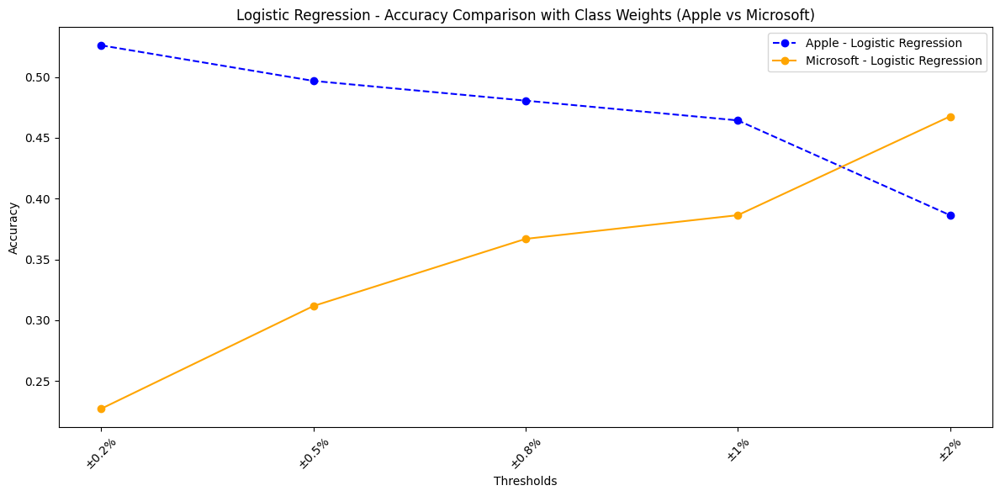

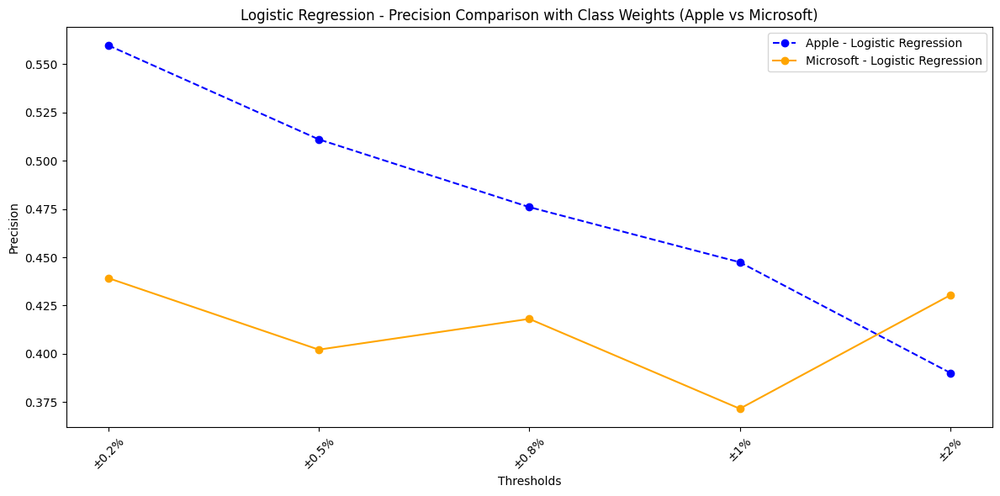

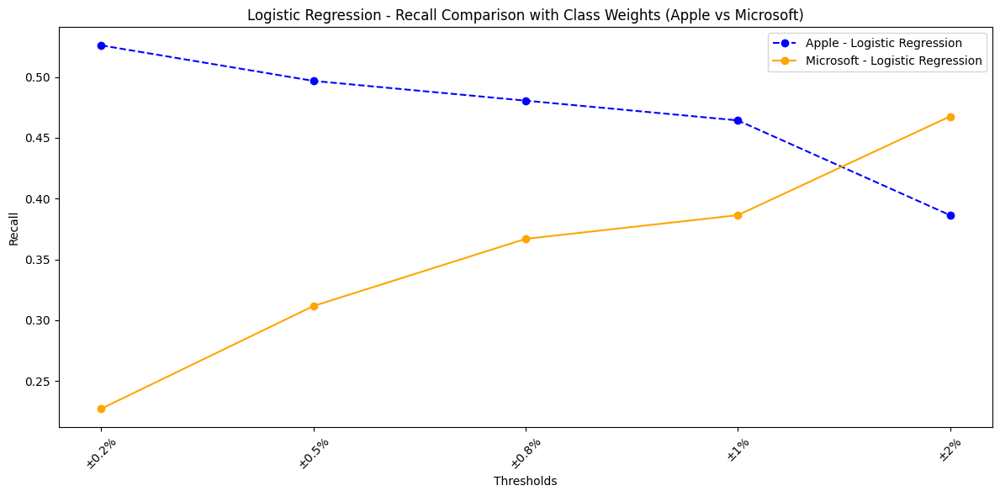

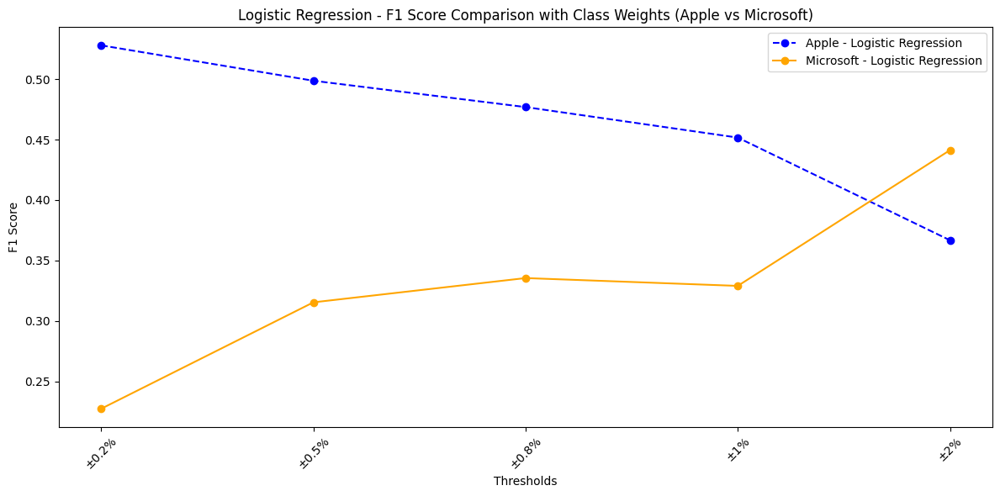

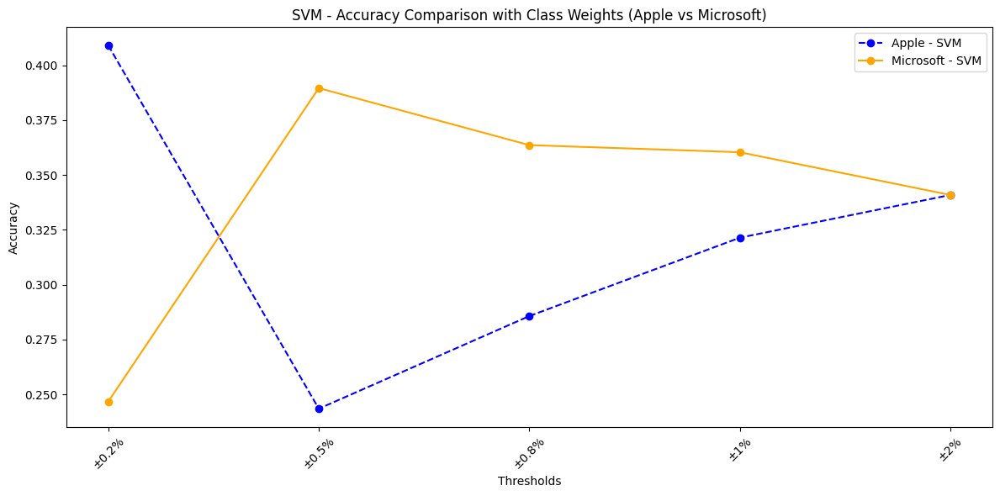

...

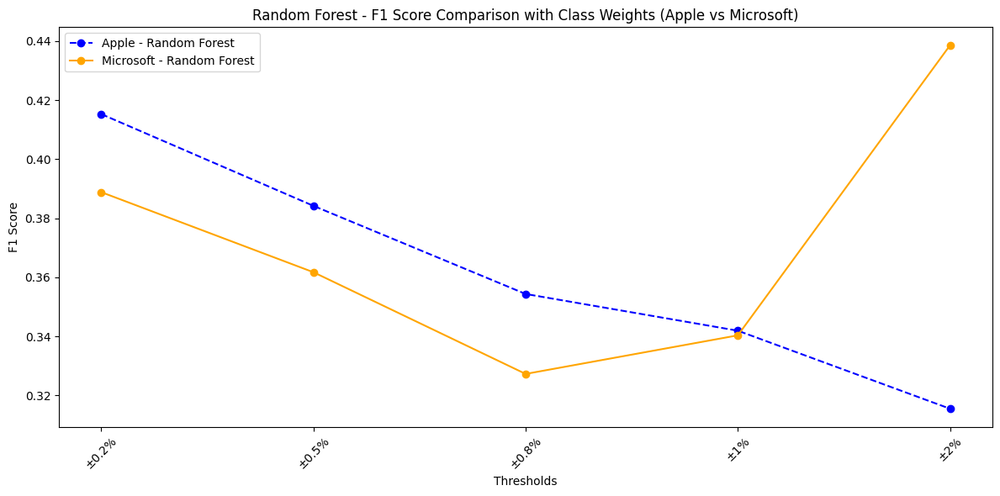

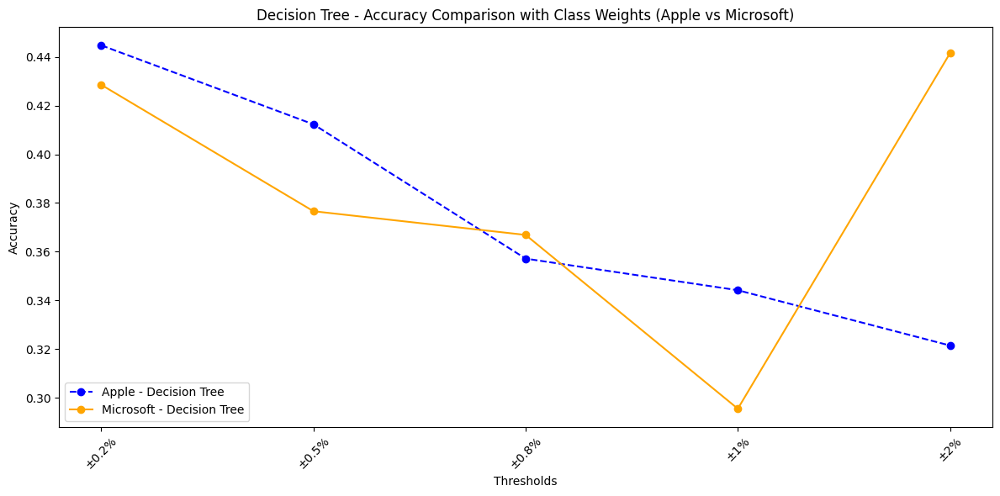

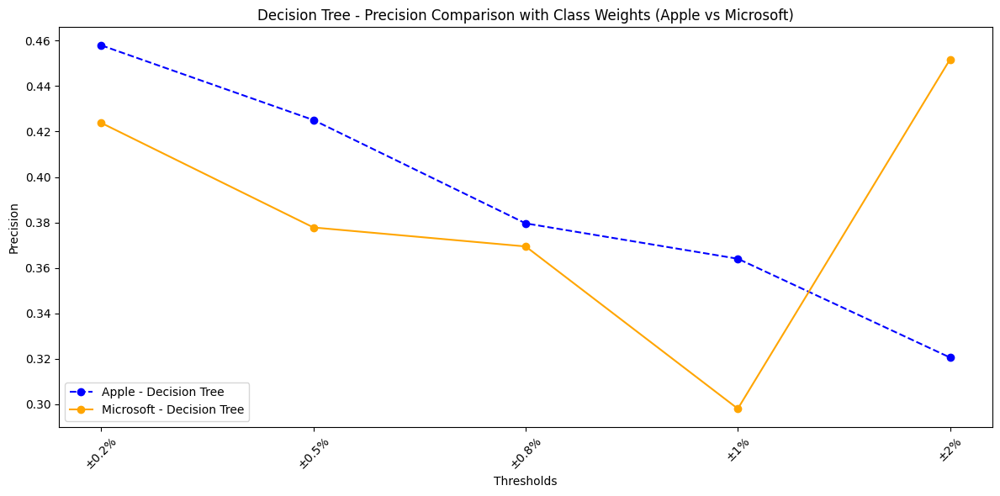

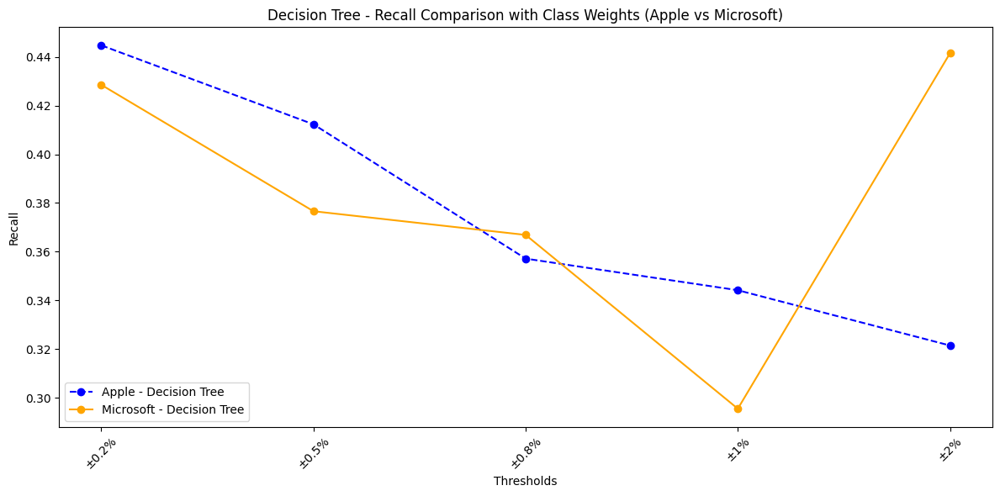

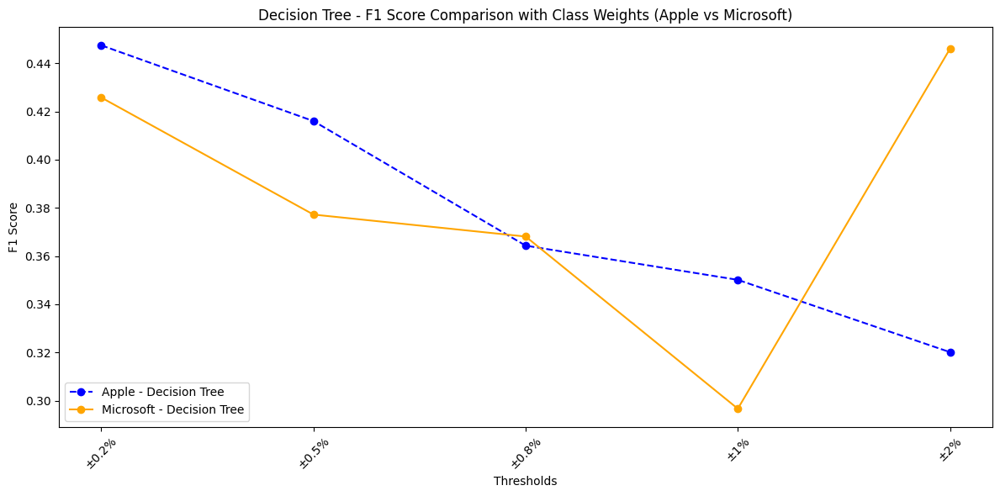

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
def plot_class_distribution(df, dataset_name):
    class_counts = df['Movement'].value_counts()

    plt.figure(figsize=(8, 6))
    sns.barplot(x=class_counts.index, y=class_counts.values, palette='Blues_d')
    plt.title(f'{dataset_name} - Class Distribution (High, Low, Stable)')
    plt.xlabel('Classes')
    plt.ylabel('Count')
    plt.tight_layout()
    plt.show()
plot_class_distribution(apple_df_preprocessed, 'Apple')
plot_class_distribution(microsoft_df_preprocessed, 'Microsoft')
def evaluate_model_with_class_weights(df, features, target, model, class_weight='balanced'):
    X = df[features].dropna()
    y = df[target].apply(lambda x: 1 if x == 'High' else (0 if x == 'Low' else 2))  # 3-class target

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    model.set_params(class_weight=class_weight)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    return accuracy, precision, recall, f1
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'SVM': SVC(max_iter=1000),
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'Decision Tree': DecisionTreeClassifier(random_state=42)
}

results_weighted = {model: {'Apple': {'Accuracy': [], 'Precision': [], 'Recall': [], 'F1 Score': []},
                            'Microsoft': {'Accuracy': [], 'Precision': [], 'Recall': [], 'F1 Score': []}}
                   for model in models}

for low, high in threshold_sets:
    apple_classified = classify_thresholds(apple_df_preprocessed.copy(), low, high)
    microsoft_classified = classify_thresholds(microsoft_df_preprocessed.copy(), low, high)

    for model_name, model in models.items():
        apple_accuracy, apple_precision, apple_recall, apple_f1 = evaluate_model_with_class_weights(apple_classified, ['MA_5', 'MA_10'], 'Movement', model)
        results_weighted[model_name]['Apple']['Accuracy'].append(apple_accuracy)
        results_weighted[model_name]['Apple']['Precision'].append(apple_precision)
        results_weighted[model_name]['Apple']['Recall'].append(apple_recall)
        results_weighted[model_name]['Apple']['F1 Score'].append(apple_f1)
        microsoft_accuracy, microsoft_precision, microsoft_recall, microsoft_f1 = evaluate_model_with_class_weights(microsoft_classified, ['MA_5', 'MA_10'], 'Movement', model)
        results_weighted[model_name]['Microsoft']['Accuracy'].append(microsoft_accuracy)
        results_weighted[model_name]['Microsoft']['Precision'].append(microsoft_precision)
        results_weighted[model_name]['Microsoft']['Recall'].append(microsoft_recall)
        results_weighted[model_name]['Microsoft']['F1 Score'].append(microsoft_f1)
def plot_weighted_comparison(metric, model_name):
    plt.figure(figsize=(12, 6))
    plt.plot(threshold_labels, results_weighted[model_name]['Apple'][metric], label=f'Apple - {model_name}', marker='o', linestyle='--', color='blue')
    plt.plot(threshold_labels, results_weighted[model_name]['Microsoft'][metric], label=f'Microsoft - {model_name}', marker='o', linestyle='-', color='orange')

    plt.title(f'{model_name} - {metric} Comparison with Class Weights (Apple vs Microsoft)')
    plt.xlabel('Thresholds')
    plt.ylabel(metric)
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
for model_name in models.keys():
    for metric in ['Accuracy', 'Precision', 'Recall', 'F1 Score']:
        plot_weighted_comparison(metric, model_name)

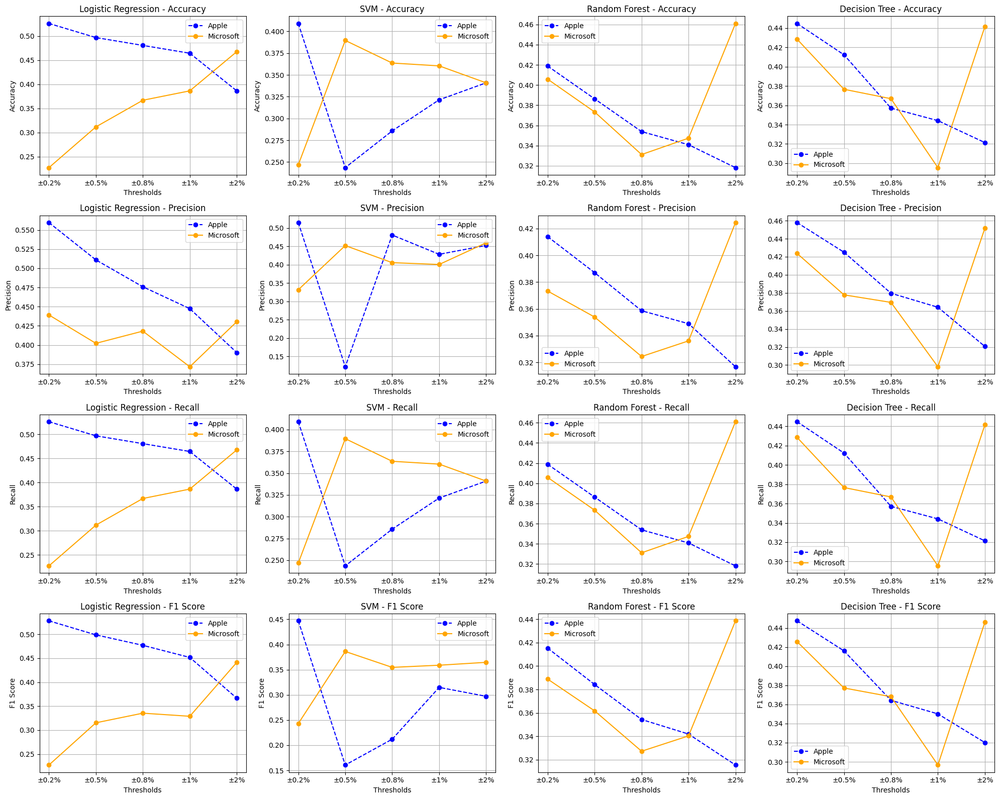

In [ ]:
import matplotlib.pyplot as plt
def plot_all_algorithms_in_one_view():
    fig, axes = plt.subplots(4, 4, figsize=(20, 16))
    metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
    models_list = list(models.keys())

    for row_idx, metric in enumerate(metrics):
        for col_idx, model_name in enumerate(models_list):
            ax = axes[row_idx, col_idx]
            ax.plot(threshold_labels, results_weighted[model_name]['Apple'][metric], label=f'Apple', marker='o', linestyle='--', color='blue')
            ax.plot(threshold_labels, results_weighted[model_name]['Microsoft'][metric], label=f'Microsoft', marker='o', linestyle='-', color='orange')

            ax.set_title(f'{model_name} - {metric}')
            ax.set_xlabel('Thresholds')
            ax.set_ylabel(metric)
            ax.legend()
            ax.grid(True)

    plt.tight_layout()
    plt.show()
plot_all_algorithms_in_one_view()

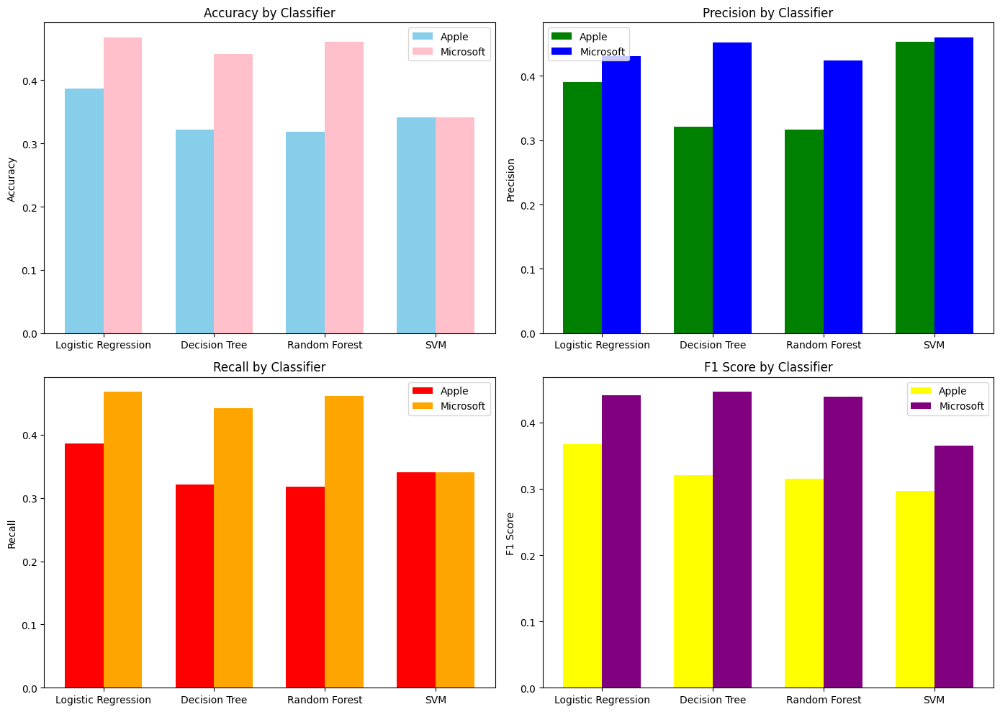

In [ ]:
classifiers = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'SVM']

accuracy_apple = [results_weighted[clf]['Apple']['Accuracy'][-1] for clf in classifiers]
accuracy_microsoft = [results_weighted[clf]['Microsoft']['Accuracy'][-1] for clf in classifiers]

precision_apple = [results_weighted[clf]['Apple']['Precision'][-1] for clf in classifiers]
precision_microsoft = [results_weighted[clf]['Microsoft']['Precision'][-1] for clf in classifiers]

recall_apple = [results_weighted[clf]['Apple']['Recall'][-1] for clf in classifiers]
recall_microsoft = [results_weighted[clf]['Microsoft']['Recall'][-1] for clf in classifiers]

f1_score_apple = [results_weighted[clf]['Apple']['F1 Score'][-1] for clf in classifiers]
f1_score_microsoft = [results_weighted[clf]['Microsoft']['F1 Score'][-1] for clf in classifiers]

bar_width = 0.35
index = np.arange(len(classifiers))

plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.bar(index, accuracy_apple, bar_width, label='Apple', color='skyblue')
plt.bar(index + bar_width, accuracy_microsoft, bar_width, label='Microsoft', color='pink')
plt.title('Accuracy by Classifier')
plt.ylabel('Accuracy')
plt.xticks(index + bar_width / 2, classifiers)
plt.legend()

plt.subplot(2, 2, 2)
plt.bar(index, precision_apple, bar_width, label='Apple', color='green')
plt.bar(index + bar_width, precision_microsoft, bar_width, label='Microsoft', color='blue')
plt.title('Precision by Classifier')
plt.ylabel('Precision')
plt.xticks(index + bar_width / 2, classifiers)
plt.legend()
plt.subplot(2, 2, 3)
plt.bar(index, recall_apple, bar_width, label='Apple', color='red')
plt.bar(index + bar_width, recall_microsoft, bar_width, label='Microsoft', color='orange')
plt.title('Recall by Classifier')
plt.ylabel('Recall')
plt.xticks(index + bar_width / 2, classifiers)
plt.legend()
plt.subplot(2, 2, 4)
plt.bar(index, f1_score_apple, bar_width, label='Apple', color='yellow')
plt.bar(index + bar_width, f1_score_microsoft, bar_width, label='Microsoft', color='purple')
plt.title('F1 Score by Classifier')
plt.ylabel('F1 Score')
plt.xticks(index + bar_width / 2, classifiers)
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# creating a 5 day and a 10day moving average for the closing price
apple_df['MA_5'] = apple_df['Close'].rolling(window=5).mean()
apple_df['MA_10'] = apple_df['Close'].rolling(window=10).mean()

microsoft_df['MA_5'] = microsoft_df['Close'].rolling(window=5).mean()
microsoft_df['MA_10'] = microsoft_df['Close'].rolling(window=10).mean()

# calculation of daily returns as the percentage change in the closing price
apple_df['Daily_Return'] = apple_df['Close'].pct_change() * 100
microsoft_df['Daily_Return'] = microsoft_df['Close'].pct_change() * 100

# calculation of daily volatility as the range high - low
apple_df['Volatility'] = apple_df['High'] - apple_df['Low']
microsoft_df['Volatility'] = microsoft_df['High'] - microsoft_df['Low']

# display of the first few rows of each dataset with the new features
apple_df_with_features = apple_df[['Date', 'Close', 'MA_5', 'MA_10', 'Daily_Return', 'Volatility']].head()
microsoft_df_with_features = microsoft_df[['Date', 'Close', 'MA_5', 'MA_10', 'Daily_Return', 'Volatility']].head()

apple_df_with_features, microsoft_df_with_features

(         Date     Close      MA_5  MA_10  Daily_Return  Volatility
 0  2004-01-12  0.405714       NaN    NaN           NaN    0.041785
 1  2004-01-19  0.402857       NaN    NaN     -0.704191    0.014108
 2  2004-01-26  0.402857       NaN    NaN      0.000000    0.021250
 3  2004-02-02  0.405536       NaN    NaN      0.665000    0.021607
 4  2004-02-09  0.410714  0.405536    NaN      1.276829    0.029643,
          Date      Close    MA_5  MA_10  Daily_Return  Volatility
 0  2004-01-01  28.209999     NaN    NaN           NaN    0.979999
 1  2004-01-08  27.700001     NaN    NaN     -1.807863    1.220000
 2  2004-01-15  28.299999     NaN    NaN      2.166058    0.879999
 3  2004-01-22  27.709999     NaN    NaN     -2.084806    1.360001
 4  2004-01-29  27.010000  27.786    NaN     -2.526160    0.940001)

In [ ]:
# additional moving averages with different window sizes 20 day sand 50 days
apple_df['MA_20'] = apple_df['Close'].rolling(window=20).mean()
apple_df['MA_50'] = apple_df['Close'].rolling(window=50).mean()

microsoft_df['MA_20'] = microsoft_df['Close'].rolling(window=20).mean()
microsoft_df['MA_50'] = microsoft_df['Close'].rolling(window=50).mean()

# defining thresholds for daily returns (+/-0.5%, +/-1%, +/-2%)
def classify_return(return_value, thresholds):
    if return_value > thresholds[1]:
        return "Up"
    elif return_value < thresholds[0]:
        return "Down"
    else:
        return "Stable"

# classification with different thresholds
thresholds = [-0.5, 0.5]
apple_df['Return_Classification_0.5%'] = apple_df['Daily_Return'].apply(lambda x: classify_return(x, thresholds))
microsoft_df['Return_Classification_0.5%'] = microsoft_df['Daily_Return'].apply(lambda x: classify_return(x, thresholds))

thresholds = [-1.0, 1.0]
apple_df['Return_Classification_1%'] = apple_df['Daily_Return'].apply(lambda x: classify_return(x, thresholds))
microsoft_df['Return_Classification_1%'] = microsoft_df['Daily_Return'].apply(lambda x: classify_return(x, thresholds))

thresholds = [-2.0, 2.0]
apple_df['Return_Classification_2%'] = apple_df['Daily_Return'].apply(lambda x: classify_return(x, thresholds))
microsoft_df['Return_Classification_2%'] = microsoft_df['Daily_Return'].apply(lambda x: classify_return(x, thresholds))

# displaay the first few rows with the new classifications and moving averages
apple_df_tuned = apple_df[['Date', 'Close', 'MA_5', 'MA_10', 'MA_20', 'MA_50',
                           'Daily_Return', 'Return_Classification_0.5%',
                           'Return_Classification_1%', 'Return_Classification_2%']].head(10)

microsoft_df_tuned = microsoft_df[['Date', 'Close', 'MA_5', 'MA_10', 'MA_20', 'MA_50',
                                   'Daily_Return', 'Return_Classification_0.5%',
                                   'Return_Classification_1%', 'Return_Classification_2%']].head(10)

apple_df_tuned, microsoft_df_tuned

(         Date     Close      MA_5     MA_10  MA_20  MA_50  Daily_Return  \
 0  2004-01-12  0.405714       NaN       NaN    NaN    NaN           NaN   
 1  2004-01-19  0.402857       NaN       NaN    NaN    NaN     -0.704191   
 2  2004-01-26  0.402857       NaN       NaN    NaN    NaN      0.000000   
 3  2004-02-02  0.405536       NaN       NaN    NaN    NaN      0.665000   
 4  2004-02-09  0.410714  0.405536       NaN    NaN    NaN      1.276829   
 5  2004-02-16  0.400000  0.404393       NaN    NaN    NaN     -2.608628   
 6  2004-02-23  0.427143  0.409250       NaN    NaN    NaN      6.785750   
 7  2004-03-01  0.477500  0.424179       NaN    NaN    NaN     11.789260   
 8  2004-03-08  0.492143  0.441500       NaN    NaN    NaN      3.066597   
 9  2004-03-15  0.461786  0.451714  0.428625    NaN    NaN     -6.168329   
 
   Return_Classification_0.5% Return_Classification_1% Return_Classification_2%  
 0                     Stable                   Stable                   Stable 

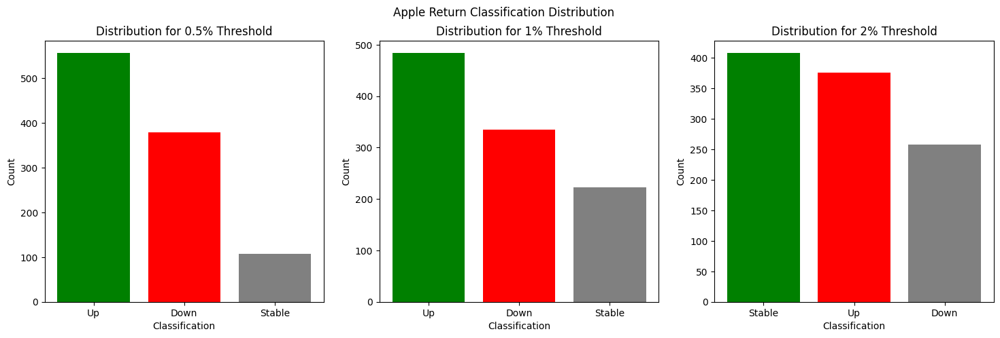

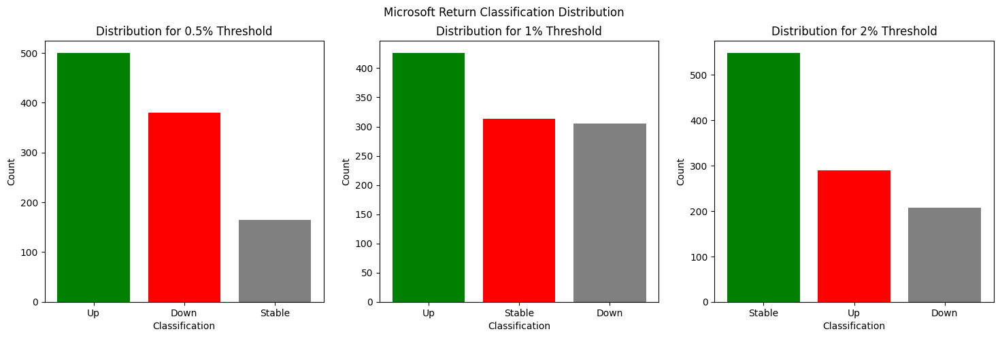

In [ ]:
import matplotlib.pyplot as plt

# plot distribution of classifications
def plot_classification_distribution(df, title):
    fig, ax = plt.subplots(1, 3, figsize=(18, 5))
    thresholds = ['0.5%', '1%', '2%']

    for i, threshold in enumerate(thresholds):
        distribution = df[f'Return_Classification_{threshold}'].value_counts()
        ax[i].bar(distribution.index, distribution.values, color=['green', 'red', 'gray'])
        ax[i].set_title(f'Distribution for {threshold} Threshold')
        ax[i].set_xlabel('Classification')
        ax[i].set_ylabel('Count')

    fig.suptitle(title)
    plt.show()

# plot the distribution of classifications for Apple and Microsoft
plot_classification_distribution(apple_df, 'Apple Return Classification Distribution')
plot_classification_distribution(microsoft_df, 'Microsoft Return Classification Distribution')

In [ ]:
# percentage distribution of each classification for Apple and Microsoft datasets
def calculate_classification_percentages(df):
    percentages = {}
    thresholds = ['0.5%', '1%', '2%']

    for threshold in thresholds:
        distribution = df[f'Return_Classification_{threshold}'].value_counts(normalize=True) * 100
        percentages[threshold] = distribution

    return pd.DataFrame(percentages)

# classification percentages for Apple and Microsoft
apple_classification_percentages = calculate_classification_percentages(apple_df)
microsoft_classification_percentages = calculate_classification_percentages(microsoft_df)

apple_classification_percentages, microsoft_classification_percentages

(             0.5%         1%         2%
 Down    36.372361  32.149712  24.760077
 Stable  10.268714  21.401152  39.155470
 Up      53.358925  46.449136  36.084453,
              0.5%         1%         2%
 Down    36.398467  29.214559  19.827586
 Stable  15.708812  29.980843  52.490421
 Up      47.892720  40.804598  27.681992)

In [ ]:
# preparation for the dataset to use the 1% threshold for the final classification
apple_final_df = apple_df[['Date', 'Close', 'MA_5', 'MA_10', 'MA_20', 'MA_50',
                           'Volatility', 'Return_Classification_1%']].dropna()

microsoft_final_df = microsoft_df[['Date', 'Close', 'MA_5', 'MA_10', 'MA_20', 'MA_50',
                                   'Volatility', 'Return_Classification_1%']].dropna()

# show the first few rows of the finalized datasets for Apple and Microsoft
apple_final_df_head = apple_final_df.head()
microsoft_final_df_head = microsoft_final_df.head()

apple_final_df_head, microsoft_final_df_head

(          Date     Close      MA_5     MA_10     MA_20     MA_50  Volatility  \
 49  2004-12-20  1.143036  1.147786  1.047464  0.849402  0.634732    0.078571   
 50  2004-12-27  1.150000  1.147250  1.077804  0.879366  0.649618    0.055357   
 51  2005-01-03  1.236607  1.170714  1.107893  0.913697  0.666293    0.125536   
 52  2005-01-10  1.253571  1.188750  1.135536  0.945705  0.683307    0.198572   
 53  2005-01-17  1.258750  1.208393  1.162304  0.977188  0.700371    0.068750   
 
    Return_Classification_1%  
 49                     Down  
 50                   Stable  
 51                       Up  
 52                       Up  
 53                   Stable  ,
           Date      Close    MA_5   MA_10    MA_20    MA_50  Volatility  \
 49  2004-12-09  27.110001  27.106  27.861  27.7080  27.1496    0.490000   
 50  2004-12-16  26.969999  27.066  27.755  27.6535  27.1248    0.539999   
 51  2004-12-23  26.900000  27.118  27.575  27.6280  27.1088    0.350001   
 52  2004-12-30  26.7

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# rncode the target variable
label_encoder = LabelEncoder()
apple_final_df['Return_Classification_1%_Encoded'] = label_encoder.fit_transform(apple_final_df['Return_Classification_1%'])

# select features and target
features = ['MA_5', 'MA_10', 'MA_20', 'MA_50', 'Volatility']
X = apple_final_df[features]
y = apple_final_df['Return_Classification_1%_Encoded']

# spkit the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# inilitialize and fit the LR model
logistic_model = LogisticRegression(max_iter=1000)
logistic_model.fit(X_train, y_train)

# making predictions on the test set
y_pred = logistic_model.predict(X_test)

# calculate the evaluation metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

# ahow the evaluation metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

Accuracy: 0.4161
Precision: 0.3466
Recall: 0.4161
F1 Score: 0.3126


In [ ]:
from sklearn.tree import DecisionTreeClassifier

# initialize and fit Decision Tree model
tree_model = DecisionTreeClassifier(random_state=42)
tree_model.fit(X_train, y_train)

# making predictions
y_pred_tree = tree_model.predict(X_test)

# evaluation metrics
accuracy_tree = accuracy_score(y_test, y_pred_tree)
precision_tree = precision_score(y_test, y_pred_tree, average='weighted')
recall_tree = recall_score(y_test, y_pred_tree, average='weighted')
f1_tree = f1_score(y_test, y_pred_tree, average='weighted')

# Display metrics
print(f"Decision Tree Accuracy: {accuracy_tree:.4f}")
print(f"Decision Tree Precision: {precision_tree:.4f}")
print(f"Decision Tree Recall: {recall_tree:.4f}")
print(f"Decision Tree F1 Score: {f1_tree:.4f}")

Decision Tree Accuracy: 0.3557
Decision Tree Precision: 0.3641
Decision Tree Recall: 0.3557
Decision Tree F1 Score: 0.3577


In [ ]:
from sklearn.model_selection import GridSearchCV

# setting up the hyperparameters grid
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'solver': ['liblinear', 'lbfgs', 'saga'],
    'penalty': ['l1', 'l2']
}

# initialize LR with GridSearchCV
grid_search = GridSearchCV(LogisticRegression(max_iter=1000), param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# best parameters and score
print("Best Hyperparameters:", grid_search.best_params_)
print("Best Accuracy:", grid_search.best_score_)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

Best Hyperparameters: {'C': 1, 'penalty': 'l1', 'solver': 'saga'}
Best Accuracy: 0.4920863309352518


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


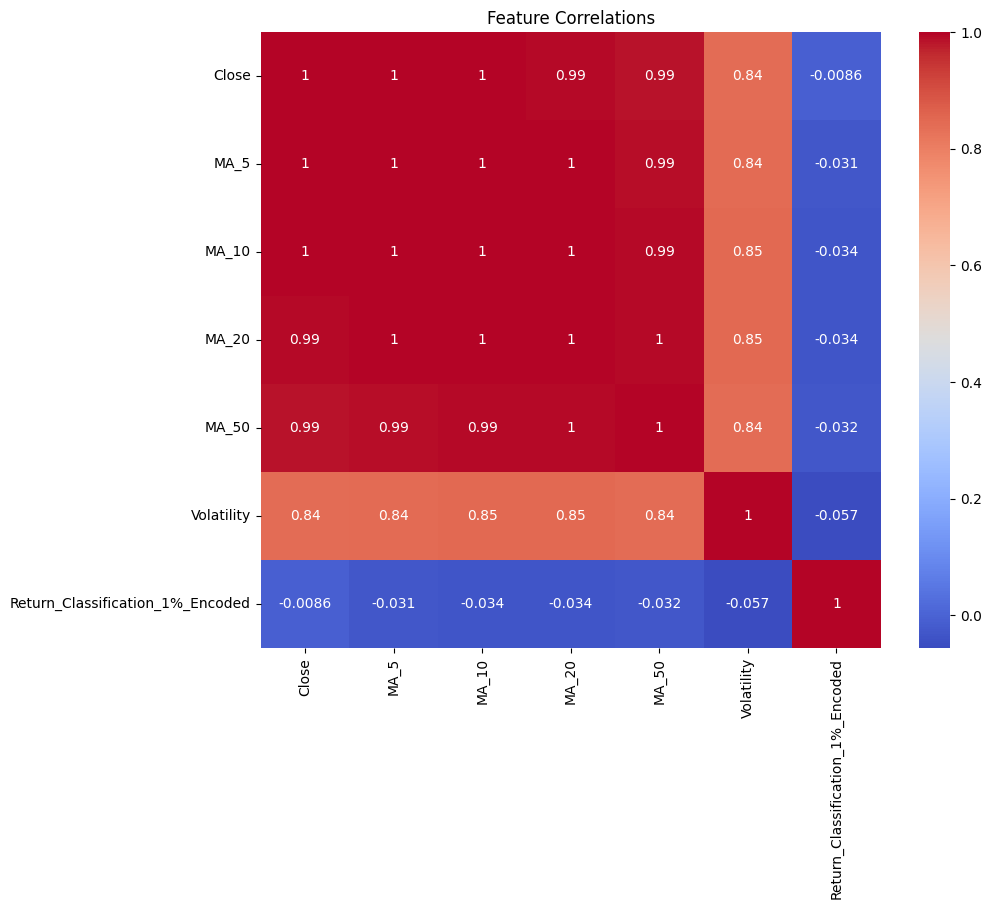

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# in order to continue with visualization properyl firstly beginning by dropping nonnumeric columns such as date for correlation analysis
numeric_df = apple_final_df.drop(columns=['Date', 'Return_Classification_1%'])

# correlation matric
plt.figure(figsize=(10, 8))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm')
plt.title('Feature Correlations')
plt.show()

In [ ]:
# daily returns as the percentage change in the closing price
apple_df['Daily_Return'] = apple_df['Close'].pct_change() * 100

print(apple_df.columns)

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'MA_5',
       'MA_10', 'Daily_Return', 'Volatility', 'MA_20', 'MA_50',
       'Return_Classification_0.5%', 'Return_Classification_1%',
       'Return_Classification_2%'],
      dtype='object')


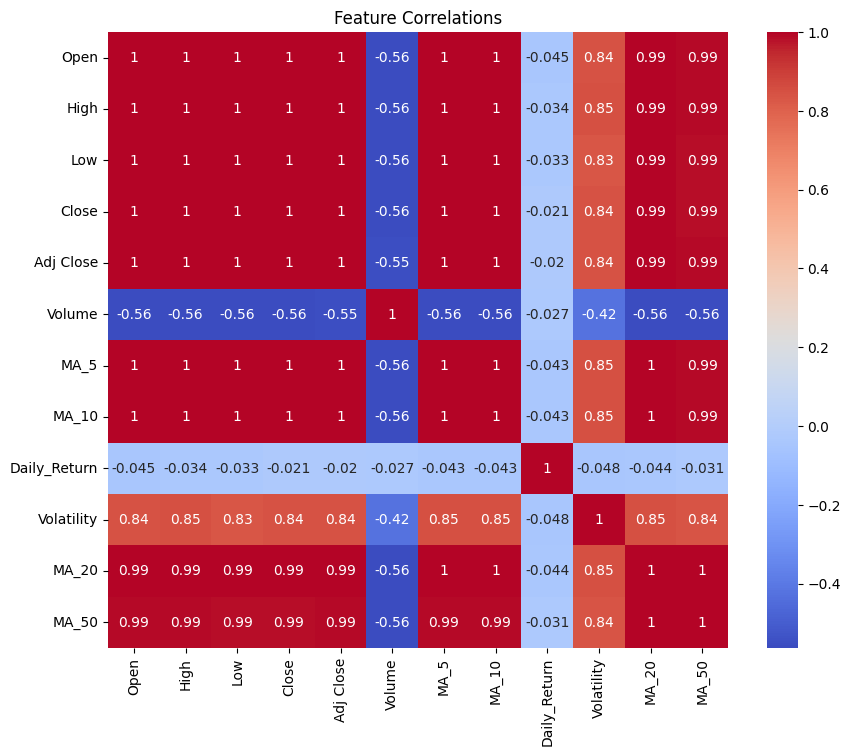

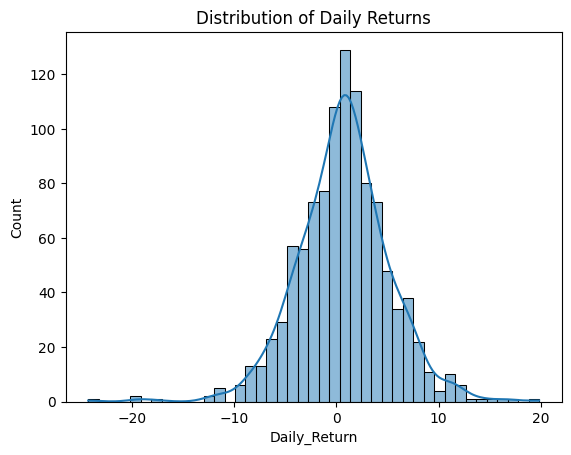

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# get rid non-numeric columns like Date and Return_Classification for correlation analysis
numeric_df = apple_df.drop(columns=['Date', 'Return_Classification_0.5%', 'Return_Classification_1%', 'Return_Classification_2%'])

# visualize the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm')
plt.title('Feature Correlations')
plt.show()

# show distribution of daily returns
sns.histplot(apple_df['Daily_Return'], kde=True)
plt.title('Distribution of Daily Returns')
plt.show()

In [ ]:
# MACD calculation
apple_df['EMA_12'] = apple_df['Close'].ewm(span=12, adjust=False).mean()
apple_df['EMA_26'] = apple_df['Close'].ewm(span=26, adjust=False).mean()
apple_df['MACD'] = apple_df['EMA_12'] - apple_df['EMA_26']
apple_df['Signal_Line'] = apple_df['MACD'].ewm(span=9, adjust=False).mean()

In [ ]:
def classify_volatility(volatility, low_thresh, high_thresh):
    if volatility > high_thresh:
        return "High Volatility"
    elif volatility < low_thresh:
        return "Low Volatility"
    else:
        return "Average Volatility"

apple_df['Volatility_Class'] = apple_df['Volatility'].apply(lambda x: classify_volatility(x, 0.5, 1.5))

In [ ]:
# check ahain for missing values in the dataset
print(X.isnull().sum())

MA_5          0
MA_10         0
MA_20         0
MA_50         0
Volatility    0
dtype: int64


In [ ]:
# drop rows with NaN values
X = X.dropna()
y = y[X.index]

In [ ]:
from sklearn.impute import SimpleImputer

# initialize the imputer to fill missing values with the mean of the column
imputer = SimpleImputer(strategy='mean')

# impute missing values in X
X = imputer.fit_transform(X)

In [ ]:
# initialize results dictionary to store performance metrics for each threshold
results = {}

# loop over the thresholds
for threshold in ['Return_Classification_0.5%', 'Return_Classification_1%', 'Return_Classification_2%']:

    # encoding the target variable
    label_encoder = LabelEncoder()
    apple_df[f'{threshold}_Encoded'] = label_encoder.fit_transform(apple_df[threshold])

    # select the features and target
    X = apple_df[['MA_5', 'MA_10', 'MA_20', 'MA_50', 'Volatility']]
    y = apple_df[f'{threshold}_Encoded']

    # drop rows with NaN values
    X = X.dropna()
    y = y[X.index]

    # splitting the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # fit the LR model
    logistic_model = LogisticRegression(max_iter=1000)
    logistic_model.fit(X_train, y_train)

    # predictions on the test set
    y_pred = logistic_model.predict(X_test)

    # evaluation metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    # storing the results for the corresponsing theshold
    results[threshold] = {
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }


for threshold, metrics in results.items():
    print(f"\nResults for {threshold}:")
    print(f"Accuracy: {metrics['Accuracy']:.4f}")
    print(f"Precision: {metrics['Precision']:.4f}")
    print(f"Recall: {metrics['Recall']:.4f}")
    print(f"F1 Score: {metrics['F1 Score']:.4f}")


Results for Return_Classification_0.5%:
Accuracy: 0.4899
Precision: 0.3697
Recall: 0.4899
F1 Score: 0.3789

Results for Return_Classification_1%:
Accuracy: 0.4161
Precision: 0.3466
Recall: 0.4161
F1 Score: 0.3126

Results for Return_Classification_2%:
Accuracy: 0.4698
Precision: 0.3914
Recall: 0.4698
F1 Score: 0.4116


In [ ]:
from sklearn.impute import SimpleImputer

results = {}

for threshold in ['Return_Classification_0.5%', 'Return_Classification_1%', 'Return_Classification_2%']:

    label_encoder = LabelEncoder()
    apple_df[f'{threshold}_Encoded'] = label_encoder.fit_transform(apple_df[threshold])

    X = apple_df[['MA_5', 'MA_10', 'MA_20', 'MA_50', 'Volatility']]
    y = apple_df[f'{threshold}_Encoded']

    imputer = SimpleImputer(strategy='mean')
    X = imputer.fit_transform(X)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    logistic_model = LogisticRegression(max_iter=1000)
    logistic_model.fit(X_train, y_train)

    y_pred = logistic_model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    results[threshold] = {
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

for threshold, metrics in results.items():
    print(f"\nResults for {threshold}:")
    print(f"Accuracy: {metrics['Accuracy']:.4f}")
    print(f"Precision: {metrics['Precision']:.4f}")
    print(f"Recall: {metrics['Recall']:.4f}")
    print(f"F1 Score: {metrics['F1 Score']:.4f}")


Results for Return_Classification_0.5%:
Accuracy: 0.5112
Precision: 0.4231
Recall: 0.5112
F1 Score: 0.3965

Results for Return_Classification_1%:
Accuracy: 0.4601
Precision: 0.4914
Recall: 0.4601
F1 Score: 0.3542

Results for Return_Classification_2%:
Accuracy: 0.5304
Precision: 0.5738
Recall: 0.5304
F1 Score: 0.4951


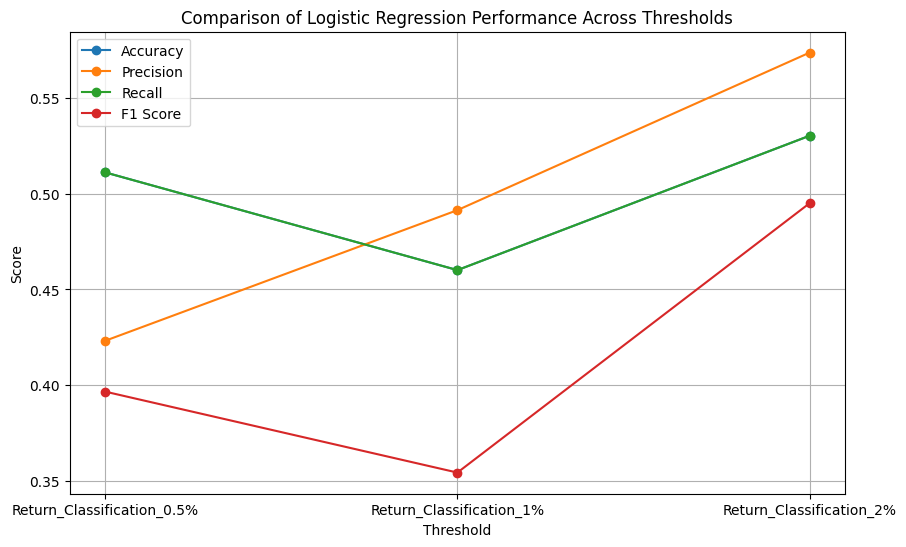

In [ ]:
import matplotlib.pyplot as plt

thresholds = ['Return_Classification_0.5%', 'Return_Classification_1%', 'Return_Classification_2%']

accuracies = [results[th]['Accuracy'] for th in thresholds]
precisions = [results[th]['Precision'] for th in thresholds]
recalls = [results[th]['Recall'] for th in thresholds]
f1_scores = [results[th]['F1 Score'] for th in thresholds]

plt.figure(figsize=(10, 6))

# plot accuracy
plt.plot(thresholds, accuracies, label='Accuracy', marker='o')
plt.plot(thresholds, precisions, label='Precision', marker='o')
plt.plot(thresholds, recalls, label='Recall', marker='o')
plt.plot(thresholds, f1_scores, label='F1 Score', marker='o')

plt.xlabel('Threshold')
plt.ylabel('Score')
plt.title('Comparison of Logistic Regression Performance Across Thresholds')

plt.legend()
plt.grid(True)
plt.show()

In [ ]:
from sklearn.tree import DecisionTreeClassifier

results_dt = {}
for threshold in ['Return_Classification_0.5%', 'Return_Classification_1%', 'Return_Classification_2%']:
    label_encoder = LabelEncoder()
    apple_df[f'{threshold}_Encoded'] = label_encoder.fit_transform(apple_df[threshold])
    X = apple_df[['MA_5', 'MA_10', 'MA_20', 'MA_50', 'Volatility']]
    y = apple_df[f'{threshold}_Encoded']

    X = X.dropna()
    y = y[X.index]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    tree_model = DecisionTreeClassifier(random_state=42)
    tree_model.fit(X_train, y_train)
    y_pred = tree_model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    results_dt[threshold] = {
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }
for threshold, metrics in results_dt.items():
    print(f"\nResults for Decision Tree with {threshold}:")
    print(f"Accuracy: {metrics['Accuracy']:.4f}")
    print(f"Precision: {metrics['Precision']:.4f}")
    print(f"Recall: {metrics['Recall']:.4f}")
    print(f"F1 Score: {metrics['F1 Score']:.4f}")


Results for Decision Tree with Return_Classification_0.5%:
Accuracy: 0.4430
Precision: 0.4442
Recall: 0.4430
F1 Score: 0.4429

Results for Decision Tree with Return_Classification_1%:
Accuracy: 0.3557
Precision: 0.3641
Recall: 0.3557
F1 Score: 0.3577

Results for Decision Tree with Return_Classification_2%:
Accuracy: 0.4195
Precision: 0.4219
Recall: 0.4195
F1 Score: 0.4204


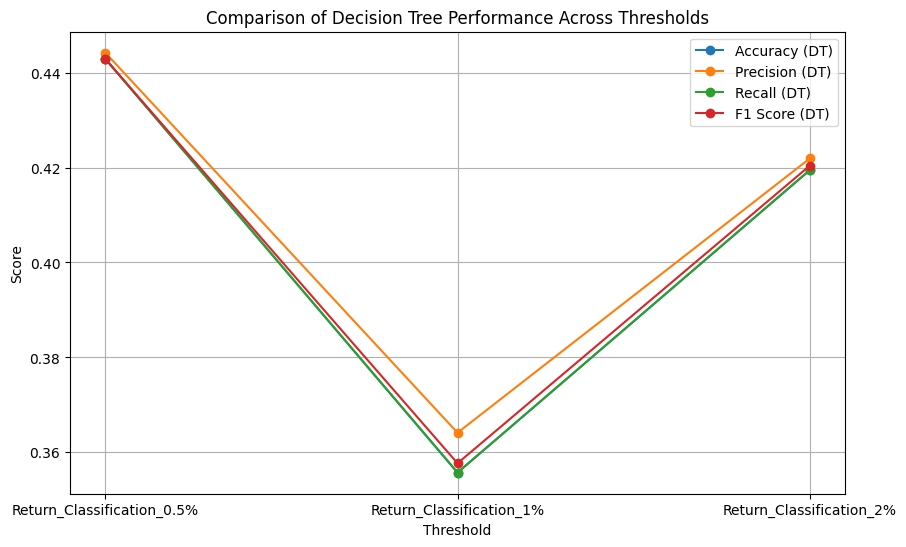

In [ ]:
import matplotlib.pyplot as plt
thresholds = ['Return_Classification_0.5%', 'Return_Classification_1%', 'Return_Classification_2%']

accuracies_dt = [results_dt[th]['Accuracy'] for th in thresholds]
precisions_dt = [results_dt[th]['Precision'] for th in thresholds]
recalls_dt = [results_dt[th]['Recall'] for th in thresholds]
f1_scores_dt = [results_dt[th]['F1 Score'] for th in thresholds]
plt.figure(figsize=(10, 6))

plt.plot(thresholds, accuracies_dt, label='Accuracy (DT)', marker='o')
plt.plot(thresholds, precisions_dt, label='Precision (DT)', marker='o')
plt.plot(thresholds, recalls_dt, label='Recall (DT)', marker='o')
plt.plot(thresholds, f1_scores_dt, label='F1 Score (DT)', marker='o')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.title('Comparison of Decision Tree Performance Across Thresholds')

plt.legend()
plt.grid(True)
plt.show()

In [ ]:
from sklearn.ensemble import RandomForestClassifier

results_rf = {}
for threshold in ['Return_Classification_0.5%', 'Return_Classification_1%', 'Return_Classification_2%']:

    label_encoder = LabelEncoder()
    apple_df[f'{threshold}_Encoded'] = label_encoder.fit_transform(apple_df[threshold])
    X = apple_df[['MA_5', 'MA_10', 'MA_20', 'MA_50', 'Volatility']]
    y = apple_df[f'{threshold}_Encoded']

    X = X.dropna()
    y = y[X.index]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    rf_model = RandomForestClassifier(random_state=42, n_estimators=100)
    rf_model.fit(X_train, y_train)
    y_pred = rf_model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    results_rf[threshold] = {
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

for threshold, metrics in results_rf.items():
    print(f"\nResults for Random Forest with {threshold}:")
    print(f"Accuracy: {metrics['Accuracy']:.4f}")
    print(f"Precision: {metrics['Precision']:.4f}")
    print(f"Recall: {metrics['Recall']:.4f}")
    print(f"F1 Score: {metrics['F1 Score']:.4f}")


Results for Random Forest with Return_Classification_0.5%:
Accuracy: 0.4329
Precision: 0.4162
Recall: 0.4329
F1 Score: 0.4224

Results for Random Forest with Return_Classification_1%:
Accuracy: 0.3658
Precision: 0.3646
Recall: 0.3658
F1 Score: 0.3651

Results for Random Forest with Return_Classification_2%:
Accuracy: 0.4765
Precision: 0.4702
Recall: 0.4765
F1 Score: 0.4728


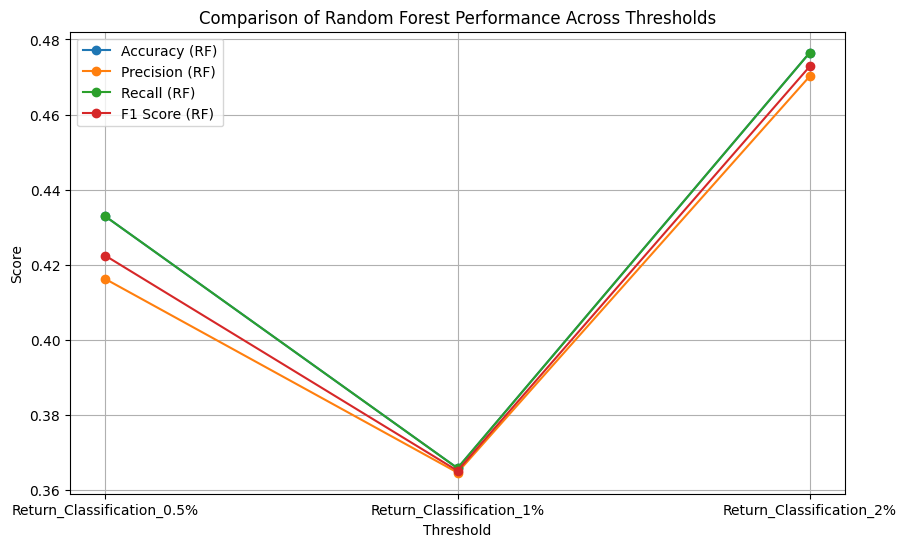

In [ ]:
import matplotlib.pyplot as plt

thresholds = ['Return_Classification_0.5%', 'Return_Classification_1%', 'Return_Classification_2%']

accuracies_rf = [results_rf[th]['Accuracy'] for th in thresholds]
precisions_rf = [results_rf[th]['Precision'] for th in thresholds]
recalls_rf = [results_rf[th]['Recall'] for th in thresholds]
f1_scores_rf = [results_rf[th]['F1 Score'] for th in thresholds]

plt.figure(figsize=(10, 6))
plt.plot(thresholds, accuracies_rf, label='Accuracy (RF)', marker='o')
plt.plot(thresholds, precisions_rf, label='Precision (RF)', marker='o')
plt.plot(thresholds, recalls_rf, label='Recall (RF)', marker='o')
plt.plot(thresholds, f1_scores_rf, label='F1 Score (RF)', marker='o')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.title('Comparison of Random Forest Performance Across Thresholds')

plt.legend()
plt.grid(True)
plt.show()

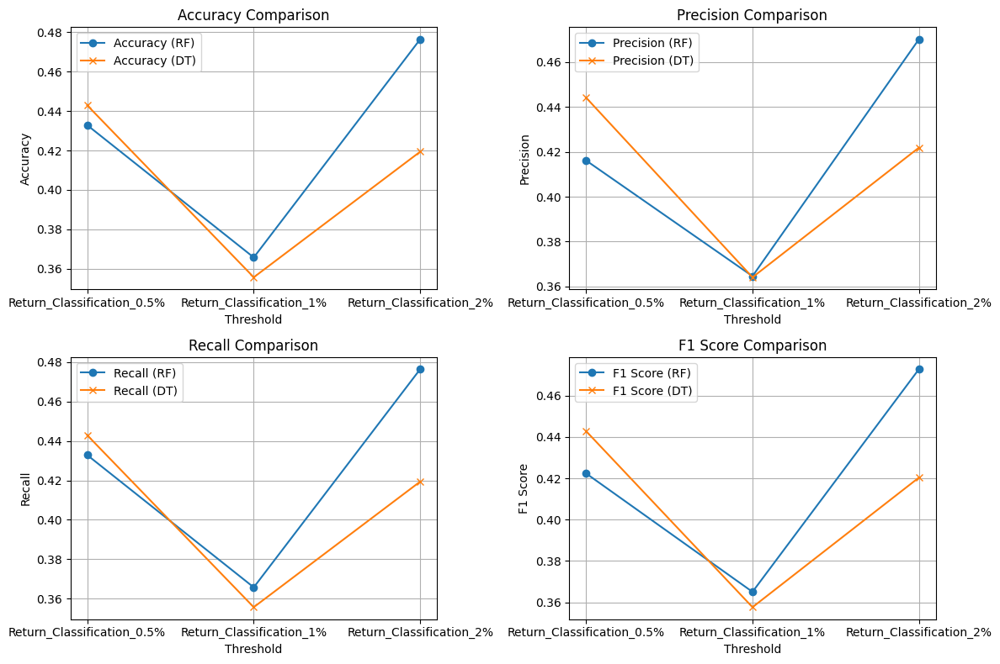

In [ ]:
import matplotlib.pyplot as plt

thresholds = ['Return_Classification_0.5%', 'Return_Classification_1%', 'Return_Classification_2%']

accuracies_rf = [results_rf[th]['Accuracy'] for th in thresholds]
precisions_rf = [results_rf[th]['Precision'] for th in thresholds]
recalls_rf = [results_rf[th]['Recall'] for th in thresholds]
f1_scores_rf = [results_rf[th]['F1 Score'] for th in thresholds]

accuracies_dt = [results_dt[th]['Accuracy'] for th in thresholds]
precisions_dt = [results_dt[th]['Precision'] for th in thresholds]
recalls_dt = [results_dt[th]['Recall'] for th in thresholds]
f1_scores_dt = [results_dt[th]['F1 Score'] for th in thresholds]

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(thresholds, accuracies_rf, label='Accuracy (RF)', marker='o')
plt.plot(thresholds, accuracies_dt, label='Accuracy (DT)', marker='x')
plt.xlabel('Threshold')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison')
plt.legend()
plt.grid(True)

plt.subplot(2, 2, 2)
plt.plot(thresholds, precisions_rf, label='Precision (RF)', marker='o')
plt.plot(thresholds, precisions_dt, label='Precision (DT)', marker='x')
plt.xlabel('Threshold')
plt.ylabel('Precision')
plt.title('Precision Comparison')
plt.legend()
plt.grid(True)

plt.subplot(2, 2, 3)
plt.plot(thresholds, recalls_rf, label='Recall (RF)', marker='o')
plt.plot(thresholds, recalls_dt, label='Recall (DT)', marker='x')
plt.xlabel('Threshold')
plt.ylabel('Recall')
plt.title('Recall Comparison')
plt.legend()
plt.grid(True)

plt.subplot(2, 2, 4)
plt.plot(thresholds, f1_scores_rf, label='F1 Score (RF)', marker='o')
plt.plot(thresholds, f1_scores_dt, label='F1 Score (DT)', marker='x')
plt.xlabel('Threshold')
plt.ylabel('F1 Score')
plt.title('F1 Score Comparison')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

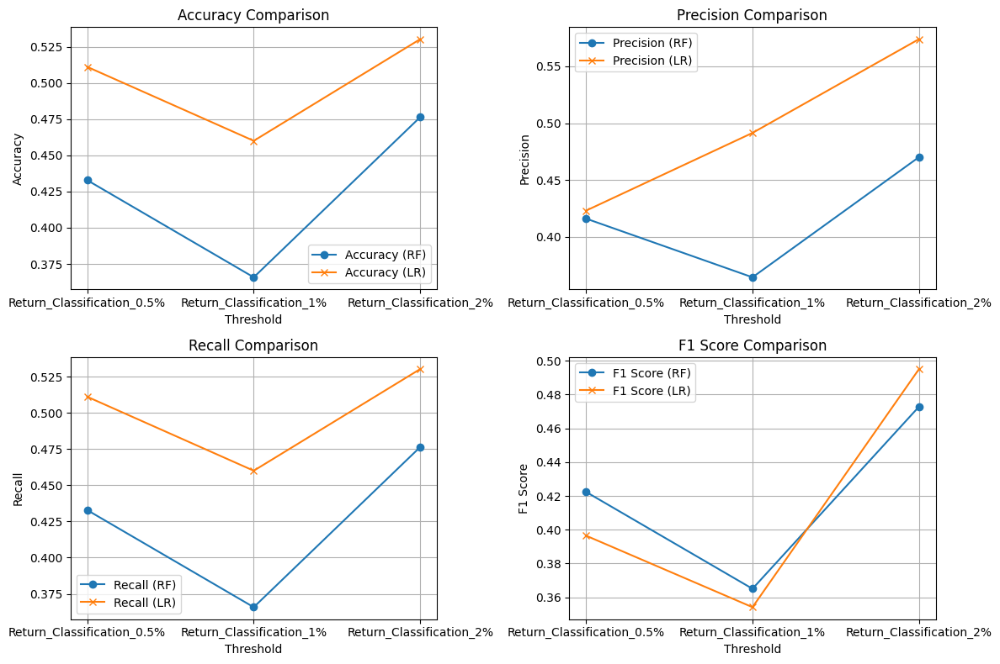

In [ ]:
import matplotlib.pyplot as plt

thresholds = ['Return_Classification_0.5%', 'Return_Classification_1%', 'Return_Classification_2%']

accuracies_rf = [results_rf[th]['Accuracy'] for th in thresholds]
precisions_rf = [results_rf[th]['Precision'] for th in thresholds]
recalls_rf = [results_rf[th]['Recall'] for th in thresholds]
f1_scores_rf = [results_rf[th]['F1 Score'] for th in thresholds]

accuracies_lr = [results[th]['Accuracy'] for th in thresholds]
precisions_lr = [results[th]['Precision'] for th in thresholds]
recalls_lr = [results[th]['Recall'] for th in thresholds]
f1_scores_lr = [results[th]['F1 Score'] for th in thresholds]

plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(thresholds, accuracies_rf, label='Accuracy (RF)', marker='o')
plt.plot(thresholds, accuracies_lr, label='Accuracy (LR)', marker='x')
plt.xlabel('Threshold')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison')
plt.legend()
plt.grid(True)

#precision comparison
plt.subplot(2, 2, 2)
plt.plot(thresholds, precisions_rf, label='Precision (RF)', marker='o')
plt.plot(thresholds, precisions_lr, label='Precision (LR)', marker='x')
plt.xlabel('Threshold')
plt.ylabel('Precision')
plt.title('Precision Comparison')
plt.legend()
plt.grid(True)

# recall comparison
plt.subplot(2, 2, 3)
plt.plot(thresholds, recalls_rf, label='Recall (RF)', marker='o')
plt.plot(thresholds, recalls_lr, label='Recall (LR)', marker='x')
plt.xlabel('Threshold')
plt.ylabel('Recall')
plt.title('Recall Comparison')
plt.legend()
plt.grid(True)

# F1-score comparison
plt.subplot(2, 2, 4)
plt.plot(thresholds, f1_scores_rf, label='F1 Score (RF)', marker='o')
plt.plot(thresholds, f1_scores_lr, label='F1 Score (LR)', marker='x')
plt.xlabel('Threshold')
plt.ylabel('F1 Score')
plt.title('F1 Score Comparison')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.svm import SVC

# performance metrics for SVM
results_svm = {}

for threshold in ['Return_Classification_0.5%', 'Return_Classification_1%', 'Return_Classification_2%']:
    label_encoder = LabelEncoder()
    apple_df[f'{threshold}_Encoded'] = label_encoder.fit_transform(apple_df[threshold])
    X = apple_df[['MA_5', 'MA_10', 'MA_20', 'MA_50', 'Volatility']]
    y = apple_df[f'{threshold}_Encoded']

    X = X.dropna()
    y = y[X.index]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    svm_model = SVC(kernel='linear')
    svm_model.fit(X_train, y_train)

    y_pred = svm_model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    results_svm[threshold] = {
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

for threshold, metrics in results_svm.items():
    print(f"\nResults for SVM with {threshold}:")
    print(f"Accuracy: {metrics['Accuracy']:.4f}")
    print(f"Precision: {metrics['Precision']:.4f}")
    print(f"Recall: {metrics['Recall']:.4f}")
    print(f"F1 Score: {metrics['F1 Score']:.4f}")

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Results for SVM with Return_Classification_0.5%:
Accuracy: 0.5101
Precision: 0.4046
Recall: 0.5101
F1 Score: 0.3848

Results for SVM with Return_Classification_1%:
Accuracy: 0.4228
Precision: 0.3538
Recall: 0.4228
F1 Score: 0.3124

Results for SVM with Return_Classification_2%:
Accuracy: 0.4195
Precision: 0.3831
Recall: 0.4195
F1 Score: 0.3518


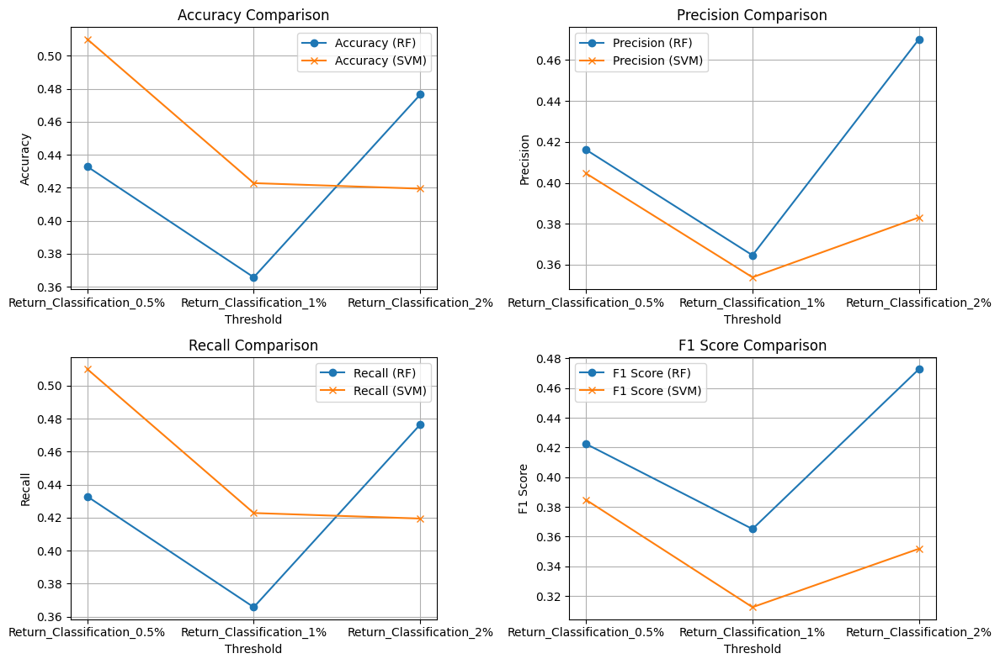

In [ ]:
import matplotlib.pyplot as plt

# metrics for each threshold from both Random Forest and SVM results
thresholds = ['Return_Classification_0.5%', 'Return_Classification_1%', 'Return_Classification_2%']

# Random Forest
accuracies_rf = [results_rf[th]['Accuracy'] for th in thresholds]
precisions_rf = [results_rf[th]['Precision'] for th in thresholds]
recalls_rf = [results_rf[th]['Recall'] for th in thresholds]
f1_scores_rf = [results_rf[th]['F1 Score'] for th in thresholds]

# SVM
accuracies_svm = [results_svm[th]['Accuracy'] for th in thresholds]
precisions_svm = [results_svm[th]['Precision'] for th in thresholds]
recalls_svm = [results_svm[th]['Recall'] for th in thresholds]
f1_scores_svm = [results_svm[th]['F1 Score'] for th in thresholds]

plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(thresholds, accuracies_rf, label='Accuracy (RF)', marker='o')
plt.plot(thresholds, accuracies_svm, label='Accuracy (SVM)', marker='x')
plt.xlabel('Threshold')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison')
plt.legend()
plt.grid(True)

# precision comparison
plt.subplot(2, 2, 2)
plt.plot(thresholds, precisions_rf, label='Precision (RF)', marker='o')
plt.plot(thresholds, precisions_svm, label='Precision (SVM)', marker='x')
plt.xlabel('Threshold')
plt.ylabel('Precision')
plt.title('Precision Comparison')
plt.legend()
plt.grid(True)

# recall comparison
plt.subplot(2, 2, 3)
plt.plot(thresholds, recalls_rf, label='Recall (RF)', marker='o')
plt.plot(thresholds, recalls_svm, label='Recall (SVM)', marker='x')
plt.xlabel('Threshold')
plt.ylabel('Recall')
plt.title('Recall Comparison')
plt.legend()
plt.grid(True)

# F1-score comparison
plt.subplot(2, 2, 4)
plt.plot(thresholds, f1_scores_rf, label='F1 Score (RF)', marker='o')
plt.plot(thresholds, f1_scores_svm, label='F1 Score (SVM)', marker='x')
plt.xlabel('Threshold')
plt.ylabel('F1 Score')
plt.title('F1 Score Comparison')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

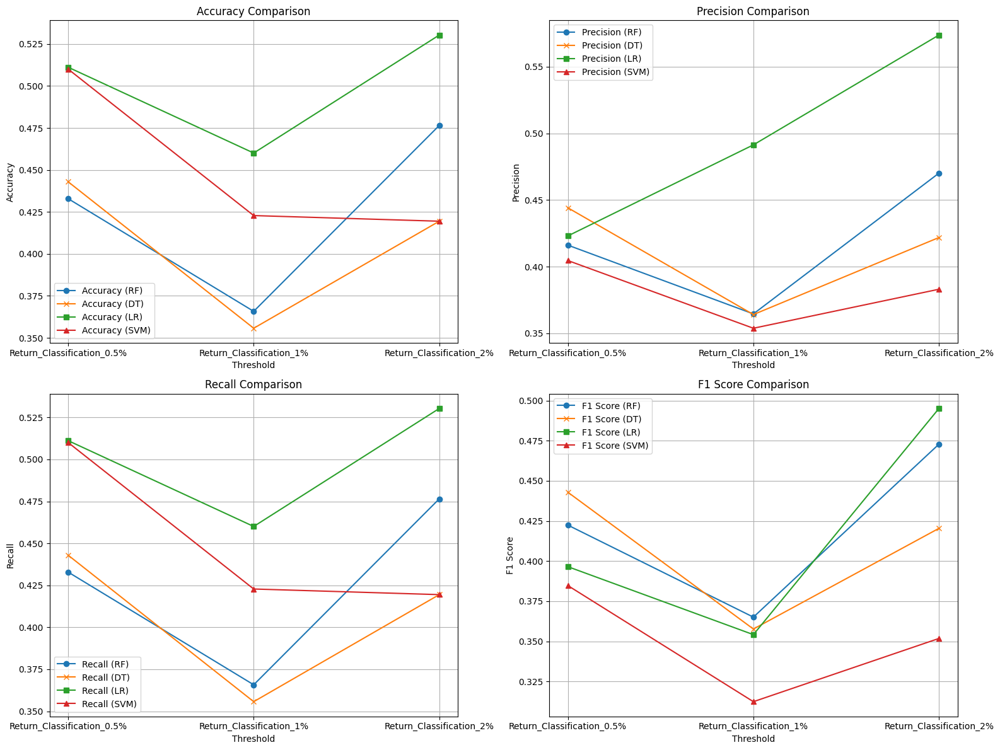

In [ ]:
import matplotlib.pyplot as plt

# threshold from all classifier results
thresholds = ['Return_Classification_0.5%', 'Return_Classification_1%', 'Return_Classification_2%']

# Random Forest
accuracies_rf = [results_rf[th]['Accuracy'] for th in thresholds]
precisions_rf = [results_rf[th]['Precision'] for th in thresholds]
recalls_rf = [results_rf[th]['Recall'] for th in thresholds]
f1_scores_rf = [results_rf[th]['F1 Score'] for th in thresholds]

# Decision Tree
accuracies_dt = [results_dt[th]['Accuracy'] for th in thresholds]
precisions_dt = [results_dt[th]['Precision'] for th in thresholds]
recalls_dt = [results_dt[th]['Recall'] for th in thresholds]
f1_scores_dt = [results_dt[th]['F1 Score'] for th in thresholds]

# Logistic Regression
accuracies_lr = [results[th]['Accuracy'] for th in thresholds]
precisions_lr = [results[th]['Precision'] for th in thresholds]
recalls_lr = [results[th]['Recall'] for th in thresholds]
f1_scores_lr = [results[th]['F1 Score'] for th in thresholds]

# SVM
accuracies_svm = [results_svm[th]['Accuracy'] for th in thresholds]
precisions_svm = [results_svm[th]['Precision'] for th in thresholds]
recalls_svm = [results_svm[th]['Recall'] for th in thresholds]
f1_scores_svm = [results_svm[th]['F1 Score'] for th in thresholds]

plt.figure(figsize=(16, 12))

plt.subplot(2, 2, 1)
plt.plot(thresholds, accuracies_rf, label='Accuracy (RF)', marker='o')
plt.plot(thresholds, accuracies_dt, label='Accuracy (DT)', marker='x')
plt.plot(thresholds, accuracies_lr, label='Accuracy (LR)', marker='s')
plt.plot(thresholds, accuracies_svm, label='Accuracy (SVM)', marker='^')
plt.xlabel('Threshold')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison')
plt.legend()
plt.grid(True)

plt.subplot(2, 2, 2)
plt.plot(thresholds, precisions_rf, label='Precision (RF)', marker='o')
plt.plot(thresholds, precisions_dt, label='Precision (DT)', marker='x')
plt.plot(thresholds, precisions_lr, label='Precision (LR)', marker='s')
plt.plot(thresholds, precisions_svm, label='Precision (SVM)', marker='^')
plt.xlabel('Threshold')
plt.ylabel('Precision')
plt.title('Precision Comparison')
plt.legend()
plt.grid(True)

plt.subplot(2, 2, 3)
plt.plot(thresholds, recalls_rf, label='Recall (RF)', marker='o')
plt.plot(thresholds, recalls_dt, label='Recall (DT)', marker='x')
plt.plot(thresholds, recalls_lr, label='Recall (LR)', marker='s')
plt.plot(thresholds, recalls_svm, label='Recall (SVM)', marker='^')
plt.xlabel('Threshold')
plt.ylabel('Recall')
plt.title('Recall Comparison')
plt.legend()
plt.grid(True)

plt.subplot(2, 2, 4)
plt.plot(thresholds, f1_scores_rf, label='F1 Score (RF)', marker='o')
plt.plot(thresholds, f1_scores_dt, label='F1 Score (DT)', marker='x')
plt.plot(thresholds, f1_scores_lr, label='F1 Score (LR)', marker='s')
plt.plot(thresholds, f1_scores_svm, label='F1 Score (SVM)', marker='^')
plt.xlabel('Threshold')
plt.ylabel('F1 Score')
plt.title('F1 Score Comparison')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
thresholds = [-0.25, 0.25, -0.5, 0.5, -0.75, 0.75, -1.0, 1.0, -1.5, 1.5]

def classify_return(return_value, low, high):
    if return_value > high:
        return "Up"
    elif return_value < low:
        return "Down"
    else:
        return "Stable"

results_lr = {}
results_dt = {}
results_rf = {}
results_svm = {}

for low, high in zip(thresholds[::2], thresholds[1::2]):
    apple_df[f'Return_Classification_{low}_{high}'] = apple_df['Daily_Return'].apply(lambda x: classify_return(x, low, high))

    label_encoder = LabelEncoder()
    apple_df[f'{low}_{high}_Encoded'] = label_encoder.fit_transform(apple_df[f'Return_Classification_{low}_{high}'])

    X = apple_df[['MA_5', 'MA_10', 'MA_20', 'MA_50', 'Volatility']]
    y = apple_df[f'{low}_{high}_Encoded']

    X = X.dropna()
    y = y[X.index]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Logistic Regression
    logistic_model = LogisticRegression(max_iter=1000)
    logistic_model.fit(X_train, y_train)
    y_pred_lr = logistic_model.predict(X_test)
    results_lr[f'{low}_{high}'] = {
        'Accuracy': accuracy_score(y_test, y_pred_lr),
        'Precision': precision_score(y_test, y_pred_lr, average='weighted'),
        'Recall': recall_score(y_test, y_pred_lr, average='weighted'),
        'F1 Score': f1_score(y_test, y_pred_lr, average='weighted')
    }

    # Decision Tree
    tree_model = DecisionTreeClassifier(random_state=42)
    tree_model.fit(X_train, y_train)
    y_pred_dt = tree_model.predict(X_test)
    results_dt[f'{low}_{high}'] = {
        'Accuracy': accuracy_score(y_test, y_pred_dt),
        'Precision': precision_score(y_test, y_pred_dt, average='weighted'),
        'Recall': recall_score(y_test, y_pred_dt, average='weighted'),
        'F1 Score': f1_score(y_test, y_pred_dt, average='weighted')
    }

    # Random Forest
    rf_model = RandomForestClassifier(random_state=42, n_estimators=100)
    rf_model.fit(X_train, y_train)
    y_pred_rf = rf_model.predict(X_test)
    results_rf[f'{low}_{high}'] = {
        'Accuracy': accuracy_score(y_test, y_pred_rf),
        'Precision': precision_score(y_test, y_pred_rf, average='weighted'),
        'Recall': recall_score(y_test, y_pred_rf, average='weighted'),
        'F1 Score': f1_score(y_test, y_pred_rf, average='weighted')
    }

    # SVM
    svm_model = SVC(kernel='linear')
    svm_model.fit(X_train, y_train)
    y_pred_svm = svm_model.predict(X_test)
    results_svm[f'{low}_{high}'] = {
        'Accuracy': accuracy_score(y_test, y_pred_svm),
        'Precision': precision_score(y_test, y_pred_svm, average='weighted'),
        'Recall': recall_score(y_test, y_pred_svm, average='weighted'),
        'F1 Score': f1_score(y_test, y_pred_svm, average='weighted')
    }

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning

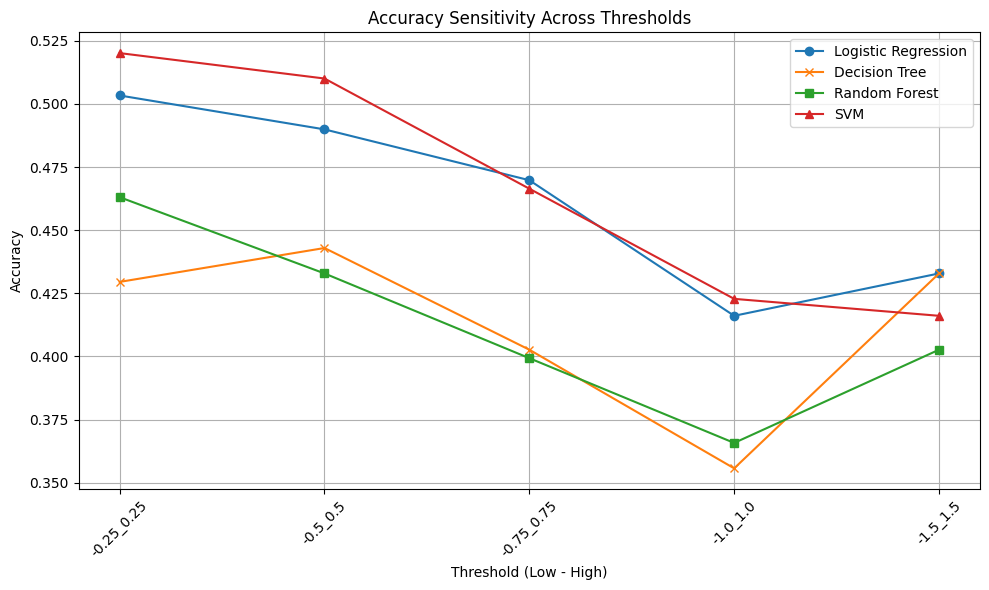

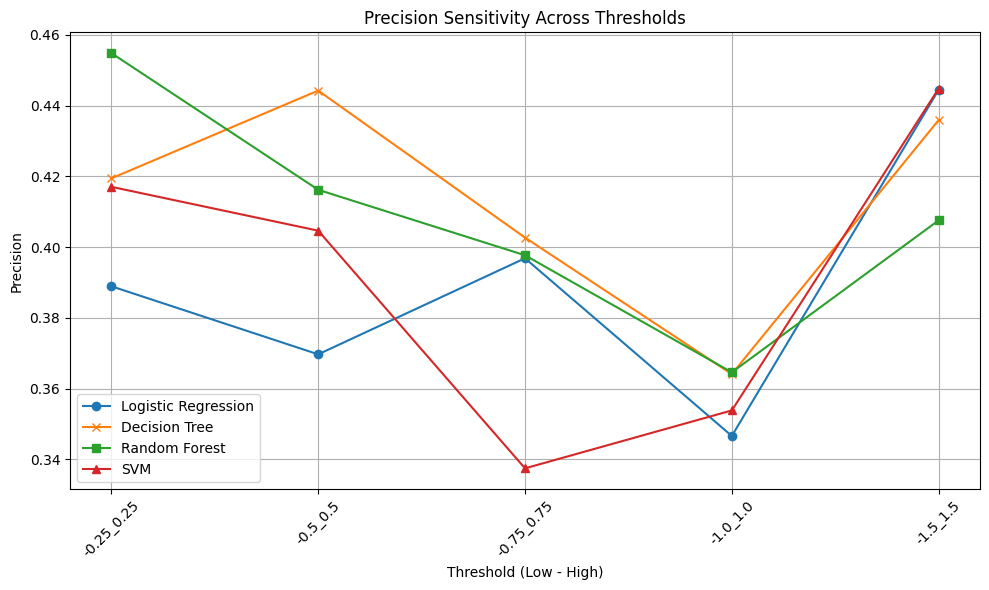

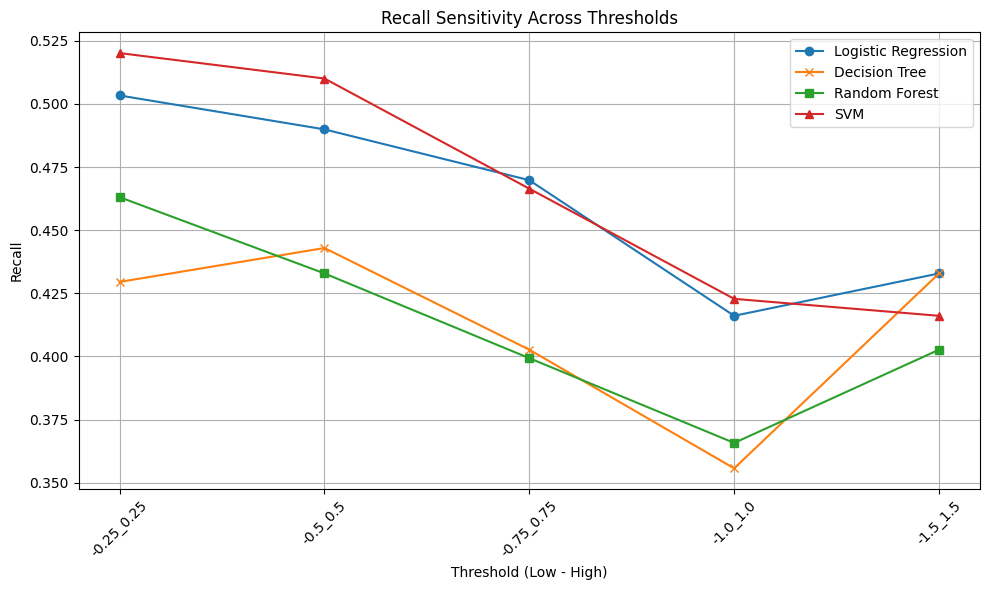

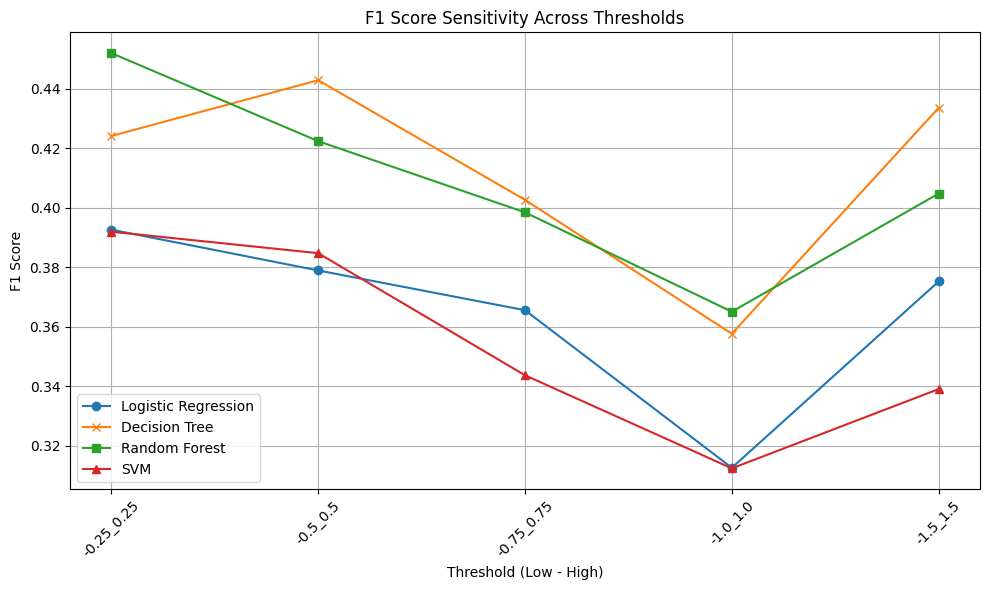

In [ ]:
import matplotlib.pyplot as plt

# Create lists of thresholds for visualization
threshold_labels = [f'{low}_{high}' for low, high in zip(thresholds[::2], thresholds[1::2])]

# Create a function to plot the sensitivity analysis
def plot_sensitivity(metric, results_lr, results_dt, results_rf, results_svm):
    metric_lr = [results_lr[t][metric] for t in threshold_labels]
    metric_dt = [results_dt[t][metric] for t in threshold_labels]
    metric_rf = [results_rf[t][metric] for t in threshold_labels]
    metric_svm = [results_svm[t][metric] for t in threshold_labels]

    plt.figure(figsize=(10, 6))
    plt.plot(threshold_labels, metric_lr, label='Logistic Regression', marker='o')
    plt.plot(threshold_labels, metric_dt, label='Decision Tree', marker='x')
    plt.plot(threshold_labels, metric_rf, label='Random Forest', marker='s')
    plt.plot(threshold_labels, metric_svm, label='SVM', marker='^')
    plt.xlabel('Threshold (Low - High)')
    plt.ylabel(metric)
    plt.title(f'{metric} Sensitivity Across Thresholds')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Visualize Accuracy, Precision, Recall, F1 Score sensitivity for all classifiers
plot_sensitivity('Accuracy', results_lr, results_dt, results_rf, results_svm)
plot_sensitivity('Precision', results_lr, results_dt, results_rf, results_svm)
plot_sensitivity('Recall', results_lr, results_dt, results_rf, results_svm)
plot_sensitivity('F1 Score', results_lr, results_dt, results_rf, results_svm)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning

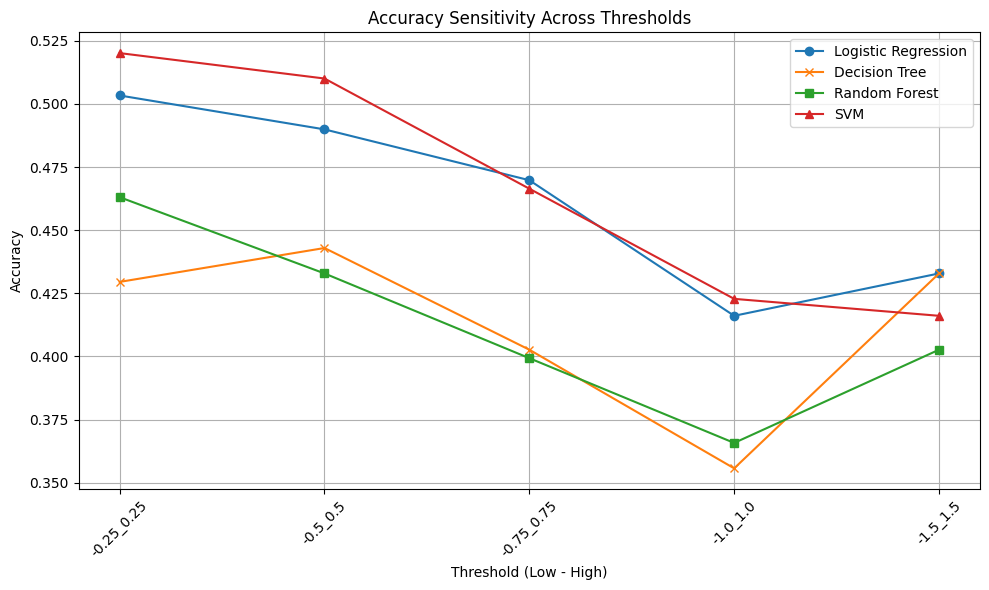

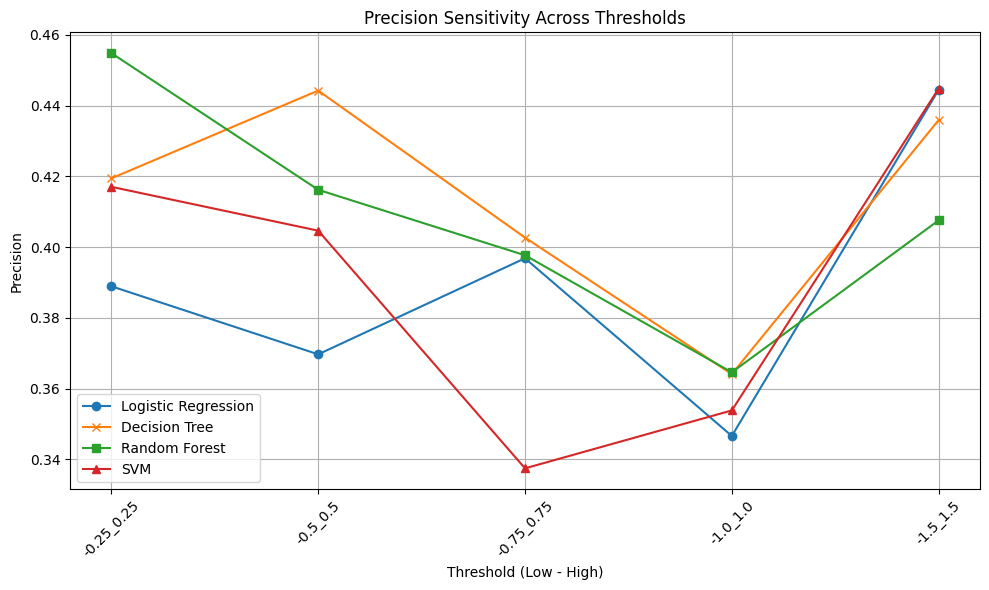

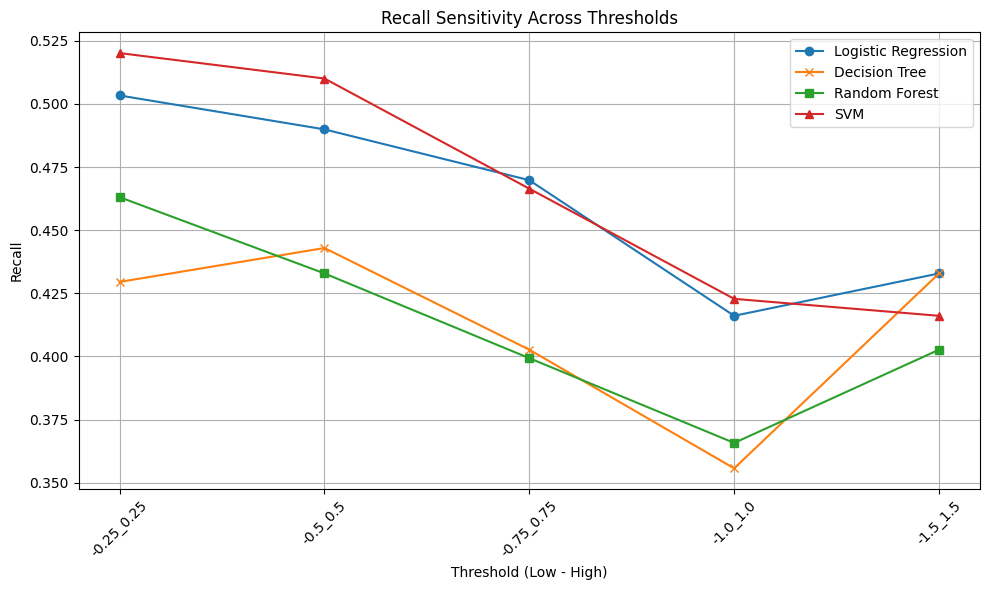

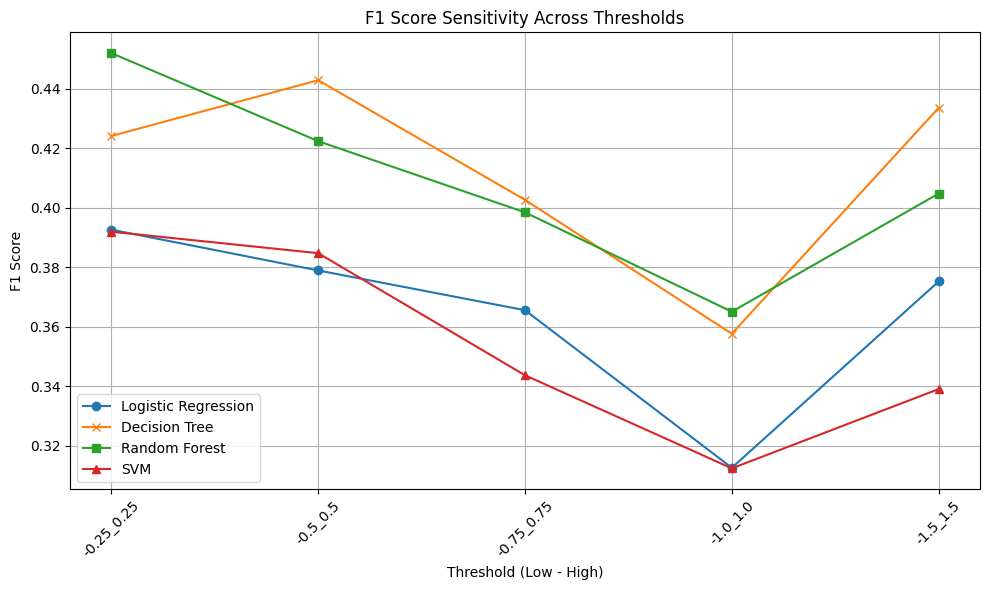

In [ ]:
import matplotlib.pyplot as plt

# Define additional thresholds for fine-grained sensitivity analysis
thresholds = [-0.25, 0.25, -0.5, 0.5, -0.75, 0.75, -1.0, 1.0, -1.5, 1.5]

# Function to apply classification based on the thresholds
def classify_return(return_value, low, high):
    if return_value > high:
        return "Up"
    elif return_value < low:
        return "Down"
    else:
        return "Stable"

# Initialize results dictionaries for each classifier
results_lr = {}
results_dt = {}
results_rf = {}
results_svm = {}

# Loop through each threshold and evaluate all classifiers
for low, high in zip(thresholds[::2], thresholds[1::2]):
    # Apply classification for each threshold
    apple_df[f'Return_Classification_{low}_{high}'] = apple_df['Daily_Return'].apply(lambda x: classify_return(x, low, high))

    # Encode the target variable for each threshold
    label_encoder = LabelEncoder()
    apple_df[f'{low}_{high}_Encoded'] = label_encoder.fit_transform(apple_df[f'Return_Classification_{low}_{high}'])

    # Select features and target
    X = apple_df[['MA_5', 'MA_10', 'MA_20', 'MA_50', 'Volatility']]
    y = apple_df[f'{low}_{high}_Encoded']

    # Handle missing values
    X = X.dropna()
    y = y[X.index]

    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Logistic Regression
    logistic_model = LogisticRegression(max_iter=1000)
    logistic_model.fit(X_train, y_train)
    y_pred_lr = logistic_model.predict(X_test)
    results_lr[f'{low}_{high}'] = {
        'Accuracy': accuracy_score(y_test, y_pred_lr),
        'Precision': precision_score(y_test, y_pred_lr, average='weighted'),
        'Recall': recall_score(y_test, y_pred_lr, average='weighted'),
        'F1 Score': f1_score(y_test, y_pred_lr, average='weighted')
    }

    # Decision Tree
    tree_model = DecisionTreeClassifier(random_state=42)
    tree_model.fit(X_train, y_train)
    y_pred_dt = tree_model.predict(X_test)
    results_dt[f'{low}_{high}'] = {
        'Accuracy': accuracy_score(y_test, y_pred_dt),
        'Precision': precision_score(y_test, y_pred_dt, average='weighted'),
        'Recall': recall_score(y_test, y_pred_dt, average='weighted'),
        'F1 Score': f1_score(y_test, y_pred_dt, average='weighted')
    }

    # Random Forest
    rf_model = RandomForestClassifier(random_state=42, n_estimators=100)
    rf_model.fit(X_train, y_train)
    y_pred_rf = rf_model.predict(X_test)
    results_rf[f'{low}_{high}'] = {
        'Accuracy': accuracy_score(y_test, y_pred_rf),
        'Precision': precision_score(y_test, y_pred_rf, average='weighted'),
        'Recall': recall_score(y_test, y_pred_rf, average='weighted'),
        'F1 Score': f1_score(y_test, y_pred_rf, average='weighted')
    }

    # SVM
    svm_model = SVC(kernel='linear')
    svm_model.fit(X_train, y_train)
    y_pred_svm = svm_model.predict(X_test)
    results_svm[f'{low}_{high}'] = {
        'Accuracy': accuracy_score(y_test, y_pred_svm),
        'Precision': precision_score(y_test, y_pred_svm, average='weighted'),
        'Recall': recall_score(y_test, y_pred_svm, average='weighted'),
        'F1 Score': f1_score(y_test, y_pred_svm, average='weighted')
    }

# Visualization function to plot sensitivity analysis
def plot_sensitivity(metric, results_lr, results_dt, results_rf, results_svm):
    threshold_labels = [f'{low}_{high}' for low, high in zip(thresholds[::2], thresholds[1::2])]
    metric_lr = [results_lr[t][metric] for t in threshold_labels]
    metric_dt = [results_dt[t][metric] for t in threshold_labels]
    metric_rf = [results_rf[t][metric] for t in threshold_labels]
    metric_svm = [results_svm[t][metric] for t in threshold_labels]

    plt.figure(figsize=(10, 6))
    plt.plot(threshold_labels, metric_lr, label='Logistic Regression', marker='o')
    plt.plot(threshold_labels, metric_dt, label='Decision Tree', marker='x')
    plt.plot(threshold_labels, metric_rf, label='Random Forest', marker='s')
    plt.plot(threshold_labels, metric_svm, label='SVM', marker='^')
    plt.xlabel('Threshold (Low - High)')
    plt.ylabel(metric)
    plt.title(f'{metric} Sensitivity Across Thresholds')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Visualize Accuracy, Precision, Recall, F1 Score sensitivity for all classifiers
plot_sensitivity('Accuracy', results_lr, results_dt, results_rf, results_svm)
plot_sensitivity('Precision', results_lr, results_dt, results_rf, results_svm)
plot_sensitivity('Recall', results_lr, results_dt, results_rf, results_svm)
plot_sensitivity('F1 Score', results_lr, results_dt, results_rf, results_svm)

In [ ]:
# Function to find the best threshold based on a chosen metric (e.g., F1 Score)
def find_best_threshold(results, metric):
    best_threshold = None
    best_score = 0
    for threshold, metrics in results.items():
        if metrics[metric] > best_score:
            best_score = metrics[metric]
            best_threshold = threshold
    return best_threshold, best_score

# Find the best threshold for each classifier based on F1 Score
best_threshold_lr, best_f1_lr = find_best_threshold(results_lr, 'F1 Score')
best_threshold_dt, best_f1_dt = find_best_threshold(results_dt, 'F1 Score')
best_threshold_rf, best_f1_rf = find_best_threshold(results_rf, 'F1 Score')
best_threshold_svm, best_f1_svm = find_best_threshold(results_svm, 'F1 Score')

# Print the results
print(f"Best Threshold for Logistic Regression: {best_threshold_lr} with F1 Score: {best_f1_lr:.4f}")
print(f"Best Threshold for Decision Tree: {best_threshold_dt} with F1 Score: {best_f1_dt:.4f}")
print(f"Best Threshold for Random Forest: {best_threshold_rf} with F1 Score: {best_f1_rf:.4f}")
print(f"Best Threshold for SVM: {best_threshold_svm} with F1 Score: {best_f1_svm:.4f}")

Best Threshold for Logistic Regression: -0.25_0.25 with F1 Score: 0.3927
Best Threshold for Decision Tree: -0.5_0.5 with F1 Score: 0.4429
Best Threshold for Random Forest: -0.25_0.25 with F1 Score: 0.4520
Best Threshold for SVM: -0.25_0.25 with F1 Score: 0.3920


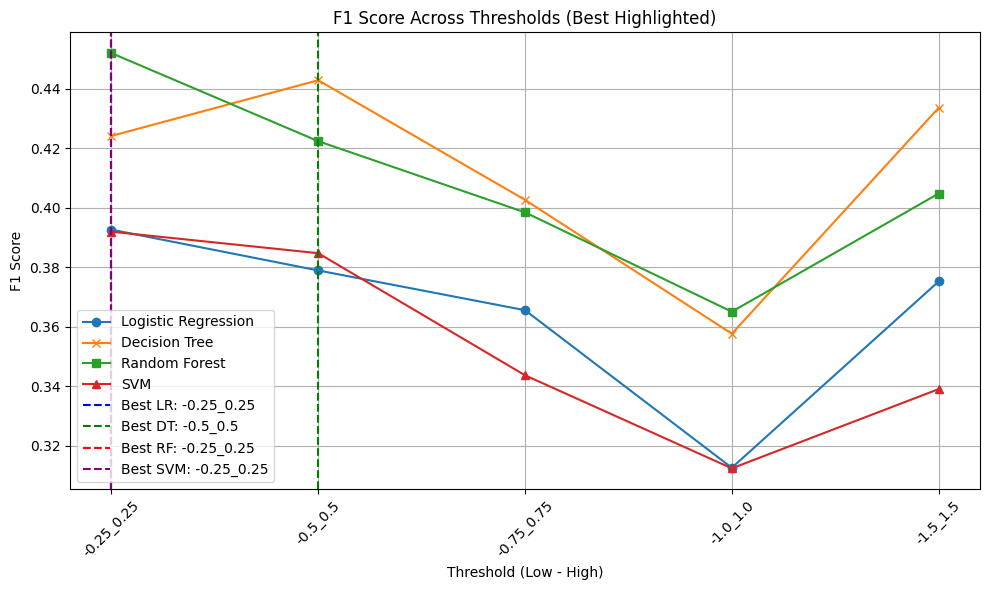

In [ ]:
# Create lists of thresholds for visualization
threshold_labels = [f'{low}_{high}' for low, high in zip(thresholds[::2], thresholds[1::2])]

# Collect F1 Scores for each classifier
f1_lr = [results_lr[threshold]['F1 Score'] for threshold in threshold_labels]
f1_dt = [results_dt[threshold]['F1 Score'] for threshold in threshold_labels]
f1_rf = [results_rf[threshold]['F1 Score'] for threshold in threshold_labels]
f1_svm = [results_svm[threshold]['F1 Score'] for threshold in threshold_labels]

# Plot the F1 Scores across thresholds
plt.figure(figsize=(10, 6))
plt.plot(threshold_labels, f1_lr, label='Logistic Regression', marker='o')
plt.plot(threshold_labels, f1_dt, label='Decision Tree', marker='x')
plt.plot(threshold_labels, f1_rf, label='Random Forest', marker='s')
plt.plot(threshold_labels, f1_svm, label='SVM', marker='^')

# Highlight the best threshold for each classifier
plt.axvline(x=best_threshold_lr, color='blue', linestyle='--', label=f'Best LR: {best_threshold_lr}')
plt.axvline(x=best_threshold_dt, color='green', linestyle='--', label=f'Best DT: {best_threshold_dt}')
plt.axvline(x=best_threshold_rf, color='red', linestyle='--', label=f'Best RF: {best_threshold_rf}')
plt.axvline(x=best_threshold_svm, color='purple', linestyle='--', label=f'Best SVM: {best_threshold_svm}')

plt.xlabel('Threshold (Low - High)')
plt.ylabel('F1 Score')
plt.title('F1 Score Across Thresholds (Best Highlighted)')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# Define new class labels based on return thresholds (for example, 33rd and 66th percentiles)
def classify_high_low_avg(return_value, low_thresh, high_thresh):
    if return_value > high_thresh:
        return "High"
    elif return_value < low_thresh:
        return "Low"
    else:
        return "Average"

# Calculate the 33rd and 66th percentiles of the 'Daily_Return' to create classes
low_threshold = apple_df['Daily_Return'].quantile(0.33)
high_threshold = apple_df['Daily_Return'].quantile(0.66)

# Apply the classification function to the dataset
apple_df['Return_Classification_H_L_Avg'] = apple_df['Daily_Return'].apply(lambda x: classify_high_low_avg(x, low_threshold, high_threshold))

# Encode the new class labels for modeling
label_encoder = LabelEncoder()
apple_df['H_L_Avg_Encoded'] = label_encoder.fit_transform(apple_df['Return_Classification_H_L_Avg'])

In [ ]:
# Select features and the new target
X = apple_df[['MA_5', 'MA_10', 'MA_20', 'MA_50', 'Volatility']]
y = apple_df['H_L_Avg_Encoded']

# Handle missing values
X = X.dropna()
y = y[X.index]

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize results dictionary to store performance metrics
results_classes = {}

# Logistic Regression
logistic_model = LogisticRegression(max_iter=1000)
logistic_model.fit(X_train, y_train)
y_pred_lr = logistic_model.predict(X_test)
results_classes['Logistic Regression'] = {
    'Accuracy': accuracy_score(y_test, y_pred_lr),
    'Precision': precision_score(y_test, y_pred_lr, average='weighted'),
    'Recall': recall_score(y_test, y_pred_lr, average='weighted'),
    'F1 Score': f1_score(y_test, y_pred_lr, average='weighted')
}

# Decision Tree
tree_model = DecisionTreeClassifier(random_state=42)
tree_model.fit(X_train, y_train)
y_pred_dt = tree_model.predict(X_test)
results_classes['Decision Tree'] = {
    'Accuracy': accuracy_score(y_test, y_pred_dt),
    'Precision': precision_score(y_test, y_pred_dt, average='weighted'),
    'Recall': recall_score(y_test, y_pred_dt, average='weighted'),
    'F1 Score': f1_score(y_test, y_pred_dt, average='weighted')
}

# Random Forest
rf_model = RandomForestClassifier(random_state=42, n_estimators=100)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
results_classes['Random Forest'] = {
    'Accuracy': accuracy_score(y_test, y_pred_rf),
    'Precision': precision_score(y_test, y_pred_rf, average='weighted'),
    'Recall': recall_score(y_test, y_pred_rf, average='weighted'),
    'F1 Score': f1_score(y_test, y_pred_rf, average='weighted')
}

# SVM
svm_model = SVC(kernel='linear')
svm_model.fit(X_train, y_train)
y_pred_svm = svm_model.predict(X_test)
results_classes['SVM'] = {
    'Accuracy': accuracy_score(y_test, y_pred_svm),
    'Precision': precision_score(y_test, y_pred_svm, average='weighted'),
    'Recall': recall_score(y_test, y_pred_svm, average='weighted'),
    'F1 Score': f1_score(y_test, y_pred_svm, average='weighted')
}

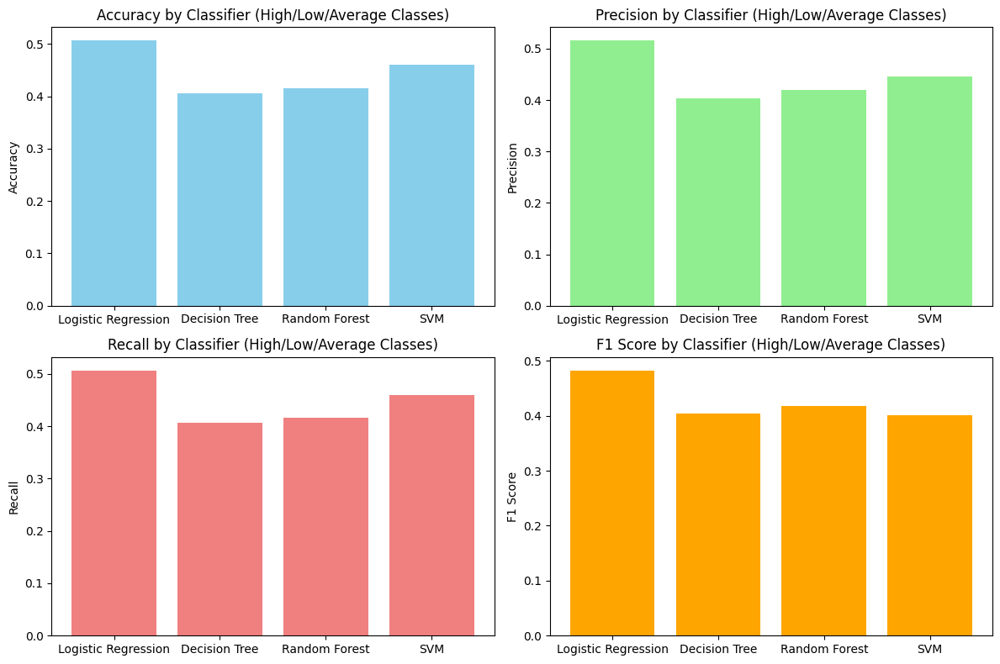

In [ ]:
import matplotlib.pyplot as plt

# Extract the metrics for each classifier
classifiers = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'SVM']
accuracy = [results_classes[clf]['Accuracy'] for clf in classifiers]
precision = [results_classes[clf]['Precision'] for clf in classifiers]
recall = [results_classes[clf]['Recall'] for clf in classifiers]
f1_score = [results_classes[clf]['F1 Score'] for clf in classifiers]

# Create a bar plot for each metric
plt.figure(figsize=(12, 8))

# Accuracy
plt.subplot(2, 2, 1)
plt.bar(classifiers, accuracy, color='skyblue')
plt.title('Accuracy by Classifier (High/Low/Average Classes)')
plt.ylabel('Accuracy')

# Precision
plt.subplot(2, 2, 2)
plt.bar(classifiers, precision, color='lightgreen')
plt.title('Precision by Classifier (High/Low/Average Classes)')
plt.ylabel('Precision')

# Recall
plt.subplot(2, 2, 3)
plt.bar(classifiers, recall, color='lightcoral')
plt.title('Recall by Classifier (High/Low/Average Classes)')
plt.ylabel('Recall')

# F1 Score
plt.subplot(2, 2, 4)
plt.bar(classifiers, f1_score, color='orange')
plt.title('F1 Score by Classifier (High/Low/Average Classes)')
plt.ylabel('F1 Score')

# Adjust layout
plt.tight_layout()
plt.show()

In [ ]:
# Check the distribution of the new "High/Low/Average" classes
class_distribution = apple_df['Return_Classification_H_L_Avg'].value_counts(normalize=True) * 100
print("Class Distribution (in %):")
print(class_distribution)

from sklearn.utils import resample

# Concatenate the training data
train_data = pd.concat([X_train, y_train], axis=1)

# Separate majority and minority classes
majority_class = train_data[train_data['H_L_Avg_Encoded'] == 0]  # Assume 0 is the majority class
minority_class = train_data[train_data['H_L_Avg_Encoded'] != 0]

# Oversample the minority class
minority_oversampled = resample(minority_class, replace=True, n_samples=len(majority_class), random_state=42)

# Combine majority and oversampled minority
oversampled_train_data = pd.concat([majority_class, minority_oversampled])

# Separate the features and target again
X_train_oversampled = oversampled_train_data.drop('H_L_Avg_Encoded', axis=1)
y_train_oversampled = oversampled_train_data['H_L_Avg_Encoded']

Class Distribution (in %):
Return_Classification_H_L_Avg
High       33.973129
Average    33.013436
Low        33.013436
Name: proportion, dtype: float64


In [ ]:
# Logistic Regression with class weights
logistic_model = LogisticRegression(max_iter=1000, class_weight='balanced')
logistic_model.fit(X_train, y_train)

# Random Forest with class weights
rf_model = RandomForestClassifier(random_state=42, n_estimators=100, class_weight='balanced')
rf_model.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', random_state=42)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

# Predict using a classifier (e.g., Logistic Regression)
y_pred = logistic_model.predict(X_test)

# Print classification report
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

# Confusion matrix
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

     Average       0.57      0.66      0.61        99
        High       0.46      0.60      0.52        94
         Low       0.47      0.28      0.35       105

    accuracy                           0.50       298
   macro avg       0.50      0.51      0.49       298
weighted avg       0.50      0.50      0.49       298

Confusion Matrix:
[[65 19 15]
 [20 56 18]
 [30 46 29]]


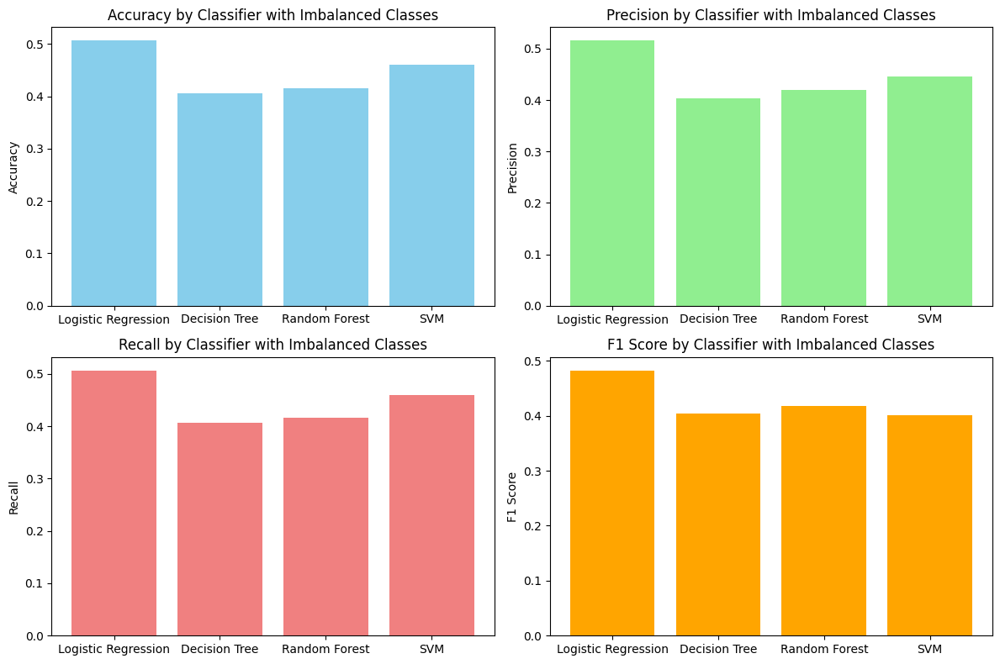

In [ ]:
import matplotlib.pyplot as plt

# Visualize the impact of class imbalance on each classifier
classifiers = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'SVM']
accuracy = [results_classes[clf]['Accuracy'] for clf in classifiers]
precision = [results_classes[clf]['Precision'] for clf in classifiers]
recall = [results_classes[clf]['Recall'] for clf in classifiers]
f1_score = [results_classes[clf]['F1 Score'] for clf in classifiers]

# Create bar plots for accuracy, precision, recall, and F1-score
plt.figure(figsize=(12, 8))

# Accuracy
plt.subplot(2, 2, 1)
plt.bar(classifiers, accuracy, color='skyblue')
plt.title('Accuracy by Classifier with Imbalanced Classes')
plt.ylabel('Accuracy')

# Precision
plt.subplot(2, 2, 2)
plt.bar(classifiers, precision, color='lightgreen')
plt.title('Precision by Classifier with Imbalanced Classes')
plt.ylabel('Precision')

# Recall
plt.subplot(2, 2, 3)
plt.bar(classifiers, recall, color='lightcoral')
plt.title('Recall by Classifier with Imbalanced Classes')
plt.ylabel('Recall')

# F1 Score
plt.subplot(2, 2, 4)
plt.bar(classifiers, f1_score, color='orange')
plt.title('F1 Score by Classifier with Imbalanced Classes')
plt.ylabel('F1 Score')

plt.tight_layout()
plt.show()